In [1]:
import numpy as np
import pandas as pd
import scipy as sp
from scipy import stats
from sklearn.decomposition import PCA
from itertools import combinations

import anndata
import scanpy as sc

import seaborn as sns
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import DivergingNorm
from matplotlib import cm

# Scanpy settings
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

celltype = 'cd8'
master_dir = ''

scanpy==1.6.0 anndata==0.7.5 umap==0.4.6 numpy==1.19.4 scipy==1.5.4 pandas==1.1.4 scikit-learn==0.23.2 statsmodels==0.12.1 python-igraph==0.8.3 louvain==0.7.0


In [1005]:
from scipy.stats import spearmanr, pearsonr, mannwhitneyu

# K means clustering for PCA followup analyses
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score

In [697]:
#import heatmapz as heatmap
import heatmap
from statannot import add_stat_annotation

In [934]:
import warnings
warnings.simplefilter('ignore')

In [4]:
# Read the serum metabolites plot
df_serum = pd.read_csv(master_dir + 'data/validation_metabolites/metabolomics_2020-09-05.MANUAL.CHEMICAL_NAMES.tsv', 
                       sep='\t')
df_serum.index=df_serum['sample_id']
df_serum = df_serum.drop(columns=['sample_id', 'public_client_id'], axis=1)
df_serum.head()

,S-1-pyrroline-5-carboxylate,spermidine,1-methylnicotinamide,"12,13-DiHOME",5-hydroxyindoleacetate,alpha-ketoglutarate,kynurenate,3-hydroxyisobutyrate,3-hydroxy-3-methylglutarate,homovanillate (HVA),...,"bilirubin degradation product, C16H18N2O5 (2)**","bilirubin degradation product, C17H18N2O4 (1)**","bilirubin degradation product, C17H18N2O4 (2)**","bilirubin degradation product, C17H18N2O4 (3)**","bilirubin degradation product, C17H20N2O5 (1)**","bilirubin degradation product, C17H20N2O5 (2)**",tetrahydrocortisol glucuronide,"N,N-dimethyl-pro-pro",oxindolylalanine,tetrahydrocortisone glucuronide (5)
sample_id,,,,,,,,,,,,,,,,,,,,,
INCOV001-AC,0.889612,0.667237,0.436160,0.941759,NaN,1.862825,NaN,0.952670,2.578744,3.709393,...,1.278922,1.498499,1.656242,1.207441,1.320341,1.560157,1.079439,2.162704,0.589965,1.303336
INCOV001-BL,NaN,1.069591,0.403287,0.680598,0.875862,1.435992,1.810513,1.441880,1.603509,2.173915,...,1.446093,1.830923,1.845439,1.369932,1.617032,1.673843,1.565146,3.380592,0.570170,1.144526
INCOV001-CV,1.246912,0.538896,0.324003,3.516137,0.699785,1.174962,1.338941,0.513369,1.782423,2.980509,...,0.640784,0.751291,0.692412,0.730941,0.425523,NaN,NaN,1.708002,1.449244,1.527680
INCOV002-AC,1.947838,0.318462,NaN,1.930940,0.548091,6.236408,1.460961,1.891234,1.062238,0.544276,...,0.453962,0.459911,0.549555,0.493202,0.411877,0.515590,1.217009,0.965470,1.442823,0.984348
INCOV002-BL,NaN,0.686773,2.276374,1.193626,0.461479,0.654987,1.005636,1.819546,0.758030,1.083164,...,0.385904,0.194710,0.176604,0.236984,0.143750,0.143877,0.745335,1.503450,1.150808,NaN


In [5]:
adata_metab = sc.read_h5ad(master_dir + 'output/' + celltype + '-processed-analyzed-metab.h5ad')
adata = sc.read_h5ad(master_dir + 'output/' + celltype + '-processed-analyzed.h5ad')
adata_metab

AnnData object with n_obs × n_vars = 25966 × 1387
    obs: 'patient', 'ICU_status', 'IL6i_between_draws', 'no_IL6i', 'WHO_scale', 'Blood_draw_time', 'Sex', 'Age_at_baseline', 'Days_since_onset_of_symptoms', 'louvain', 'Days_since_onset_float', 'umap_density_ICU_status'
    uns: 'ICU_status_colors', 'louvain', 'louvain_colors', 'neighbors', 'patient_colors', 'pca', 'rank_genes_groups', 'umap', 'umap_density_ICU_status_params'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [6]:
# Map the metabolite sample_ids with the anndata
sample_map = pd.read_csv(master_dir + 'data/validation_metabolites/observations_2020-09-04_1027.tsv',
                        sep='\t')
sample_map.head()

,source_label,observation_id,incov_redcap_event_name,observation_days_since_enrollment,abdominal_pain,ambulatory,blood_draw_status,blood_draw_status_bad,blood_draw_type,blood_oxygenation,...,pulse,respiratory_rate,respiratory_support,sputum,systolic_bp,temperature,temperature_max,temperature_min,weight,who_ordinal_scale
0,INCOV001,d79653c2-9fd2-42d4-bc55-389c3a195199,admittance_arm_1,-8.42,No,Limitation of activities,NaN,NaN,NaN,96.0,...,69.0,20.0,None,No,138.0,36.8,37.1,36.8,97.5,3
1,INCOV001,0136c6b6-5c01-42ca-a1ea-d1286f193041,baseline_blood_dra_arm_1,0.92,No,Limitation of activities,Complete,NaN,Baseline,95.0,...,55.0,22.0,None,No,139.0,36.6,36.6,36.4,97.5,3
2,INCOV001,d372353b-edf7-4d01-adc9-567603c30bc7,acute_blood_draw_arm_1,5.92,No,Limitation of activities,Complete,NaN,Acute,96.0,...,66.0,18.0,None,No,140.0,36.3,36.6,36.3,97.5,3
3,INCOV001,0c738d29-36ec-4de2-8c0a-b0e4fa76ebd2,convalescent_blood_arm_1,105.21,Unknown,NaN,Complete,NaN,Convalescent,NaN,...,NaN,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN,<=2
4,INCOV002,febb8188-16ae-48e5-8a73-e711dd811856,admittance_arm_1,-1.04,No,Limitation of activities,NaN,NaN,NaN,94.0,...,97.0,20.0,Nasal cannula,No,137.0,37.8,38.5,37.2,90.7,4


In [7]:
sample_map['sample_id'] = sample_map['source_label'] + \
            sample_map['blood_draw_type'].map({'Baseline': '-BL', 'Acute': '-AC', 'Convalescent': '-CV',
                                               'Other (e.g. Discretionary)': '-PD1'})
sample_map['sample_id'].head()

0            NaN
1    INCOV001-BL
2    INCOV001-AC
3    INCOV001-CV
4            NaN
Name: sample_id, dtype: object

In [8]:
# Mapping, continued
adata.obs['louvain_metab'] = adata_metab.obs['louvain']
df_serum_ann = pd.merge(sample_map, df_serum, left_on='sample_id', right_on='sample_id', how='inner')
#adata_with_metabolites = pd.merge(adata.obs.groupby(by='patient').first(), df_serum_ann, 
#                                  left_on='patient', right_on='sample_name', how='inner')
#adata_with_metabolites
df_serum_ann

,source_label,observation_id,incov_redcap_event_name,observation_days_since_enrollment,abdominal_pain,ambulatory,blood_draw_status,blood_draw_status_bad,blood_draw_type,blood_oxygenation,...,"bilirubin degradation product, C16H18N2O5 (2)**","bilirubin degradation product, C17H18N2O4 (1)**","bilirubin degradation product, C17H18N2O4 (2)**","bilirubin degradation product, C17H18N2O4 (3)**","bilirubin degradation product, C17H20N2O5 (1)**","bilirubin degradation product, C17H20N2O5 (2)**",tetrahydrocortisol glucuronide,"N,N-dimethyl-pro-pro",oxindolylalanine,tetrahydrocortisone glucuronide (5)
0,INCOV001,0136c6b6-5c01-42ca-a1ea-d1286f193041,baseline_blood_dra_arm_1,0.92,No,Limitation of activities,Complete,NaN,Baseline,95.0,...,1.446093,1.830923,1.845439,1.369932,1.617032,1.673843,1.565146,3.380592,0.570170,1.144526
1,INCOV001,d372353b-edf7-4d01-adc9-567603c30bc7,acute_blood_draw_arm_1,5.92,No,Limitation of activities,Complete,NaN,Acute,96.0,...,1.278922,1.498499,1.656242,1.207441,1.320341,1.560157,1.079439,2.162704,0.589965,1.303336
2,INCOV001,0c738d29-36ec-4de2-8c0a-b0e4fa76ebd2,convalescent_blood_arm_1,105.21,Unknown,NaN,Complete,NaN,Convalescent,NaN,...,0.640784,0.751291,0.692412,0.730941,0.425523,NaN,NaN,1.708002,1.449244,1.527680
3,INCOV002,7403b5ac-6810-431e-bc21-f39a81edbf27,baseline_blood_dra_arm_1,0.71,No,Limitation of activities,Complete,NaN,Baseline,96.0,...,0.385904,0.194710,0.176604,0.236984,0.143750,0.143877,0.745335,1.503450,1.150808,NaN
4,INCOV002,b21d9bf4-07cf-4d0d-9638-0e02f739f989,acute_blood_draw_arm_1,5.75,Unknown,Limitation of activities,Complete,NaN,Acute,91.0,...,0.453962,0.459911,0.549555,0.493202,0.411877,0.515590,1.217009,0.965470,1.442823,0.984348
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
303,INCOV139,76bbe3aa-fd5d-451f-a08b-7a36dacf697b,acute_blood_draw_arm_1,3.75,No,Limitation of activities,Complete,NaN,Acute,98.0,...,0.362181,0.365755,0.380216,0.365445,0.667277,0.721411,NaN,1.778220,1.948285,NaN
304,INCOV139,41df7f0a-475f-4f97-84a4-41736b7d471c,physician_discreti_arm_1,6.71,No,Limitation of activities,Complete,NaN,Other (e.g. Discretionary),97.0,...,0.639266,0.466389,0.458818,0.495459,1.357899,1.471362,NaN,2.092705,2.065302,NaN
305,INCOV142,636b3ca3-d44f-4b7e-a7a5-da53ffdd4ab2,baseline_blood_dra_arm_1,0.04,No,Limitation of activities,Complete,NaN,Baseline,94.0,...,1.343743,0.918928,0.914437,0.925026,3.660002,3.724372,0.342576,2.883424,0.479202,NaN
306,INCOV142,6eeedc20-07d8-4bb4-a42e-a051457a2579,physician_discreti_arm_1,3.75,Unknown,Limitation of activities,Complete,NaN,Other (e.g. Discretionary),97.0,...,1.950912,NaN,1.466211,1.618815,3.866447,NaN,1.829359,2.308199,0.494107,0.160653


Pathway list

In [9]:
# Get the dictionary associating pathway names with metabolic classifications
classifications = pd.read_csv(master_dir + 'data/KEGG_genesets/hsa00001.metab.keg-KEGGclassified.gmt', 
                              header=None, sep='\t')
classifications.index = classifications[0]
classifications = classifications.drop(columns=[0])
classifications.columns = ['classification']
classifications = classifications.to_dict()['classification']

# Loading in metabolics-relevant pathways from KEGG (based on Xiao et al. Nat Commun 2019)
#metab_pathway_list = pd.read_csv(master_dir + 'data/MSigDB/KEGG_metab_pathway_list_Xiao2019-JLmod200620.txt', 
#                                 sep='\t', header=None)
#metab_pathway_list = np.array(metab_pathway_list.iloc[:, 0])

# Genes in each KEGG pathway
metab_genes = pd.read_csv(master_dir + 'data/KEGG_genesets/hsa00001.metab.keg.gmt', 
                          sep='\t', header=None)
metab_genes.index = metab_genes.iloc[:, 0]
metab_genes = metab_genes.drop([0], axis=1)
# Drop the following pathways because none of the genes are found in the preprocessed adata
metab_genes = metab_genes.drop(index=['C5-Branched dibasic acid metabolism',
                                     'Lysine biosynthesis', 
                                     'D-Arginine and D-ornithine metabolism',
                                     'Polyketide sugar unit biosynthesis', 
                                     'Biosynthesis of vancomycin group antibiotics', 
                                     'Penicillin and cephalosporin biosynthesis'])

metab_pathway_list = metab_genes.index

# Convert the metabolic pathways dataframe into a dictionary for GSEA
metab_genes_dict = metab_genes.transpose().to_dict(orient='series')
for element in metab_genes_dict:
    # Only include the genes that are also found in the single cell sequencing
    metab_genes_dict[element] = list(set(metab_genes_dict[element]).intersection(set(adata.var_names)))
    #metab_genes_dict[element] = metab_genes_dict[element][metab_genes_dict[element] != 'nan']
#metab_genes_dict['Glycolysis / Glucogeneogenesis_test'] = ['ACSS1', 'GAPDH']

# Also get a flat array of metabolism-related genes
metab_gene_list = []
for geneset in metab_genes_dict.values():
    for gene in geneset:
        metab_gene_list.append(gene)
metab_gene_list = np.array(metab_gene_list)

## PCA of serum metabolites data

In [10]:
df_serum_ann.iloc[:, -1050:]

,S-1-pyrroline-5-carboxylate,spermidine,1-methylnicotinamide,"12,13-DiHOME",5-hydroxyindoleacetate,alpha-ketoglutarate,kynurenate,3-hydroxyisobutyrate,3-hydroxy-3-methylglutarate,homovanillate (HVA),...,"bilirubin degradation product, C16H18N2O5 (2)**","bilirubin degradation product, C17H18N2O4 (1)**","bilirubin degradation product, C17H18N2O4 (2)**","bilirubin degradation product, C17H18N2O4 (3)**","bilirubin degradation product, C17H20N2O5 (1)**","bilirubin degradation product, C17H20N2O5 (2)**",tetrahydrocortisol glucuronide,"N,N-dimethyl-pro-pro",oxindolylalanine,tetrahydrocortisone glucuronide (5)
0,NaN,1.069591,0.403287,0.680598,0.875862,1.435992,1.810513,1.441880,1.603509,2.173915,...,1.446093,1.830923,1.845439,1.369932,1.617032,1.673843,1.565146,3.380592,0.570170,1.144526
1,0.889612,0.667237,0.436160,0.941759,NaN,1.862825,NaN,0.952670,2.578744,3.709393,...,1.278922,1.498499,1.656242,1.207441,1.320341,1.560157,1.079439,2.162704,0.589965,1.303336
2,1.246912,0.538896,0.324003,3.516137,0.699785,1.174962,1.338941,0.513369,1.782423,2.980509,...,0.640784,0.751291,0.692412,0.730941,0.425523,NaN,NaN,1.708002,1.449244,1.527680
3,NaN,0.686773,2.276374,1.193626,0.461479,0.654987,1.005636,1.819546,0.758030,1.083164,...,0.385904,0.194710,0.176604,0.236984,0.143750,0.143877,0.745335,1.503450,1.150808,NaN
4,1.947838,0.318462,NaN,1.930940,0.548091,6.236408,1.460961,1.891234,1.062238,0.544276,...,0.453962,0.459911,0.549555,0.493202,0.411877,0.515590,1.217009,0.965470,1.442823,0.984348
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
303,2.187221,1.324531,0.336255,2.995724,4.158863,NaN,1.951154,1.688481,1.874643,1.481951,...,0.362181,0.365755,0.380216,0.365445,0.667277,0.721411,NaN,1.778220,1.948285,NaN
304,1.748266,1.355783,0.611502,1.643829,4.211175,2.082926,2.695206,1.977066,1.423746,2.431736,...,0.639266,0.466389,0.458818,0.495459,1.357899,1.471362,NaN,2.092705,2.065302,NaN
305,0.669127,3.854680,1.596398,NaN,NaN,0.599414,2.081112,3.013365,1.348497,NaN,...,1.343743,0.918928,0.914437,0.925026,3.660002,3.724372,0.342576,2.883424,0.479202,NaN
306,0.611910,1.745298,1.310229,NaN,NaN,1.463308,NaN,2.789183,1.263984,NaN,...,1.950912,NaN,1.466211,1.618815,3.866447,NaN,1.829359,2.308199,0.494107,0.160653


In [11]:
adata_serum = anndata.AnnData(X=df_serum_ann.iloc[:, -1050:])
adata_serum.obs = df_serum_ann.iloc[:, :-1050]
adata_serum.obs['who_ordinal_scale'] = adata_serum.obs['who_ordinal_scale'].apply(\
                                        lambda v: 1 if v=='<=2' else (1.5 if v=='1 or 2' else v))
adata_serum.obs['who_ordinal_scale'] = adata_serum.obs['who_ordinal_scale'].astype(float)
adata_serum

/home/jwlee/.local/lib/python3.8/site-packages/anndata/_core/anndata.py:119: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
AnnData expects .obs.index to contain strings, but your first indices are: Int64Index([0, 1], dtype='int64'), …


AnnData object with n_obs × n_vars = 308 × 1050
    obs: 'source_label', 'observation_id', 'incov_redcap_event_name', 'observation_days_since_enrollment', 'abdominal_pain', 'ambulatory', 'blood_draw_status', 'blood_draw_status_bad', 'blood_draw_type', 'blood_oxygenation', 'blood_oxygenation_max', 'blood_oxygenation_min', 'chest_xray_ct', 'cough', 'diarrhea', 'diastolic_bp', 'dypsnea', 'dysgeusia', 'ecmo', 'fatigue', 'height', 'mechanical_ventilation', 'nausea_vomiting', 'new_dialysis_need', 'new_vaspressor_need', 'patient_location', 'pulse', 'respiratory_rate', 'respiratory_support', 'sputum', 'systolic_bp', 'temperature', 'temperature_max', 'temperature_min', 'weight', 'who_ordinal_scale', 'sample_id'

In [12]:
adata_serum.obs.index = adata_serum.obs.index.astype(str)

In [13]:
len(adata_serum.X)

308

In [14]:
pre_norm = np.nan_to_num(adata_serum.X).copy()

In [15]:
# Normalization of each metabolite concentration to eliminate variable concentration ranges
#tempX = (np.nan_to_num(adata_serum.X) + 1) / \
#        (np.sum(np.nan_to_num(adata_serum.X), axis=0) + 1) 

# Alternative normalization scheme
adata_serum.X = np.nan_to_num(adata_serum.X)
tempX = (adata_serum.X - np.mean(adata_serum.X, axis=0)) / \
        (np.max(adata_serum.X, axis=0) - np.min(adata_serum.X, axis=0)) 

adata_serum.X = tempX
adata_serum.X = np.nan_to_num(adata_serum.X)
#adata_serum.X = np.array(adata_serum.X, dtype=float)
#sc.pp.normalize_total(adata_serum, exclude_highly_expressed=True, layers='all', layer_norm='X')
sc.tl.pca(adata_serum, svd_solver='arpack')

computing PCA
    with n_comps=50


<ipython-input-15-87537d56925f>:7: RuntimeWarning: invalid value encountered in true_divide
  tempX = (adata_serum.X - np.mean(adata_serum.X, axis=0)) / \


    finished (0:00:00)


... storing 'source_label' as categorical
... storing 'incov_redcap_event_name' as categorical
... storing 'abdominal_pain' as categorical
... storing 'ambulatory' as categorical
... storing 'blood_draw_status' as categorical
... storing 'blood_draw_status_bad' as categorical
... storing 'blood_draw_type' as categorical
... storing 'chest_xray_ct' as categorical
... storing 'cough' as categorical
... storing 'diarrhea' as categorical
... storing 'dypsnea' as categorical
... storing 'dysgeusia' as categorical
... storing 'ecmo' as categorical
... storing 'fatigue' as categorical
... storing 'mechanical_ventilation' as categorical
... storing 'nausea_vomiting' as categorical
... storing 'new_dialysis_need' as categorical
... storing 'new_vaspressor_need' as categorical
... storing 'patient_location' as categorical
... storing 'respiratory_support' as categorical
... storing 'sputum' as categorical


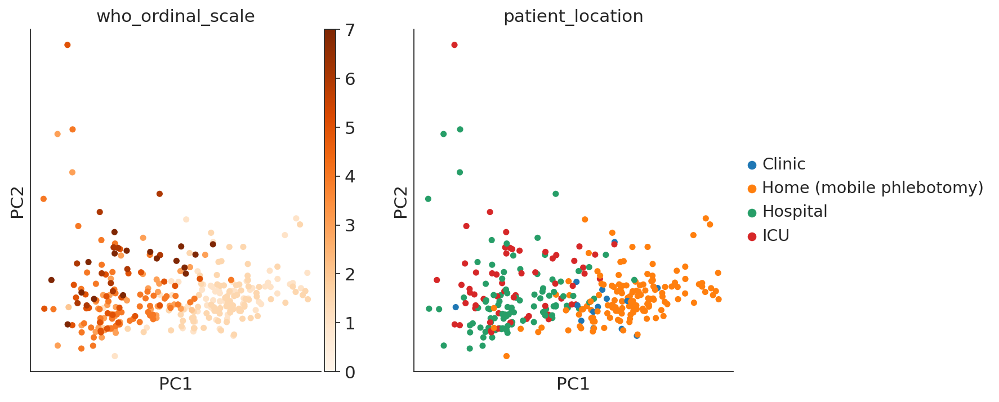

In [16]:
#adata_serum.obs['Age_at_baseline'] = adata_serum.obs['Age_at_baseline'].str.replace('Not Recorded', 
#                                                                                              '0').astype(int)
#adata_serum.obs['Age_at_baseline'] = adata_serum.obs['Age_at_baseline'].astype(int)

sns.set_style('white')
sns.set_style('ticks')
f, axes = plt.subplots(1, 2, figsize=(10, 5), sharex=True, sharey=True)
sns.despine()

fig = sc.pl.pca(adata_serum, color='who_ordinal_scale', size=100, cmap='Oranges', vmin=0, show=False, ax=axes[0])
fig = sc.pl.pca(adata_serum, color='patient_location', size=100, show=False, ax=axes[1])
#fig = sc.pl.pca(adata_serum, color='observation_days_since_enrollment', size=100, cmap='coolwarm', 
#                show=False, ax=axes[2])
#plt.xlim([-0.03, 0.06])
#plt.ylim([-0.035, 0.04])
#plt.tight_layout()

... storing 'kmeans2' as categorical
... storing 'kmeans3' as categorical
... storing 'kmeans4' as categorical


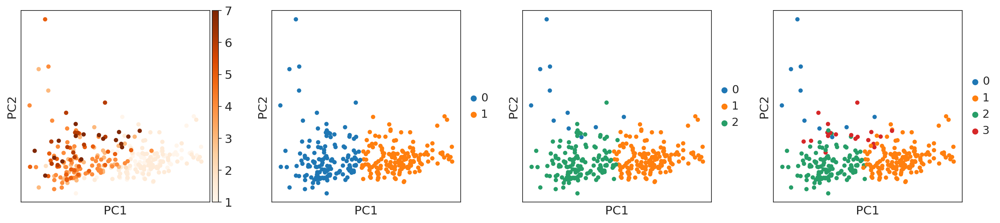

In [17]:
# extract pca coordinates
X_pca = adata_serum.obsm['X_pca'] 

# kmeans with k=2
kmeans = KMeans(n_clusters=2, random_state=0).fit(X_pca) 
adata_serum.obs['kmeans2'] = kmeans.labels_.astype(str)

# kmeans with k=3
kmeans = KMeans(n_clusters=3, random_state=0).fit(X_pca) 
adata_serum.obs['kmeans3'] = kmeans.labels_.astype(str)

# kmeans with k=4
kmeans = KMeans(n_clusters=4, random_state=0).fit(X_pca) 
adata_serum.obs['kmeans4'] = kmeans.labels_.astype(str)

sc.pl.pca(adata_serum, color=['who_ordinal_scale', 'kmeans2', 'kmeans3', 'kmeans4'], title=['', '', '', ''], 
          cmap='Oranges', size=100)

# 2 clusters separates between relatively well and sick patients (e.g. by degree of pulmonary infiltration)
# 3 clusters separates between well, sick, and critically ill patients 
# (e.g. by respiratory support needed/hospitalization status)

In [18]:
adata_serum

AnnData object with n_obs × n_vars = 308 × 1050
    obs: 'source_label', 'observation_id', 'incov_redcap_event_name', 'observation_days_since_enrollment', 'abdominal_pain', 'ambulatory', 'blood_draw_status', 'blood_draw_status_bad', 'blood_draw_type', 'blood_oxygenation', 'blood_oxygenation_max', 'blood_oxygenation_min', 'chest_xray_ct', 'cough', 'diarrhea', 'diastolic_bp', 'dypsnea', 'dysgeusia', 'ecmo', 'fatigue', 'height', 'mechanical_ventilation', 'nausea_vomiting', 'new_dialysis_need', 'new_vaspressor_need', 'patient_location', 'pulse', 'respiratory_rate', 'respiratory_support', 'sputum', 'systolic_bp', 'temperature', 'temperature_max', 'temperature_min', 'weight', 'who_ordinal_scale', 'sample_id', 'kmeans2', 'kmeans3', 'kmeans4'
    uns: 'pca', 'patient_location_colors', 'kmeans2_colors', 'kmeans3_colors', 'kmeans4_colors'
    obsm: 'X_pca'
    varm: 'PCs'

In [19]:
# The most meaningful clustering is 2 K-means clusters
# Distribution of patients per K-means cluster:
# Function for stacked bar plots to compare metabolic and all-gene clusters
def plot_bar(adata, x, y, df, kind, out, ax=None, stacked=True, colors=None, \
    rotation=0, xorder=None, yorder=None, cmap=None, **kwargs):

    if kind=='Frequency':
        props = df.groupby(x)[y].value_counts(normalize=True).unstack()
    elif kind=='Count':
        props = df.groupby(x)[y].value_counts(normalize=False).unstack()

    if xorder is not None:
        props = props.loc[xorder]
    if yorder is not None:
        props = props.loc[:, yorder]
    # stacked barplot
    with sns.axes_style('ticks'):
        if cmap is not None:
            colors = [cmap[col] for col in props.columns]
        elif y+'_colors' in adata.uns:
            palette = adata.uns[y+'_colors']
            categories = adata.obs[y].cat.categories
            cmap = {cat:color for cat, color in zip(categories, palette)}
            colors = [cmap[cat] for cat in props.columns]
        if stacked:
            ax = props.plot(kind='bar', stacked='True', color=colors, ax=ax, **kwargs)
        else:
            ax = props.plot(kind='bar', stacked=None, color=colors, ax=ax, **kwargs)
        ax.legend(bbox_to_anchor=(1.2,0.8))
        sns.despine()
        ax.set_ylabel(kind)
        ax.set_xlabel(x)
        ax.tick_params(axis='x', which='major', labelrotation=rotation)
        fig = ax.get_figure()
        fig.savefig('{}/{}_{}_{}{}.pdf'.format(out, x,y,kind, '_stacked'*stacked), \
            bbox_inches='tight', transparent=True)
        plt.close()
    return 


plot_bar(adata_serum, 'kmeans2', 'patient_location', adata_serum.obs, 'Frequency', master_dir + 'output')

In [20]:
# Most important PCA components
# Get loading scores of the first two PCs and find the most highly scored metabolites per PC
loading_scores = pd.DataFrame(abs(adata_serum.varm['PCs'][:, 0:2]), columns=['PC1', 'PC2'])
loading_scores.index = adata_serum.var_names
#loading_scores.to_csv(master_dir + 'output/metabolite-PCA1_2-absolute_loading_scores-alt_normalization.csv')
loading_scores = loading_scores.sort_values(by='PC1', ascending=False).reset_index()
np.where(loading_scores['index']=='mannose')

(array([87]),)

In [21]:
loading_scores[:50]

,index,PC1,PC2
0,phenylalanylmethionine,0.127489,0.022747
1,1-linoleoyl-2-docosahexaenoyl-GPC (18:2/22:6)*,0.118173,0.018156
2,1-stearoyl-GPC (18:0),0.113705,0.015418
3,1-palmitoyl-GPC (16:0),0.108503,0.000562
4,"1,2-dilinoleoyl-GPC (18:2/18:2)",0.104703,0.006815
5,isoleucylleucine/leucylisoleucine,0.101947,0.024818
6,1-linoleoyl-GPC (18:2),0.099032,0.008286
7,1-(1-enyl-palmitoyl)-GPE (P-16:0)*,0.096901,0.004397
8,1-dihomo-linolenoyl-GPC (20:3n3 or 6)*,0.096285,0.017369
9,1-(1-enyl-stearoyl)-GPE (P-18:0)*,0.096145,0.009365


In [22]:
np.where(loading_scores['index']=='sphingomyelin (d18:2/14:0, d18:1/14:1)*')

(array([18]),)

In [23]:
np.where(loading_scores['index']=='sphingomyelin (d18:1/21:0, d17:1/22:0, d16:1/23:0)*')

(array([19]),)

In [24]:
np.where(loading_scores['index']=='2-linoleoyl-GPE (18:2)*')

(array([20]),)

In [25]:
np.where(loading_scores['index']=='1-linoleoyl-GPE (18:2)*')

(array([38]),)

In [26]:
np.where(loading_scores['index']=='1-(1-enyl-palmitoyl)-2-linoleoyl-GPC (P-16:0/18:2)*')

(array([54]),)

### Correlation of metabolites with WHO scale
Select these and plot just these

In [27]:
adata_serum.obs.index = adata_serum.obs['sample_id']

In [28]:
#pd.DataFrame(adata_serum[patients_WHO].X, columns=adata_serum.var_names, 
#                                  index=adata_serum[patients_WHO].obs.index)

In [29]:
adata_serum.obs.sort_values(by='who_ordinal_scale', axis=0)['sample_id']

sample_id
INCOV066-CV    INCOV066-CV
INCOV078-BL    INCOV078-BL
INCOV108-BL    INCOV108-BL
INCOV024-CV    INCOV024-CV
INCOV051-CV    INCOV051-CV
                  ...     
INCOV035-BL    INCOV035-BL
INCOV020-BL    INCOV020-BL
INCOV106-BL    INCOV106-BL
INCOV008-BL    INCOV008-BL
INCOV061-CV    INCOV061-CV
Name: sample_id, Length: 308, dtype: object

In [1040]:
# For correlation, not using the statistically deleted values (need raw values)
#df_p = pd.DataFrame(p)
#df_p.index = metab_genes.index
#patients = adata.obs['patient'].unique().astype(str)
#patients.sort()
#df_p.columns = patients

# Plot in order of increasing WHO score
patients_WHO = adata_serum.obs.sort_values(by='who_ordinal_scale', axis=0).dropna(subset=[\
                                'who_ordinal_scale'], axis=0)['sample_id'].unique()
adata_serum.X = pre_norm
adata_serum_sorted = pd.DataFrame(adata_serum[patients_WHO].X, columns=adata_serum.var_names, 
                                  index=adata_serum[patients_WHO].obs.index)
df_p = adata_serum_sorted.transpose()

spr_corr = df_p.apply(lambda col: spearmanr(col, adata_serum.obs.loc[patients_WHO, ['who_ordinal_scale']])[0], 
                      axis=1)
spr_pvalues = df_p.apply(lambda col: spearmanr(col, adata_serum.obs.loc[patients_WHO, ['who_ordinal_scale']])[1], 
                         axis=1)

sig_metabolites = pd.DataFrame([spr_corr, spr_pvalues]).transpose()
sig_metabolites = sig_metabolites[sig_metabolites.loc[:, 1]<0.05]
sig_metabolites.columns = ['Spearman', 'p-value']
sig_metabolites['Spearman_abs'] = abs(sig_metabolites['Spearman'])
sig_metabolites['-log10(p)'] = -np.log10(sig_metabolites['p-value'])
sig_metabolites = sig_metabolites.sort_values(by='Spearman_abs', ascending=False)
#pd.DataFrame(sig_metabolites).to_csv(master_dir + 'output/' + 
#                                 celltype + '-metabolites-data_200905.csv')
sig_metabolites

,Spearman,p-value,Spearman_abs,-log10(p)
6-bromotryptophan,-0.721879,1.085837e-50,0.721879,49.964235
phenylalanylmethionine,-0.706817,9.033646e-48,0.706817,47.044137
3-ureidopropionate,0.687421,2.841789e-44,0.687421,43.546408
tryptophylleucine,-0.680741,3.940930e-43,0.680741,42.404401
mannose,0.680641,4.096317e-43,0.680641,42.387606
...,...,...,...,...
N-stearoyl-sphinganine (d18:0/18:0)*,0.113962,4.602767e-02,0.113962,1.336981
ornithine,0.113164,4.758332e-02,0.113164,1.322545
4-chlorobenzoic acid,0.112562,4.878520e-02,0.112562,1.311712
methionylalanine,-0.112343,4.922920e-02,0.112343,1.307777


([], [])

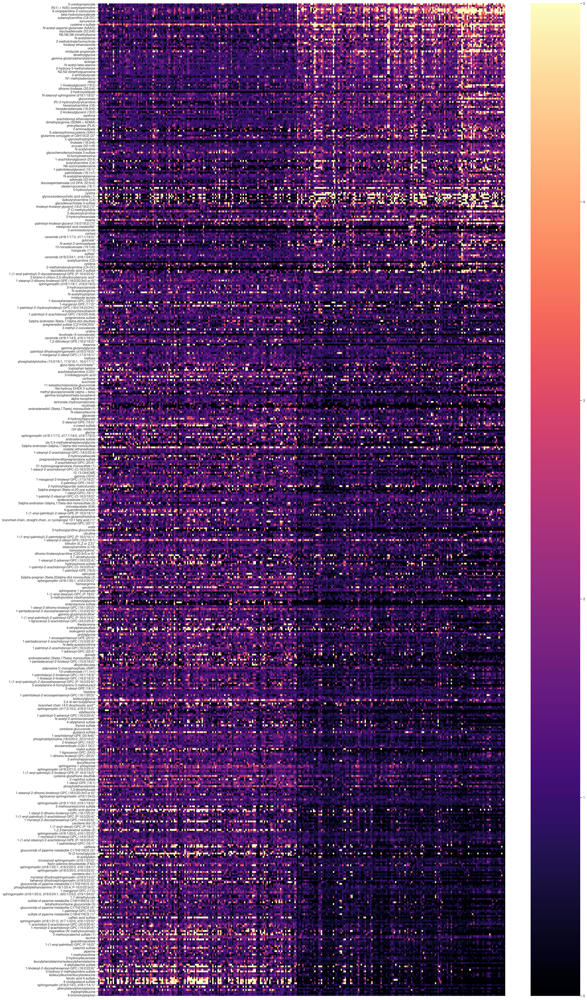

In [1041]:
fig = plt.figure(figsize=(30, 60))
df_sorted = df_p.loc[sig_metabolites[sig_metabolites['p-value']<0.001].sort_values(by='Spearman', 
                                                                                   ascending=False).index]
fig = sns.heatmap(df_sorted, cmap='magma', vmax=5)
plt.xlabel('')
plt.xticks([])

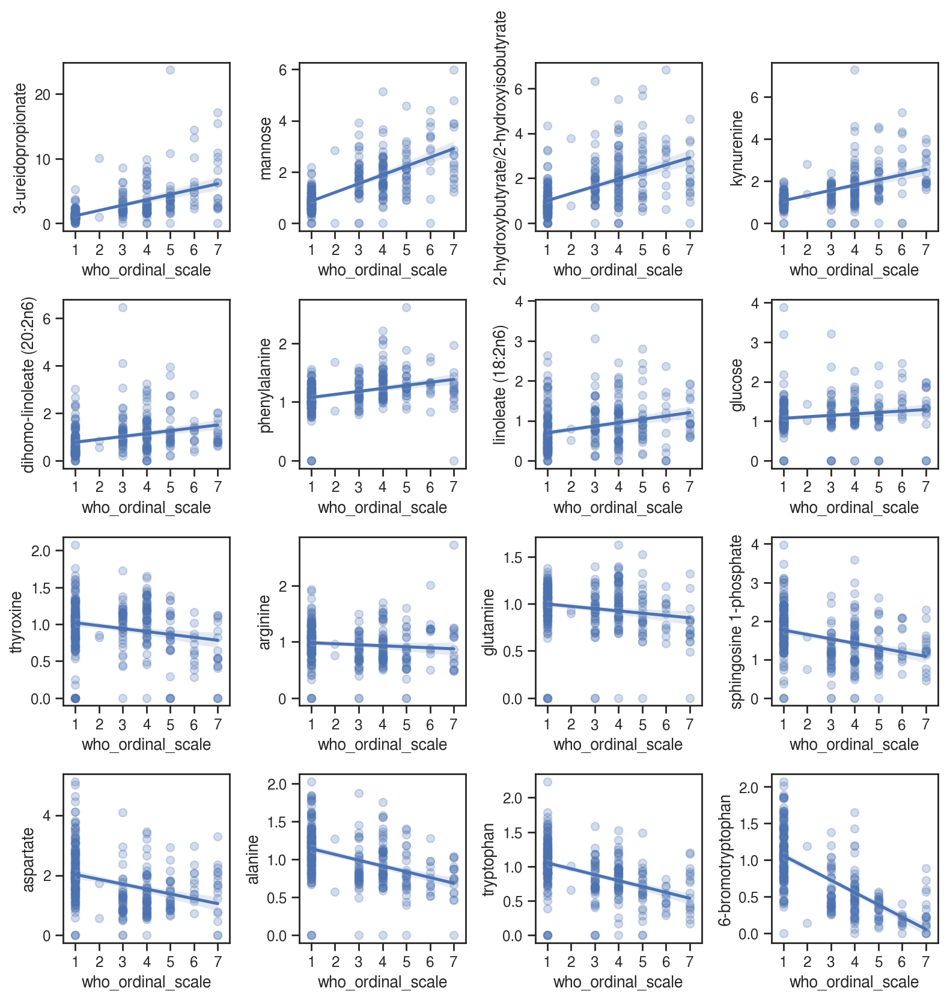

In [1038]:
metabolites = ['3-ureidopropionate', 'mannose', '2-hydroxybutyrate/2-hydroxyisobutyrate', 
               'kynurenine', 'dihomo-linoleate (20:2n6)', 'phenylalanine', 'linoleate (18:2n6)',
              'glucose', 'thyroxine', 'arginine', 'glutamine', 'sphingosine 1-phosphate',
              'aspartate', 'alanine', 'tryptophan', '6-bromotryptophan']
f, axes = plt.subplots(4, 4, figsize=(10, 10), sharex=False, sharey=False)
plt.setp(axes, xlim=[0.5, 7.5], xticks=range(1, 8))

k = 0
for i in range(4):
    for j in range(4):
        sns.regplot(y=adata_serum_sorted[metabolites[k]], 
                    x=adata_obs_by_patient.loc[patients_WHO, 'who_ordinal_scale'], 
                    scatter_kws={'alpha':0.25}, ax=axes[i, j])
        k += 1
plt.tight_layout()
plt.savefig(master_dir + 'output/all-metabolites-data-200905-notable.pdf', rasterize=True)

In [1019]:
adata_obs_by_patient.loc[patients_WHO, ['who_ordinal_scale']]

,who_ordinal_scale
sample_id,
INCOV066-CV,1
INCOV078-BL,1
INCOV108-BL,1
INCOV024-CV,1
INCOV051-CV,1
...,...
INCOV031-PD1,7
INCOV035-BL,7
INCOV020-BL,7


In [32]:
len(sig_metabolites[sig_metabolites['p-value']<0.001][sig_metabolites['Spearman']<0])

<ipython-input-32-6dc81c31e914>:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  len(sig_metabolites[sig_metabolites['p-value']<0.001][sig_metabolites['Spearman']<0])


429

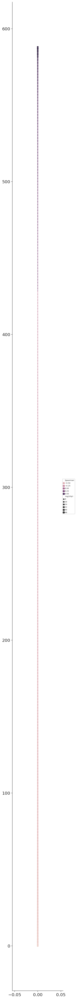

In [33]:
def plot_spearman_dots(sig_pathways, df_corresponding, figsize=(5, 3)):
    # Dot plot for the significant ones
    sns.set_style('white')
    sns.set_style('ticks')
    fig = plt.figure(figsize=figsize)
    fig = sns.scatterplot(x=np.zeros(len(sig_pathways)), y=np.arange(0, len(sig_pathways), 1)[::-1], 
                          hue='Spearman', size='-log10(p)', hue_order=np.arange(0, 0.5, 0.1), 
                          sizes=(10, 40), data=sig_pathways.loc[df_corresponding.index])
    fig.legend(loc='right', bbox_to_anchor=(1.25, 0.5), ncol=1, fontsize=6)
    sns.despine()
    
plot_spearman_dots(sig_metabolites[sig_metabolites['p-value']<0.001], 
                   df_sorted, figsize=(3, 60))

<Figure size 320x320 with 0 Axes>

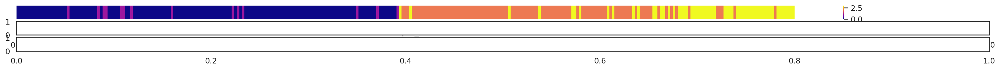

<Figure size 1280x24 with 0 Axes>

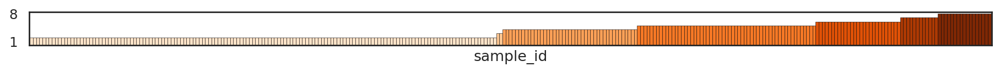

In [34]:
# Other patient attributes
adata_obs_by_patient = adata_serum.obs.copy().dropna(subset=['who_ordinal_scale'])
adata_obs_by_patient.index = adata_obs_by_patient['sample_id']
#adata_obs_by_patient.groupby(by='patient').first()
adata_obs_by_patient = adata_obs_by_patient.reset_index(drop=True)
adata_obs_by_patient = adata_obs_by_patient.groupby(by='sample_id').first() # All characteristics except clustering should be the same
adata_obs_by_patient['who_ordinal_scale'] = adata_obs_by_patient['who_ordinal_scale'].astype(int)
#adata_obs_by_patient['Age_at_baseline'] = adata_obs_by_patient['Age_at_baseline'].str.replace('Not Recorded', 
#                                                                                              '0').astype(int)
#adata_obs_by_patient['Age_at_baseline'] = adata_obs_by_patient['Age_at_baseline'].astype(int)

# Plotting the other patient attributes
sns.set(style='white')
#sns.set(style='ticks')
sns.despine()

f, axes = plt.subplots(3, 1, figsize=(25, 1.2), sharex=False, sharey=False)

#df = adata_obs_by_patient.loc[patients_WHO, ['WHO_scale']]
#fig = plt.figure(figsize=(16, 0.3))
#fig = sns.heatmap(df.transpose(), xticklabels=[''], yticklabels=[''],
#                 cmap='Oranges', ax=axes[0])

df = adata_obs_by_patient.loc[patients_WHO, ['patient_location']]
df['patient_location'] = df['patient_location'].map({'Home (mobile phlebotomy)': 0, 'Clinic': 1, 
                                                     'Hospital': 2, 'ICU': 3}).astype(int)
fig = plt.figure(figsize=(16, 0.3))
fig = sns.heatmap(df.transpose(), xticklabels=[''], yticklabels=[''],
                 cmap='plasma', ax=axes[0])

#df = adata_obs_by_patient.loc[patients_WHO, ['Age_at_baseline']]
#fig = plt.figure(figsize=(16, 0.3))
#fig = sns.heatmap(df.transpose(), xticklabels=[''], yticklabels=[''], vmin=0,
#                 cmap='coolwarm', ax=axes[1])

#df = adata_obs_by_patient.loc[patients_WHO, ['Sex']]
#df['Sex'] = df['Sex'].map({'Female': 1, 'Male': 0}).astype(int)
#fig = plt.figure(figsize=(16, 0.3))
#fig = sns.heatmap(df.transpose(), xticklabels=patients_WHO, yticklabels=[''],
#                 cmap='cool', ax=axes[2])

df = adata_obs_by_patient.loc[patients_WHO, ['who_ordinal_scale']]
df['who_ordinal_scale'] += 1 # Add 1 to all values in order to make all bars visible
fig = plt.figure(figsize=(14, 0.5))
oranges = cm.get_cmap('Oranges', 8)
df['c'] = [oranges(s - 1) for s in df['who_ordinal_scale']]
fig = df['who_ordinal_scale'].plot(kind='bar', color=df['c'], edgecolor='black', linewidth=0.25, width=1)
fig = plt.yticks([1, 8])
fig = plt.xticks([])

In [35]:
# Save metabolites adata for convenient use later
#adata_serum_sorted.to_csv(master_dir + 'output/all-metabolites-concentrations-data_200905.csv')

## Patient pseudobulk gene expression

In [36]:
df_pseudobulk = pd.read_csv(master_dir + 
            'data/PBMC/upto_tenth8_t1t2h_rev_bulk_gex_per_patient_suprisal_format_wo_86_2_145_2.csv', header=0)
df_pseudobulk.head()

,celltype,gene,P_1-1,P_1-2,P_2-1,P_2-2,P_3-1,P_3-2,P_4-1,P_4-2,...,3577BW,5046BW,6130BW,7541BW,BP0219101,BP0319250,BP05191345,BP08191115,CL2,Mix_donor1
0,Monocytes,A1BG,1.074493,1.267069,0.422910,0.925235,1.342639,1.426002,0.369201,0.290283,...,0.748158,1.081492,0.938759,1.158623,1.026053,1.453970,1.262222,1.148289,1.025626,1.161736
1,Monocytes,A1BG-AS1,0.072859,0.067354,0.065851,0.078755,0.115363,0.092565,0.036213,0.010142,...,0.000000,0.033366,0.013343,0.067788,0.090404,0.062069,0.067130,0.066888,0.058774,0.118689
2,Monocytes,A2M,0.000000,0.000000,0.000000,0.004562,0.000000,0.007171,0.000000,0.000000,...,0.000000,0.000000,0.006715,0.012825,0.000000,0.000000,0.000000,0.000000,0.001765,0.000000
3,Monocytes,A2M-AS1,0.003439,0.000000,0.014757,0.024716,0.014558,0.025297,0.018754,0.011379,...,0.000000,0.000000,0.000000,0.006606,0.043718,0.000000,0.000000,0.000000,0.007275,0.029735
4,Monocytes,A2ML1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.001251,0.000000


In [37]:
df_pseudobulk['celltype'].unique()

array(['Monocytes', 'CD8+ T-cells', 'CD4 T-cells', 'B-cells', 'NK-cells'],
      dtype=object)

## Assocation of serum metabolites with metabolic pathways

In [38]:
del adata
del adata_metab

In [36]:
def metabolite_vs_pathway():
    # Map the metabolite sample_ids with the anndata
    sample_map_old = pd.read_csv(master_dir + 'data/sample_association-200705_cleaned.csv')
    
    celltypes = ['all', 'cd8', 'cd4', 'B_wo_patient4', 'NK', 'Monocyte']
    corr_r_sigs = []
    corr_p_sigs = []

    for c in celltypes:
        adata = sc.read_h5ad(master_dir + 'output/' + c + '-processed-analyzed.h5ad')
        patients = adata.obs.sort_values(by='WHO_scale', axis=0)['patient'].unique()
        
        # Load the pathway activities for all cells per patient
        pathway_activities_all = pd.read_csv(master_dir + 'output/pathway_activity/' + c + 
                                             '-metab-patient-pathway_activity.tabular', 
                                             sep='\t', header=None)
        pathway_activities_all.index = metab_pathway_list
        pathway_activities_all.columns = patients

        # Merge the pathway activities and serum metabolites per patient
        df_serum_and_pathways = pd.merge(sample_map_old.loc[:, ['sample_name', 'sample_id']], df_serum, 
                                         left_on='sample_id', right_index=True, how='inner')
        df_serum_and_pathways = pd.merge(df_serum_and_pathways, pathway_activities_all.transpose(), left_on='sample_name', 
                                         right_index=True, how='inner')
        df_serum_and_pathways = df_serum_and_pathways.drop(columns=['sample_id', 'sample_name'])

        # Pick pathways that are already significantly correlated with WHO scale
        sig_pathways = pd.read_csv(master_dir + 'output/pathway_activity/pathway_activity_trends/' + 
                                   c + '-all_cells.csv', 
                                   sep=',', header=0)
        sig_pathways.index = sig_pathways['0']
        sig_pathways = sig_pathways.drop(columns='0')
    
        # [-90:] is the pathway activities, # [:-90] is the serum metabolites per patient
        df_serum_merged = df_serum_and_pathways.iloc[:, :-90]
        df_pathways_merged = df_serum_and_pathways.iloc[:, -90:]

        df_serum_merged = df_serum_merged.dropna(axis=1)
        #df_pathways_merged = df_pathways_merged.dropna(axis=1)

        # Resulting correlation dataframe has an array of Spearman r values and p values for each metabolite for each pathway
        corr_r = pd.DataFrame(np.zeros([len(df_serum_merged.columns), 
                                        len(df_pathways_merged.columns)])) # R values
        corr_p = pd.DataFrame(np.ones([len(df_serum_merged.columns), 
                                       len(df_pathways_merged.columns)])) # p values

        corr_r.columns = df_pathways_merged.columns
        corr_p.columns = df_pathways_merged.columns

        corr_r.index = df_serum_merged.columns
        corr_p.index = df_serum_merged.columns

        for metabolite in df_serum_merged.columns:
            temp = df_pathways_merged.apply(lambda col: spearmanr(col, df_serum_merged.loc[:, metabolite]))
            corr_r.loc[metabolite] = temp.iloc[0]
            corr_p.loc[metabolite] = temp.iloc[1]

        # Filter in just the correlations that have significant p values
        corr_r_sig = corr_r * (corr_p < 0.05)
        corr_p_sig = corr_p #corr_p_sig = corr_p * (corr_p < 0.05)
        
        # Just the metabolites and pathways that are also correlated with WHO
        corr_r_sig_WHO = corr_r_sig.loc[set(set(sig_metabolites.index)).intersection(set(corr_r_sig.index)), 
                                        sig_pathways.index]
        corr_r_sig_WHO.columns = c + '_' + corr_r_sig_WHO.columns
        
        corr_p_sig_WHO = corr_p_sig.loc[set(set(sig_metabolites.index)).intersection(set(corr_p_sig.index)), 
                                        sig_pathways.index]
        corr_p_sig_WHO.columns = c + '_' + corr_p_sig_WHO.columns

        corr_r_sigs.append(corr_r_sig_WHO)
        corr_p_sigs.append(corr_p_sig_WHO)
        
        print(c + ' done')
        del adata # Mitigate memory leak?
        del patients
    
    corr_r_sigs = pd.concat(corr_r_sigs, axis=1)
    corr_p_sigs = pd.concat(corr_p_sigs, axis=1)
    
    # Drop any serum metabolites or pathway activiites that have no correlation with anything of the other type
    corr_p_sigs = corr_p_sigs.loc[(corr_r_sigs != 0).any(axis=1), (corr_r_sigs != 0).any(axis=0)]
    corr_r_sigs = corr_r_sigs.loc[(corr_r_sigs != 0).any(axis=1), (corr_r_sigs != 0).any(axis=0)]

    #fig = plt.figure(figsize=(15, 15))
    #fig = sns.heatmap(corr_r_sig_WHO, cmap='coolwarm', norm=DivergingNorm(0.0))
    #corr_r_sigs.to_csv(master_dir + 'output/pathway_activity/correlation_w_metabolites.csv') # For p < 0.05
    #corr_r_sigs.to_csv(master_dir + 'output/pathway_activity/correlation_w_metabolites-strict.csv') # For p < 0.01
    #corr_p_sigs.to_csv(master_dir + 'output/pathway_activity/correlation_w_metabolites-strict-pvals.csv')
    
    return corr_r_sigs, corr_p_sigs

In [ ]:
corrs, pvals = metabolite_vs_pathway()

In [ ]:
corrs

In [ ]:
links = corrs.stack().reset_index()
plinks = pvals.stack().reset_index()
links.columns = ['var1', 'var2', 'Spearman_r']
links['p'] = plinks.iloc[:, -1] # p values column
links_filtered = links.loc[(links['var1'] != links['var2']) & (links['p'] < 0.01)]
#links_filtered.to_csv(master_dir + 'output/pathway_activity/correlation_w_metabolites-strict-converted_nodes.csv')

<ipython-input-44-7d0c97cfeafa>:4: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
  fig = sns.clustermap(corrs, figsize=(10, 10), cmap='coolwarm', norm=DivergingNorm(0.0),
/usr/lusers/jlee712/anaconda3/lib/python3.8/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


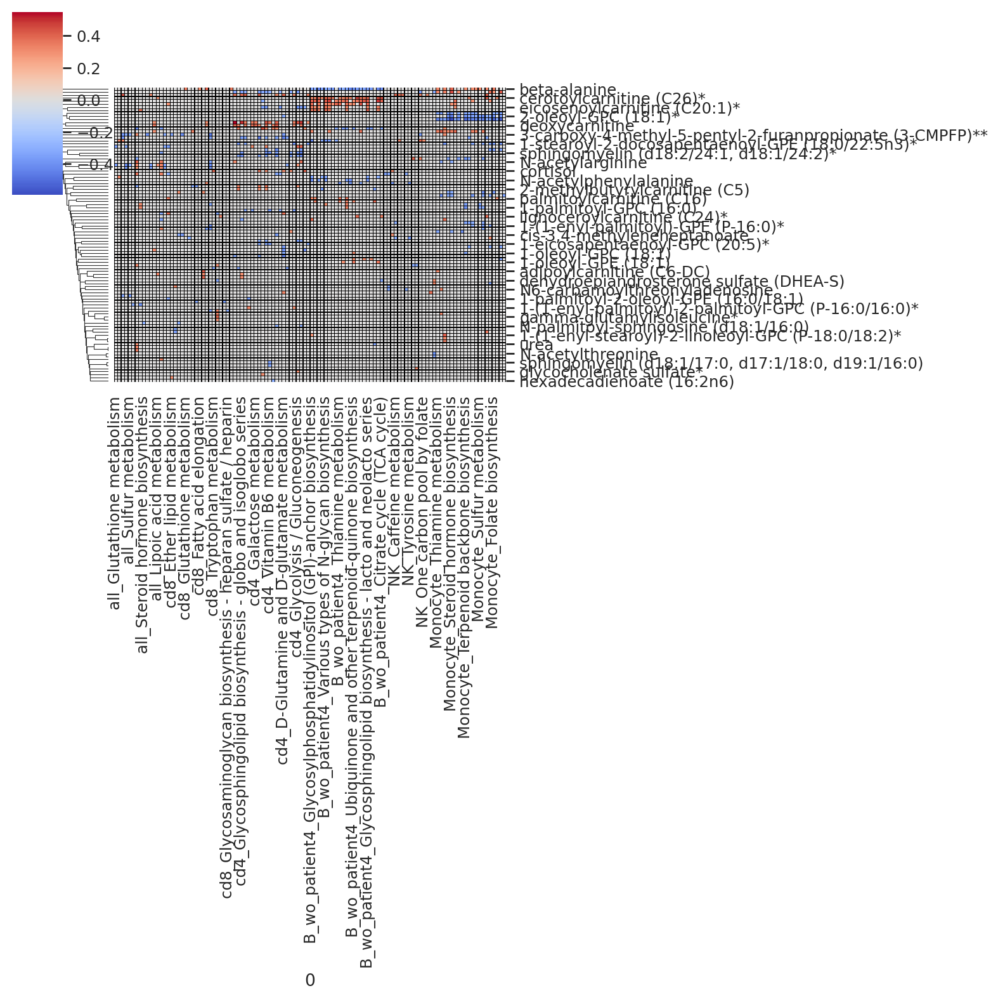

In [44]:
# All
corrs = corrs.fillna(value=0)
corrs = corrs.loc[(corrs != 0).any(axis=1), (corrs != 0).any(axis=0)]
fig = sns.clustermap(corrs, figsize=(10, 10), cmap='coolwarm', norm=DivergingNorm(0.0),
                        linewidths=0.1, col_cluster=False, linecolor='black')
#plt.savefig(master_dir +'output/pathway_activity/correlation_w_metabolites.pdf' )

<ipython-input-45-8f54e80d655d>:4: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
  fig = sns.clustermap(corrs, figsize=(10, 12), cmap='coolwarm', norm=DivergingNorm(0.0),
/usr/lusers/jlee712/anaconda3/lib/python3.8/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


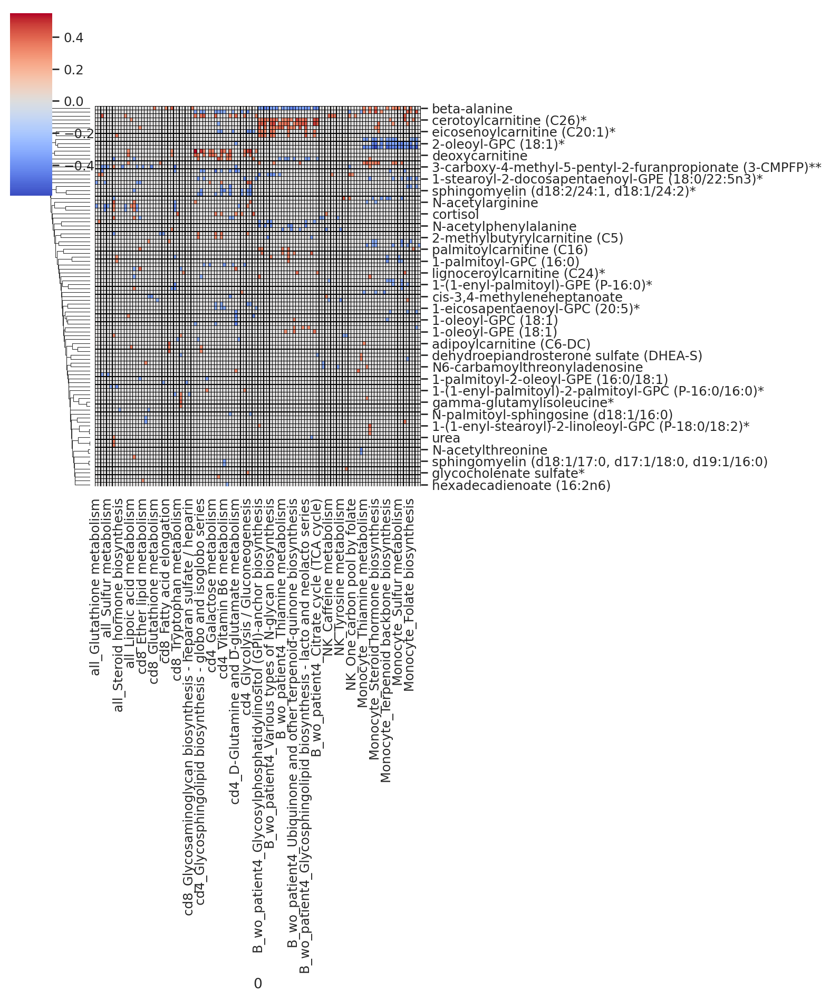

In [45]:
# cd8
corrs = corrs.fillna(value=0)
corrs = corrs.loc[(corrs != 0).any(axis=1), (corrs != 0).any(axis=0)]
fig = sns.clustermap(corrs, figsize=(10, 12), cmap='coolwarm', norm=DivergingNorm(0.0),
                        linewidths=0.1, col_cluster=False, linecolor='black')
#plt.savefig(master_dir +'output/pathway_activity/correlation_w_metabolites.pdf' )

<ipython-input-46-447dfb4f4bc7>:4: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
  fig = sns.clustermap(corrs, figsize=(10, 12), cmap='coolwarm', norm=DivergingNorm(0.0),
/usr/lusers/jlee712/anaconda3/lib/python3.8/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


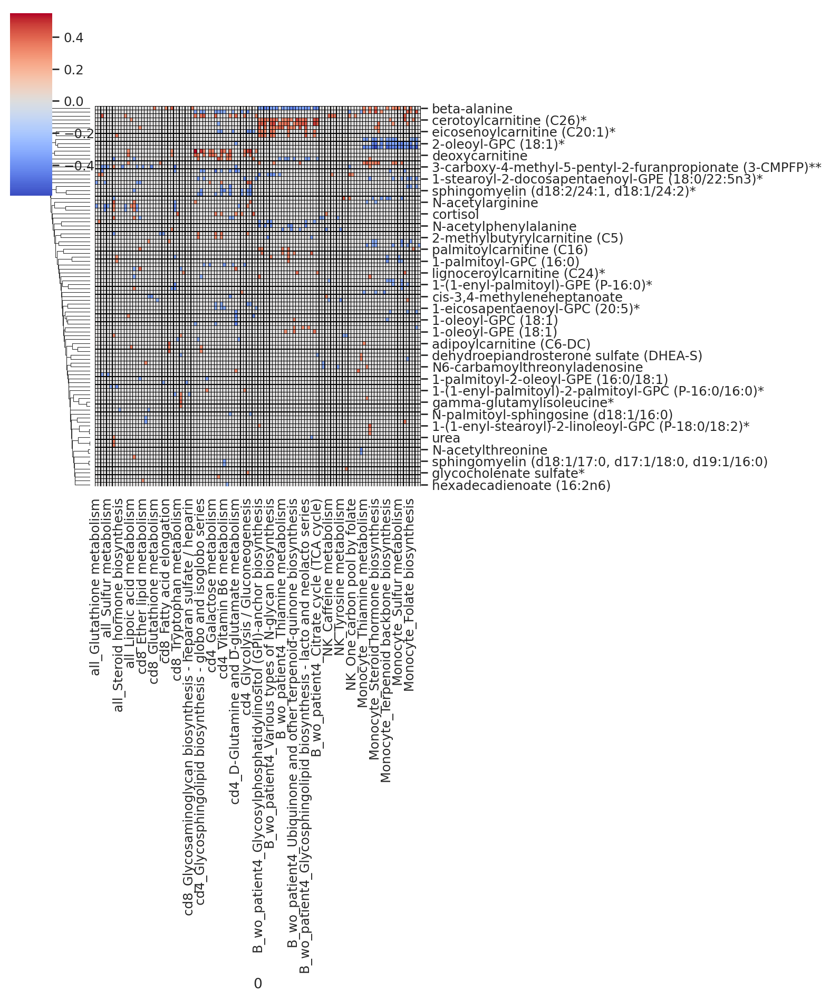

In [46]:
# cd4
corrs = corrs.fillna(value=0)
corrs = corrs.loc[(corrs != 0).any(axis=1), (corrs != 0).any(axis=0)]
fig = sns.clustermap(corrs, figsize=(10, 12), cmap='coolwarm', norm=DivergingNorm(0.0),
                        linewidths=0.1, col_cluster=False, linecolor='black')
#plt.savefig(master_dir +'output/pathway_activity/correlation_w_metabolites.pdf' )

<ipython-input-47-a7bb4c139dbc>:4: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
  fig = sns.clustermap(corrs, figsize=(9, 11), cmap='coolwarm', norm=DivergingNorm(0.0),
/usr/lusers/jlee712/anaconda3/lib/python3.8/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


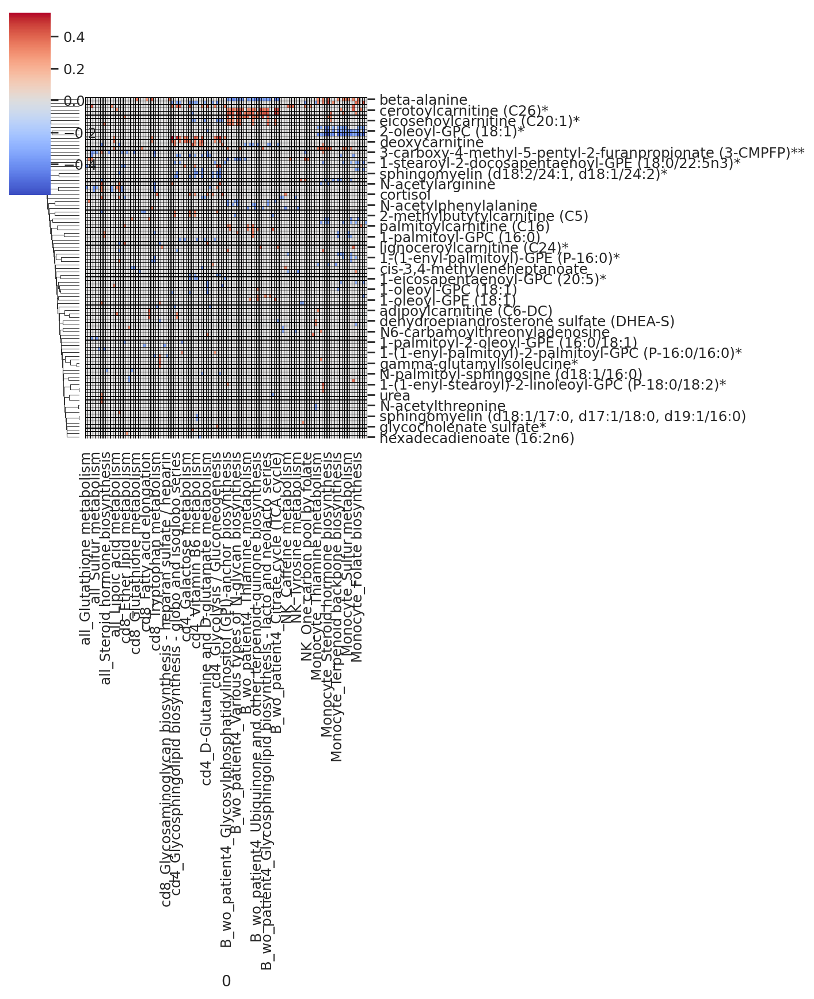

In [47]:
# b_wo_patient4
corrs = corrs.fillna(value=0)
corrs = corrs.loc[(corrs != 0).any(axis=1), (corrs != 0).any(axis=0)]
fig = sns.clustermap(corrs, figsize=(9, 11), cmap='coolwarm', norm=DivergingNorm(0.0),
                        linewidths=0.1, col_cluster=False, linecolor='black')
#plt.savefig(master_dir +'output/pathway_activity/correlation_w_metabolites.pdf' )

<ipython-input-48-579ab3ec22f8>:4: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
  fig = sns.clustermap(corrs, figsize=(11, 8), cmap='coolwarm', norm=DivergingNorm(0.0),
/usr/lusers/jlee712/anaconda3/lib/python3.8/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


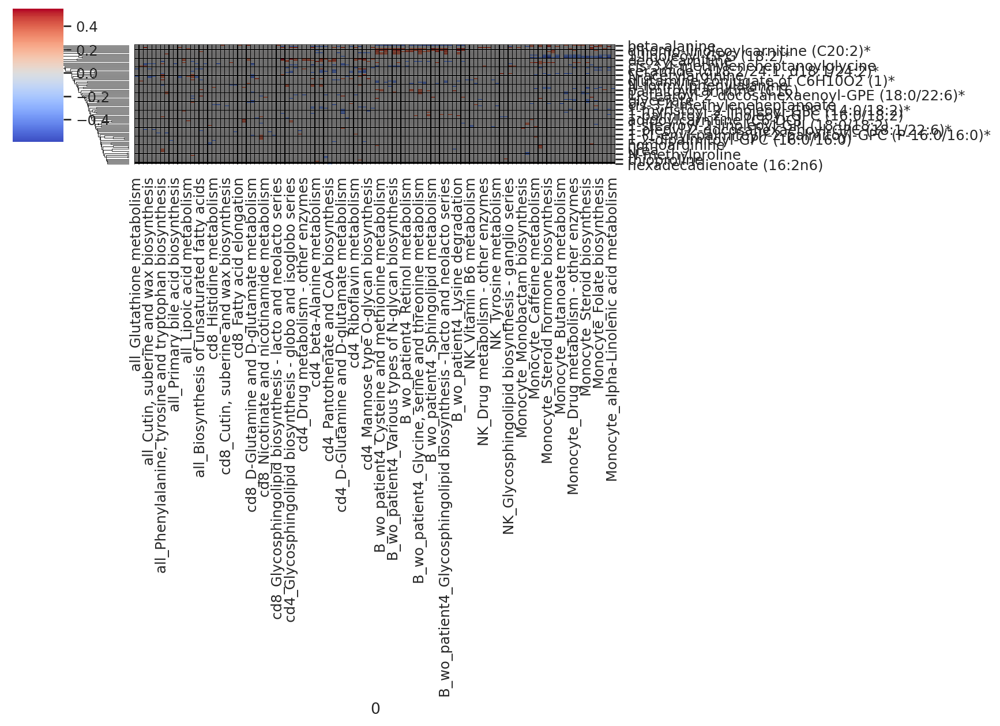

In [48]:
# NK
corrs = corrs.fillna(value=0)
corrs = corrs.loc[(corrs != 0).any(axis=1), (corrs != 0).any(axis=0)]
fig = sns.clustermap(corrs, figsize=(11, 8), cmap='coolwarm', norm=DivergingNorm(0.0),
                        linewidths=0.1, col_cluster=False, linecolor='black')
#plt.savefig(master_dir +'output/pathway_activity/correlation_w_metabolites.pdf' )

<ipython-input-49-5785e891d6da>:4: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
  fig = sns.clustermap(corrs, figsize=(11, 14), cmap='coolwarm', norm=DivergingNorm(0.0),
/usr/lusers/jlee712/anaconda3/lib/python3.8/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


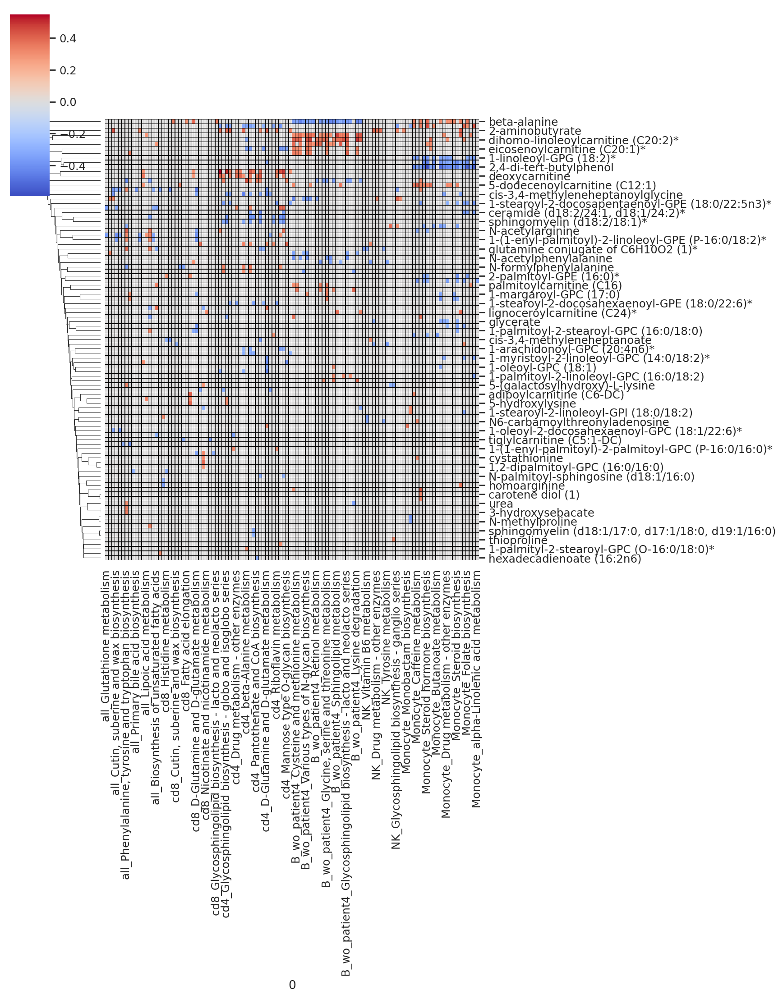

In [49]:
# Monocyte
corrs = corrs.fillna(value=0)
corrs = corrs.loc[(corrs != 0).any(axis=1), (corrs != 0).any(axis=0)]
fig = sns.clustermap(corrs, figsize=(11, 14), cmap='coolwarm', norm=DivergingNorm(0.0),
                        linewidths=0.1, col_cluster=False, linecolor='black')
#plt.savefig(master_dir +'output/pathway_activity/correlation_w_metabolites.pdf' )

### Addendum done at home only

In [50]:
master_corrs = pd.read_csv(master_dir + 'output/pathway_activity/correlation_w_metabolites.csv')
master_corrs.index = master_corrs['Unnamed: 0']
master_corrs = master_corrs.drop(columns=['Unnamed: 0'])
master_corrs.head()

,all_Drug metabolism - other enzymes,all_Glutathione metabolism,all_Arachidonic acid metabolism,all_alpha-Linolenic acid metabolism,"all_Cutin, suberine and wax biosynthesis",all_Sulfur metabolism,all_Ubiquinone and other terpenoid-quinone biosynthesis,"all_Phenylalanine, tyrosine and tryptophan biosynthesis",all_One carbon pool by folate,all_Pantothenate and CoA biosynthesis,...,Monocyte_Drug metabolism - other enzymes,Monocyte_N-Glycan biosynthesis,Monocyte_Sulfur metabolism,Monocyte_Steroid biosynthesis,Monocyte_Primary bile acid biosynthesis,Monocyte_Synthesis and degradation of ketone bodies,Monocyte_Folate biosynthesis,Monocyte_One carbon pool by folate,Monocyte_Biosynthesis of unsaturated fatty acids,Monocyte_alpha-Linolenic acid metabolism
Unnamed: 0,,,,,,,,,,,,,,,,,,,,,
N-acetylphenylalanine,-0.0,-0.0,0.0,-0.0,-0.0,-0.0,-0.0,0.000000,-0.0,0.0,...,-0.0,-0.0,-0.0,-0.0,-0.0,0.0,-0.0,-0.0,0.0,0.0
1-stearoyl-2-dihomo-linolenoyl-GPI (18:0/20:3n3 or 6)*,-0.0,-0.0,0.0,-0.0,-0.0,-0.0,-0.0,0.000000,-0.0,-0.0,...,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,0.0
1-(1-enyl-palmitoyl)-2-palmitoyl-GPC (P-16:0/16:0)*,0.0,0.0,-0.0,0.0,0.0,0.0,0.0,0.000000,-0.0,0.0,...,-0.0,-0.0,-0.0,0.0,-0.0,0.0,0.0,0.0,0.0,-0.0
N-formylphenylalanine,-0.0,-0.0,0.0,0.0,0.0,0.0,-0.0,-0.347697,-0.0,-0.0,...,-0.0,-0.0,-0.0,-0.0,-0.0,0.0,-0.0,-0.0,-0.0,-0.0
ribitol,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.000000,-0.0,-0.0,...,0.0,0.0,0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,0.0


In [51]:
corrs = master_corrs.iloc[:, 88:101] #NK
#corrs = master_corrs.iloc[:, 67:88] #B
#corrs = master_corrs.iloc[:, 45:67] #cd4
#corrs = master_corrs.iloc[:, 22:45] #cd8
#corrs = master_corrs.iloc[:, :22] #all
#corrs = master_corrs.iloc[:, -22:] # Monocyte
corrs.columns = pd.Series(corrs.columns).apply(lambda x: x.split('_')[1])
corrs.head()

,Aflatoxin biosynthesis,Vitamin B6 metabolism,D-Glutamine and D-glutamate metabolism,Caffeine metabolism,Drug metabolism - other enzymes,Glutathione metabolism,Fructose and mannose metabolism,Tyrosine metabolism,Histidine metabolism,Primary bile acid biosynthesis,Glycosphingolipid biosynthesis - ganglio series,One carbon pool by folate,Pyrimidine metabolism
Unnamed: 0,,,,,,,,,,,,,
N-acetylphenylalanine,-0.0,-0.000000,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,0.0,-0.0,0.0,0.0
1-stearoyl-2-dihomo-linolenoyl-GPI (18:0/20:3n3 or 6)*,0.0,0.000000,-0.0,0.0,0.0,0.0,-0.0,0.0,0.0,0.0,0.0,0.0,0.0
1-(1-enyl-palmitoyl)-2-palmitoyl-GPC (P-16:0/16:0)*,-0.0,0.000000,-0.0,0.0,-0.0,-0.0,-0.0,-0.0,0.0,-0.0,-0.0,-0.0,-0.0
N-formylphenylalanine,0.0,-0.000000,-0.0,-0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ribitol,-0.0,-0.336256,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0


<ipython-input-52-5d30d4820128>:4: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
  norm=DivergingNorm(0.0), vmin=-0.5, vmax=0.5,


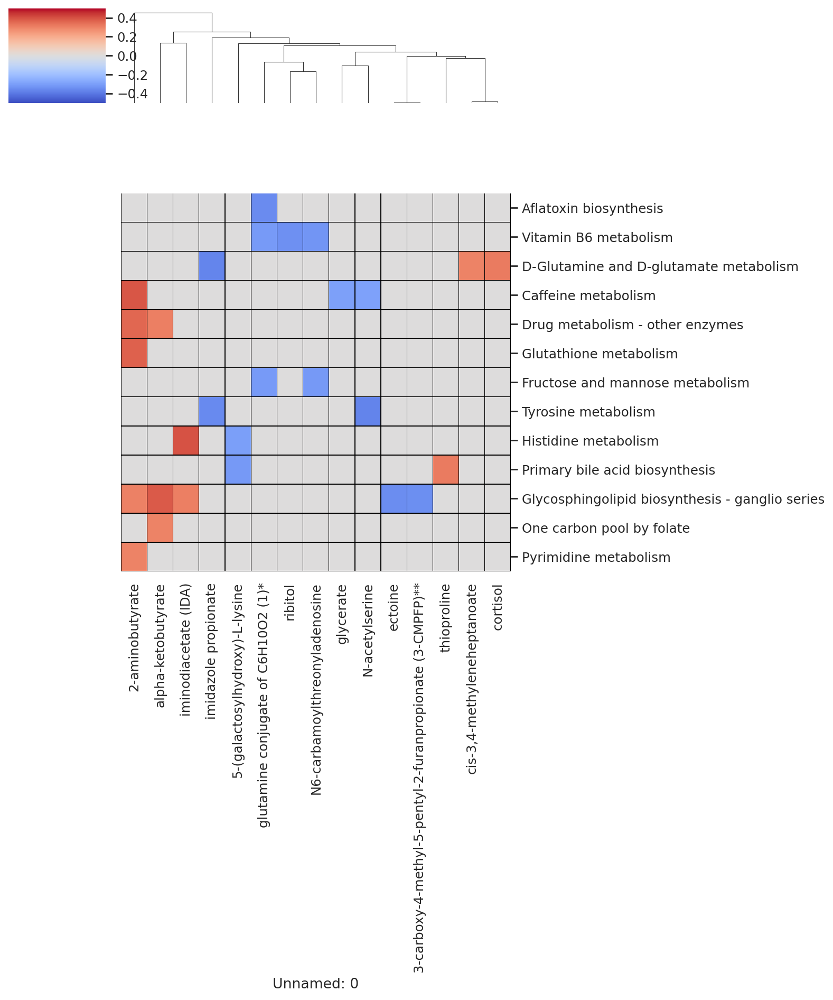

In [52]:
corrs = corrs.fillna(value=0)
corrs = corrs.loc[(corrs != 0).any(axis=1), (corrs != 0).any(axis=0)]
fig = sns.clustermap(corrs.transpose(), figsize=(10, 12), cmap='coolwarm', 
                     norm=DivergingNorm(0.0), vmin=-0.5, vmax=0.5,
                        linewidths=0.1, row_cluster=False, linecolor='black')
plt.tight_layout()
#plt.savefig('../output/pathway_activity/NK-correlation_w_metabolites.pdf' )

### Addendum part 2

In [39]:
master_corrs = pd.read_csv(master_dir + 'output/pathway_activity/correlation_w_metabolites.csv')
master_corrs.index = master_corrs['Unnamed: 0']
master_corrs = master_corrs.drop(columns=['Unnamed: 0'])
master_corrs.head()

,all_Drug metabolism - other enzymes,all_Glutathione metabolism,all_Arachidonic acid metabolism,all_alpha-Linolenic acid metabolism,"all_Cutin, suberine and wax biosynthesis",all_Sulfur metabolism,all_Ubiquinone and other terpenoid-quinone biosynthesis,"all_Phenylalanine, tyrosine and tryptophan biosynthesis",all_One carbon pool by folate,all_Pantothenate and CoA biosynthesis,...,Monocyte_Drug metabolism - other enzymes,Monocyte_N-Glycan biosynthesis,Monocyte_Sulfur metabolism,Monocyte_Steroid biosynthesis,Monocyte_Primary bile acid biosynthesis,Monocyte_Synthesis and degradation of ketone bodies,Monocyte_Folate biosynthesis,Monocyte_One carbon pool by folate,Monocyte_Biosynthesis of unsaturated fatty acids,Monocyte_alpha-Linolenic acid metabolism
Unnamed: 0,,,,,,,,,,,,,,,,,,,,,
N-acetylphenylalanine,-0.0,-0.0,0.0,-0.0,-0.0,-0.0,-0.0,0.000000,-0.0,0.0,...,-0.0,-0.0,-0.0,-0.0,-0.0,0.0,-0.0,-0.0,0.0,0.0
1-stearoyl-2-dihomo-linolenoyl-GPI (18:0/20:3n3 or 6)*,-0.0,-0.0,0.0,-0.0,-0.0,-0.0,-0.0,0.000000,-0.0,-0.0,...,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,0.0
1-(1-enyl-palmitoyl)-2-palmitoyl-GPC (P-16:0/16:0)*,0.0,0.0,-0.0,0.0,0.0,0.0,0.0,0.000000,-0.0,0.0,...,-0.0,-0.0,-0.0,0.0,-0.0,0.0,0.0,0.0,0.0,-0.0
N-formylphenylalanine,-0.0,-0.0,0.0,0.0,0.0,0.0,-0.0,-0.347697,-0.0,-0.0,...,-0.0,-0.0,-0.0,-0.0,-0.0,0.0,-0.0,-0.0,-0.0,-0.0
ribitol,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.000000,-0.0,-0.0,...,0.0,0.0,0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,0.0


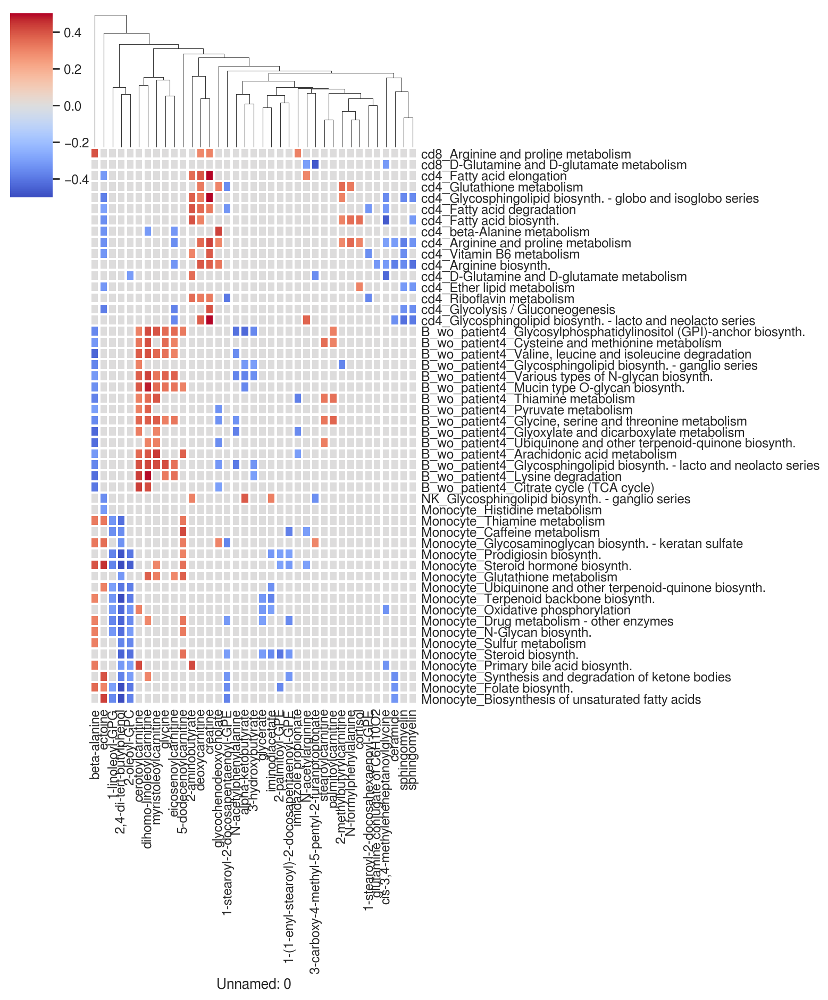

In [66]:
sns.set_style('white', rc={'font':'FreeSans', 'font.family':'sans-serif', 'font.sans-serif':'FreeSans'})
corrs = master_corrs.iloc[:, 22:] # Remove all_ columns
corrs = corrs.fillna(value=0)
# To make patterns more clear, restrict metabolites to only the ones that correlate with at least 5 pathways
#corrs = corrs.loc[(corrs != 0).sum(axis=1) > 4, :]
corrs = corrs.loc[(corrs != 0).sum(axis=1) > 4, (corrs != 0).sum(axis=0) > 4]
# Filter out metabolic pathways that do not have any metabolites linked to it after the above filtering
corrs = corrs.loc[:, (corrs != 0).any(axis=0)]
fig = sns.clustermap(corrs.transpose(), figsize=(10, 12), cmap='coolwarm', center=0, vmin=-0.5, vmax=0.5,
                     linewidths=1.5, row_cluster=False, linecolor='white',
                     #yticklabels=pd.Series(corrs.columns).apply(lambda x: x.split('_')[-1].split(' - ')[0].replace('biosynthesis', 'biosynth.')),
                     yticklabels=pd.Series(corrs.columns).apply(lambda x: x.replace('biosynthesis', 'biosynth.')),
                     xticklabels=pd.Series(corrs.index).apply(lambda x: x.split(' (')[0]))
fig.ax_heatmap.tick_params(axis='both', length=0)
#fig.set(xticks=pd.Series(corrs.columns).apply(lambda x: x.split('_')[-1]))
#plt.savefig(master_dir + 'output/pathway_activity/everything-correlation_w_metabolites-best_metabolites-201204.pdf' )

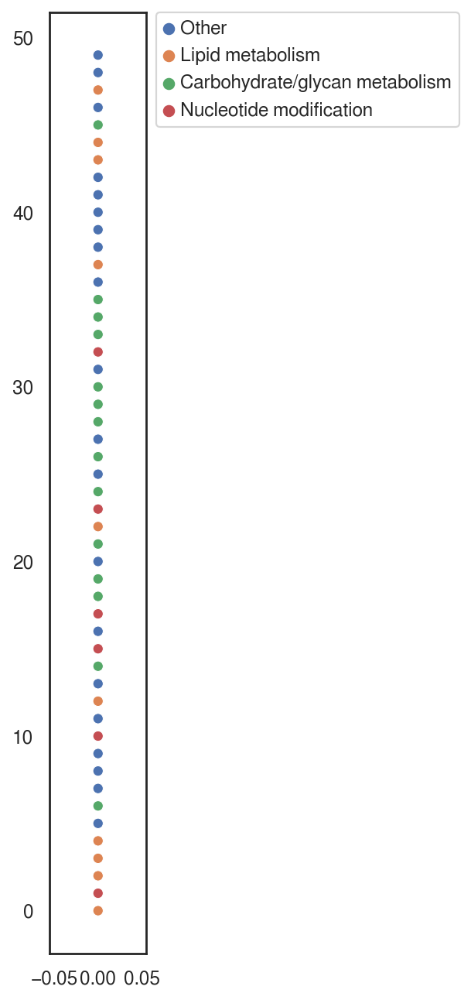

In [65]:
pathways = pd.Series(corrs.columns).apply(lambda x: x.split('_')[-1])
pathway_classifications = pd.read_csv(master_dir + 'data/KEGG_genesets/hsa00001.metab.keg-KEGGclassified.gmt', 
                                      sep='\t', header=None)
pathway_classifications.columns = ['pathway', 'classification']
pathway_classifications.index = pathway_classifications['pathway']
pathway_classifications['superpathway'] = pathway_classifications['classification'].apply(\
    lambda x: x if x in ['Lipid metabolism'] \
              else 'Carbohydrate/glycan metabolism' if x in ['Carbohydrate metabolism', 'Glycan biosynthesis and metabolism']
#              else 'Nucleotide modification' if x in ['Nucleotide metabolism', 'Cysteine and methionine metabolism',
#                    'Histidine metabolism',
#                    'Ubiquinone and other terpenoid-quinone biosynthesis',
#                    'Taurine and hypotaurine metabolism',
#                    'Nicotinate and nicotinamide metabolism'] \
              else 'Other')

for i in pathway_classifications.index:
    if pathway_classifications.loc[i, 'pathway'] in \
                        ['Nicotinate and nicotinamide metabolism', 'Folate biosynthesis',
                        'Caffeine metabolism', 'Cysteine and methionine metabolism',
                        'Histidine metabolism', 'Ubiquinone and other terpenoid-quinone biosynthesis',
                        'Taurine and hypotaurine metabolism']:
        pathway_classifications.loc[i, 'superpathway'] = 'Nucleotide modification'

#pathway_classifications['color'] = pathway_classifications['superpathway'].map{''}

plt.figure(figsize=(1, 10))
sns.scatterplot(x=np.zeros(len(pathways)), y=range(len(pathways))[::-1], 
    hue=pathway_classifications.loc[pathways, 'superpathway'])
plt.legend(bbox_to_anchor=(1.1, 1), borderaxespad=0)
plt.savefig(master_dir + 'output/pathway_activity/everything-correlation_w_metabolites-best_metabolites-classifications-201204.pdf' )

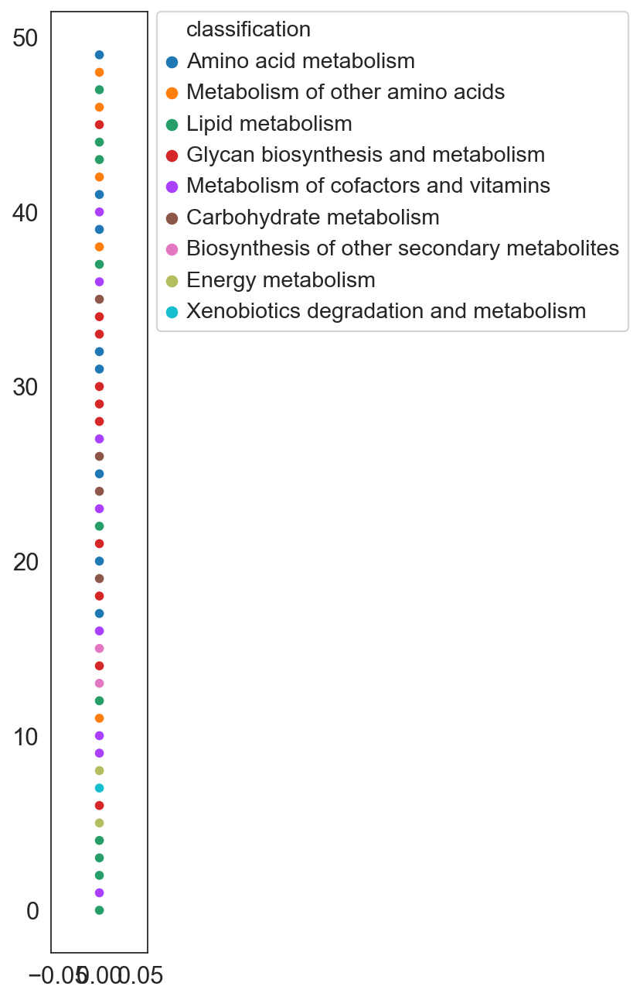

In [67]:
plt.figure(figsize=(1, 10))
sns.scatterplot(x=np.zeros(len(pathways)), y=range(len(pathways))[::-1], 
    hue=pathway_classifications.loc[pathways, 'classification'])

plt.legend(bbox_to_anchor=(1.1, 1), borderaxespad=0)

In [67]:
corrs.to_csv(master_dir + 'output/pathway_activity/correlation_w_metabolites-best_metabolites-201204.csv')

In [89]:
corrs_types = pd.Series(corrs.columns).apply(lambda x: x.split('_')[0])

cell_type_ranges = np.zeros([5])
for i, e in enumerate(['cd8', 'cd4', 'B', 'NK', 'Monocyte']):
    cell_type_ranges[i] = sum(corrs_types==e)
    
f = open(master_dir + 'output/pathway_activity/best_genes_metabolites.txt', mode='w')
for i, c in enumerate(['cd8', 'cd4', 'B', 'NK', 'Monocyte']):
    f.write('\n' + c + '\n')
    pathways = corrs_types[corrs_types==c].index
    for k in corrs.columns[pathways]:
        l = metab_genes_dict[k.split('_')[-1]]
        for gene in l:
            f.write(gene + '\n')
    temp = corrs.iloc[:, pathways]
    for metabolite in temp.index:
        if sum(temp.loc[metabolite]) != 0:
            f.write(metabolite + '\n')
f.close()

### Patient clustering/classification based on metabolites and pathway activities

In [91]:
# Map the metabolite sample_ids with the anndata
sample_map_old = pd.read_csv(master_dir + 'data/sample_association-200705_cleaned.csv')

celltypes = ['cd8', 'cd4', 'B_wo_patient4', 'NK', 'Monocyte'] #['all', 'cd8', 'cd4', 'B_wo_patient4', 'NK', 'Monocyte']
pathway_activities_list = pd.DataFrame()

for c in celltypes:
    adata = sc.read_h5ad(master_dir + 'output/' + c + '-processed-analyzed.h5ad')
    patients = adata.obs.sort_values(by='WHO_scale', axis=0)['patient'].unique()
    print(patients)

    # Load the pathway activities for all cells per patient
    pathway_activities_all = pd.read_csv(master_dir + 'output/pathway_activity/' + c + 
                                         '-metab-patient-pathway_activity.tabular', 
                                         sep='\t', header=None)
    pathway_activities_all.index = metab_pathway_list
    pathway_activities_all.index = c + '_' + pathway_activities_all.index
    pathway_activities_all.columns = patients
    
    pathway_activities_list = pd.concat([pathway_activities_list, pathway_activities_all], axis=0)
    
    del adata
    del patients

['Mix_donor1', 'BP0319250', 'BP0219101', 'BP05191345', 'CL2', ..., '36-1', '22-1', '3-1', '20-1', '13-1']
Length: 56
Categories (56, object): ['Mix_donor1', 'BP0319250', 'BP0219101', 'BP05191345', ..., '22-1', '3-1', '20-1', '13-1']
['Mix_donor1', 'BP0219101', 'BP08191115', 'BP0319250', 'CL2', ..., '3-1', '20-1', '8-1', '2-2', '13-1']
Length: 56
Categories (56, object): ['Mix_donor1', 'BP0219101', 'BP08191115', 'BP0319250', ..., '20-1', '8-1', '2-2', '13-1']
['Mix_donor1', 'CL2', 'BP0219101', 'BP08191115', 'BP05191345', ..., '13-1', '20-1', '3-1', '8-1', '2-2']
Length: 54
Categories (54, object): ['Mix_donor1', 'CL2', 'BP0219101', 'BP08191115', ..., '20-1', '3-1', '8-1', '2-2']
['Mix_donor1', 'CL2', 'BP08191115', 'BP0219101', 'BP0319250', ..., '2-2', '8-1', '3-1', '13-1', '20-1']
Length: 56
Categories (56, object): ['Mix_donor1', 'CL2', 'BP08191115', 'BP0219101', ..., '8-1', '3-1', '13-1', '20-1']
['Mix_donor1', 'CL2', 'BP08191115', 'BP05191345', 'BP0319250', ..., '36-1', '2-2', '22-1'

In [92]:
# Merge the pathway activities and serum metabolites per patient
df_serum_and_pathways = pd.merge(sample_map_old.loc[:, ['sample_name', 'sample_id']], df_serum, 
                                 left_on='sample_id', right_index=True, how='inner')
df_serum_and_pathways = pd.merge(df_serum_and_pathways, pathway_activities_list.transpose(), left_on='sample_name', 
                                 right_index=True, how='inner')
df_serum_and_pathways.index = df_serum_and_pathways['sample_id']
df_serum_and_pathways = df_serum_and_pathways.drop(columns=['sample_id', 'sample_name'])

# Pick or don't pick? Try both?
# 1) Pick pathways that are already significantly correlated with WHO scale
#sig_pathways = pd.read_csv(master_dir + 'output/pathway_activity/pathway_activity_trends/' + 
#                           c + '-all_cells.csv', 
#                           sep=',', header=0)
#sig_pathways.index = sig_pathways['0']
#sig_pathways = sig_pathways.drop(columns='0')

# 2) Don't limit the pathways 
# (No additional code needed)

# [-90:] is the pathway activities, # [:-90] is the serum metabolites per patient
#df_serum_merged = df_serum_and_pathways.iloc[:, :-90]
#df_pathways_merged = df_serum_and_pathways.iloc[:, -90:]

#df_serum_and_pathways = df_serum_and_pathways.dropna(axis=1)
df_serum_and_pathways    

,S-1-pyrroline-5-carboxylate,spermidine,1-methylnicotinamide,"12,13-DiHOME",5-hydroxyindoleacetate,alpha-ketoglutarate,kynurenate,3-hydroxyisobutyrate,3-hydroxy-3-methylglutarate,homovanillate (HVA),...,Monocyte_Terpenoid backbone biosynthesis,Monocyte_Biosynthesis of ansamycins,Monocyte_Caffeine metabolism,Monocyte_Monobactam biosynthesis,"Monocyte_Neomycin, kanamycin and gentamicin biosynthesis",Monocyte_Prodigiosin biosynthesis,Monocyte_Aflatoxin biosynthesis,Monocyte_Metabolism of xenobiotics by cytochrome P450,Monocyte_Drug metabolism - cytochrome P450,Monocyte_Drug metabolism - other enzymes
sample_id,,,,,,,,,,,,,,,,,,,,,
INCOV001-AC,0.889612,0.667237,0.436160,0.941759,NaN,1.862825,NaN,0.952670,2.578744,3.709393,...,0.763284,1.000000,0.342299,0.938808,0.564621,0.726538,1.000000,1.000000,0.590801,0.699702
INCOV001-BL,NaN,1.069591,0.403287,0.680598,0.875862,1.435992,1.810513,1.441880,1.603509,2.173915,...,0.925709,1.354925,1.000000,0.547563,0.558386,1.102874,0.879908,1.120733,1.000000,1.212882
INCOV002-AC,1.947838,0.318462,NaN,1.930940,0.548091,6.236408,1.460961,1.891234,1.062238,0.544276,...,0.853517,0.755630,0.505575,1.000000,1.000000,0.815757,1.000000,1.000000,1.000000,0.852823
INCOV002-BL,NaN,0.686773,2.276374,1.193626,0.461479,0.654987,1.005636,1.819546,0.758030,1.083164,...,1.000000,0.935064,0.711978,0.861128,0.755502,0.945554,1.084008,0.800339,0.698062,0.944478
INCOV003-AC,1.493515,1.099672,1.283093,NaN,0.277898,2.252301,2.302361,2.790020,1.138537,0.598381,...,0.844368,1.000000,0.381217,1.067030,0.803748,0.798156,0.929240,0.815661,0.606496,0.770711
INCOV003-BL,0.586063,1.193088,0.611347,4.529728,0.660536,0.709994,1.376158,3.385082,1.694633,NaN,...,0.876213,0.764791,0.521695,1.209354,1.000000,0.828294,1.061270,0.954125,0.845210,0.938256
INCOV004-AC,1.158299,0.492435,0.760496,0.652513,1.118020,1.804437,1.698294,1.032054,1.985810,1.305648,...,1.000000,1.413685,1.000000,0.615304,1.000000,0.897168,1.085646,1.000000,0.650016,1.000000
INCOV004-BL,0.839983,0.454993,0.958646,0.278097,0.221124,1.411163,1.437406,1.729549,1.904780,0.966603,...,1.058018,1.238984,1.000000,0.920359,0.885911,1.055863,0.928904,0.954056,0.710059,1.086537
INCOV005-AC,1.923873,0.969882,1.680495,0.735387,0.430756,1.614725,2.222814,0.948303,1.429709,NaN,...,0.797684,0.813270,0.536372,0.765623,0.875091,0.877076,1.000000,0.784923,0.601218,0.857910


In [93]:
df_serum_ann.index = df_serum_ann['sample_id']

In [94]:
adata_integrated = anndata.AnnData(X=df_serum_and_pathways)
adata_integrated.obs = df_serum_ann.loc[df_serum_and_pathways.index].iloc[:, :-1050]
adata_integrated.obs['who_ordinal_scale'] = adata_integrated.obs['who_ordinal_scale'].apply(\
                                        lambda v: 1 if v=='<=2' else (1.5 if v=='1 or 2' else v))
adata_integrated.obs['who_ordinal_scale'] = adata_integrated.obs['who_ordinal_scale'].astype(float)
adata_integrated

AnnData object with n_obs × n_vars = 46 × 1500
    obs: 'source_label', 'observation_id', 'incov_redcap_event_name', 'observation_days_since_enrollment', 'abdominal_pain', 'ambulatory', 'blood_draw_status', 'blood_draw_status_bad', 'blood_draw_type', 'blood_oxygenation', 'blood_oxygenation_max', 'blood_oxygenation_min', 'chest_xray_ct', 'cough', 'diarrhea', 'diastolic_bp', 'dypsnea', 'dysgeusia', 'ecmo', 'fatigue', 'height', 'mechanical_ventilation', 'nausea_vomiting', 'new_dialysis_need', 'new_vaspressor_need', 'patient_location', 'pulse', 'respiratory_rate', 'respiratory_support', 'sputum', 'systolic_bp', 'temperature', 'temperature_max', 'temperature_min', 'weight', 'who_ordinal_scale', 'sample_id'

In [95]:
# Normalization of each metabolite concentration and pathway activity
adata_integrated.X = np.nan_to_num(adata_integrated.X)

tempX = (adata_integrated.X - np.mean(adata_integrated.X, axis=0)) / \
        (np.max(adata_integrated.X, axis=0) - np.min(adata_integrated.X, axis=0)) 
adata_integrated.X = tempX
adata_integrated.X = np.nan_to_num(adata_integrated.X)
#adata_serum.X = np.array(adata_serum.X, dtype=float)
#sc.pp.normalize_total(adata_serum, exclude_highly_expressed=True, layers='all', layer_norm='X')
sc.tl.pca(adata_integrated, svd_solver='arpack')

computing PCA
    with n_comps=45
    finished (0:00:00)


<ipython-input-95-fdeeda3b7c39>:4: RuntimeWarning: invalid value encountered in true_divide
  tempX = (adata_integrated.X - np.mean(adata_integrated.X, axis=0)) / \


... storing 'source_label' as categorical
... storing 'incov_redcap_event_name' as categorical
... storing 'abdominal_pain' as categorical
... storing 'ambulatory' as categorical
... storing 'blood_draw_status' as categorical
... storing 'blood_draw_status_bad' as categorical
... storing 'blood_draw_type' as categorical
... storing 'chest_xray_ct' as categorical
... storing 'cough' as categorical
... storing 'diarrhea' as categorical
... storing 'dypsnea' as categorical
... storing 'dysgeusia' as categorical
... storing 'ecmo' as categorical
... storing 'fatigue' as categorical
... storing 'mechanical_ventilation' as categorical
... storing 'nausea_vomiting' as categorical
... storing 'new_dialysis_need' as categorical
... storing 'new_vaspressor_need' as categorical
... storing 'patient_location' as categorical
... storing 'respiratory_support' as categorical
... storing 'sputum' as categorical
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as v

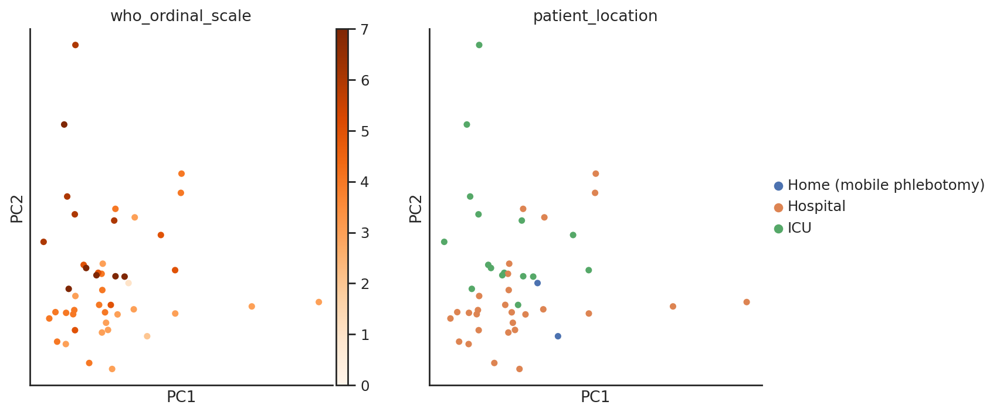

In [96]:
#adata_serum.obs['Age_at_baseline'] = adata_serum.obs['Age_at_baseline'].str.replace('Not Recorded', 
#                                                                                              '0').astype(int)
#adata_serum.obs['Age_at_baseline'] = adata_serum.obs['Age_at_baseline'].astype(int)

sns.set_style('white')
sns.set_style('ticks')
f, axes = plt.subplots(1, 2, figsize=(10, 5), sharex=True, sharey=True)
sns.despine()

fig = sc.pl.pca(adata_integrated, color='who_ordinal_scale', size=100, cmap='Oranges', vmin=0, show=False, ax=axes[0])
fig = sc.pl.pca(adata_integrated, color='patient_location', size=100, show=False, ax=axes[1])
#fig = sc.pl.pca(adata_serum, color='observation_days_since_enrollment', size=100, cmap='coolwarm', 
#                show=False, ax=axes[2])
#plt.xlim([-0.25, 0.25])
#plt.ylim([-0.25, 0.25])
#plt.tight_layout()

In [97]:
# Most important PCA components
# Get loading scores of the first two PCs and find the most highly scored metabolites per PC
loading_scores = pd.DataFrame(abs(adata_integrated.varm['PCs'][:, 0:2]), columns=['PC1', 'PC2'])
loading_scores.index = adata_integrated.var_names
#loading_scores.to_csv(master_dir + 'output/metabolite_pathway_integrated-PCA1_2-absolute_loading_scores.csv')
loading_scores = loading_scores.sort_values(by='PC2', ascending=False).reset_index()
#np.where(loading_scores['index']=='mannose')

In [133]:
# This time, try selecting only the pathways and metabolites that are significantly correlated with WHO score
# Pick pathways that are already significantly correlated with WHO scale
pathway_activities_list = []

for c in celltypes:
    sig_pathways = pd.read_csv(master_dir + 'output/pathway_activity/pathway_activity_trends/' + 
                               c + '-all_cells.csv', 
                               sep=',', header=0)
    sig_pathways.index = c + '_' + sig_pathways['0']
    sig_pathways = sig_pathways.drop(columns='0')
    
    pathway_activities_list = pathway_activities_list + sig_pathways.index.tolist()

adata_integrated_corr_only = adata_integrated[:, sig_metabolites.index.tolist() + pathway_activities_list]

#adata_serum.X = np.array(adata_serum.X, dtype=float)
#sc.pp.normalize_total(adata_serum, exclude_highly_expressed=True, layers='all', layer_norm='X')
sc.tl.pca(adata_integrated_corr_only, svd_solver='arpack')

sc.pp.neighbors(adata_integrated_corr_only)
sc.tl.umap(adata_integrated_corr_only)
sc.tl.louvain(adata_integrated_corr_only, resolution=0.05)

computing PCA
    with n_comps=45
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 45
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 1 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)


In [135]:
# Reverse PC 1
arr = adata_integrated_corr_only.varm['PCs'].copy()
arr[:,0] *= -1

In [137]:
adata_integrated_corr_only.varm['PCs'][:, 0] = arr[:, 0]

In [144]:
adata_integrated_corr_only.obsm['X_pca'][:, 0] *= -1

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

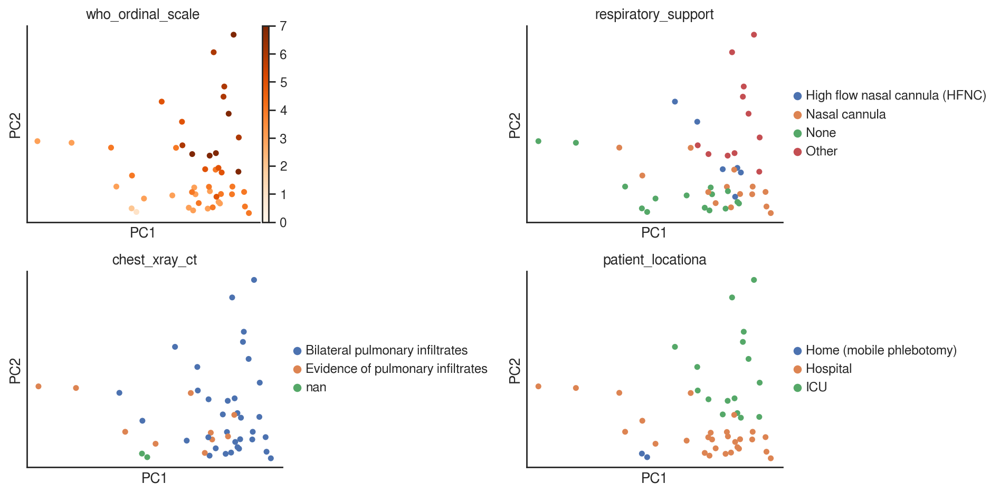

In [150]:
sns.set_style('white', rc={'font':'FreeSans', 'font.family':'sans-serif', 'font.sans-serif':'FreeSans'})
f, axes = plt.subplots(2, 2, figsize=(12, 6), sharex=True, sharey=True)
sns.despine()

#adata_integrated_corr_only.obs['patient_location'] = \
#    adata_integrated_corr_only.obs['patient_location'].apply(lambda x: x.toordinal())
fig = sc.pl.pca(adata_integrated_corr_only, color='who_ordinal_scale', size=100, cmap='Oranges', vmin=0, show=False, ax=axes[0, 0])
fig = sc.pl.pca(adata_integrated_corr_only, color='respiratory_support', size=100, show=False, ax=axes[0, 1])
fig = sc.pl.pca(adata_integrated_corr_only, color='chest_xray_ct', size=100, show=False, ax=axes[1, 0])

adata_integrated_corr_only.obs['patient_locationa'] = \
    adata_integrated_corr_only.obs['patient_location'].copy() # Plotting by patient_location doesn't work for some reason
fig = sc.pl.pca(adata_integrated_corr_only, color='patient_locationa', size=100, show=False, ax=axes[1, 1])
plt.tight_layout()

... storing 'kmeans2' as categorical
... storing 'kmeans3' as categorical
... storing 'kmeans4' as categorical
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if 

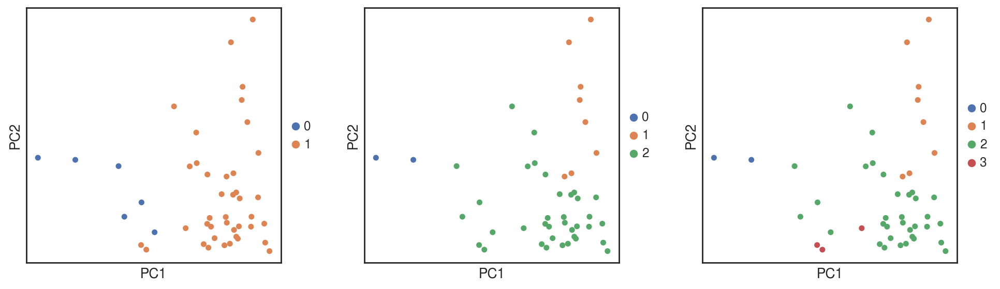

In [151]:
# extract pca coordinates
X_pca = adata_integrated_corr_only.obsm['X_pca'] 

# kmeans with k=2
kmeans = KMeans(n_clusters=2, random_state=0).fit(X_pca) 
adata_integrated_corr_only.obs['kmeans2'] = kmeans.labels_.astype(str)

# kmeans with k=3
kmeans = KMeans(n_clusters=3, random_state=0).fit(X_pca) 
adata_integrated_corr_only.obs['kmeans3'] = kmeans.labels_.astype(str)

# kmeans with k=4
kmeans = KMeans(n_clusters=4, random_state=0).fit(X_pca) 
adata_integrated_corr_only.obs['kmeans4'] = kmeans.labels_.astype(str)

sc.pl.pca(adata_integrated_corr_only, color=['kmeans2', 'kmeans3', 'kmeans4'], title=['', '', ''], size=100)

# 2 clusters separates between relatively well and sick patients (e.g. by degree of pulmonary infiltration)
# 3 clusters separates between well, sick, and critically ill patients 
# (e.g. by respiratory support needed/hospitalization status)

In [101]:
# Most important PCA components
# Get loading scores of the first two PCs and find the most highly scored metabolites per PC
loading_scores = pd.DataFrame(abs(adata_integrated_corr_only.varm['PCs']))
loading_scores.index = adata_integrated_corr_only.var_names
#loading_scores.to_csv(master_dir + 'output/metabolite_pathway_corrs_only_integrated-PCA-absolute_loading_scores.csv')
#loading_scores = loading_scores.sort_values(by='PC1', ascending=False).reset_index()
#np.where(loading_scores['index']=='mannose')

In [154]:
# Most important PCA components
# Get loading scores of the first two PCs and find the most highly scored metabolites per PC
loading_scores = pd.DataFrame(adata_integrated_corr_only.varm['PCs'])
loading_scores.index = adata_integrated_corr_only.var_names
loading_scores.to_csv(master_dir + 'output/metabolite_pathway_corrs_only_integrated-PCA-loading_scores.csv')
#loading_scores = loading_scores.sort_values(by='PC1', ascending=False).reset_index()
#np.where(loading_scores['index']=='mannose')

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


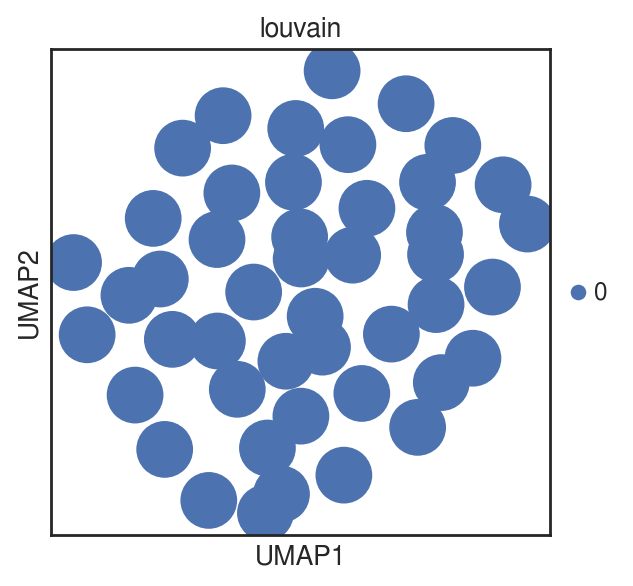

In [155]:
sc.pl.umap(adata_integrated_corr_only, color='louvain', use_raw=False, cmap='viridis')

### Using the above as a predictive cohort and testing on a larger dataset

In [156]:
patients_WHO_alt_names = patients_WHO.copy()
patients_WHO_alt_names = [pt[5:8] + '-2' if pt[-2:]=='AC' else pt[5:8] + '-1' if pt[-2:]=='BL' else 
                          pt[5:8] + '-3' for pt in patients_WHO_alt_names]
patients_WHO_alt_names = [pt[2:] if pt[0:2]=='00' else pt[1:] if pt[0]=='0' else 
                          pt for pt in patients_WHO_alt_names]

In [157]:
celltypes = ['cd8', 'cd4', 'B_wo_patient4', 'NK', 'Monocyte']
dfs = []
for i in range(5):
    df = pd.read_csv(master_dir + 'output/pathway_activity/' + celltypes[i] + 
                       '-metab-patient-pathway_activity_from_pseudobulk-201101.tabular', sep='\t', header=0)
    df.index = celltypes[i] + '_' + metab_genes.index
    dfs.append(df)
dfs[0].head()

,INCOV001-BL,INCOV001-AC,INCOV002-BL,INCOV002-AC,INCOV003-BL,INCOV003-AC,INCOV004-BL,INCOV004-AC,INCOV005-BL,INCOV005-AC,...,3577BW,5046BW,6130BW,7541BW,BP0219101,BP0319250,BP05191345,BP08191115,CL2,Mix_donor1
0,,,,,,,,,,,,,,,,,,,,,
cd8_Glycolysis / Gluconeogenesis,0.898729,0.951472,0.893075,1.279037,1.039306,0.983697,1.150868,0.816766,1.038205,1.114363,...,0.742280,0.782930,0.875752,0.905581,1.228740,0.984457,1.232438,0.868732,0.870098,1.002145
cd8_Citrate cycle (TCA cycle),0.776978,0.998843,1.042131,1.455626,1.232393,1.110492,1.240930,0.925055,1.494531,1.339773,...,0.793877,0.850558,0.969094,0.961499,1.551407,1.109045,1.433042,1.093483,0.973596,1.076745
cd8_Pentose phosphate pathway,0.879916,1.089128,1.040640,1.340683,1.245051,1.165829,1.216801,0.931643,1.314399,1.088676,...,0.771976,0.870204,0.930185,0.935305,1.386612,1.166064,1.252109,1.025145,1.004521,1.035815
cd8_Pentose and glucuronate interconversions,0.813280,0.987245,0.975942,1.116292,0.995154,1.201991,1.249299,0.865345,1.139921,1.049432,...,0.787490,0.905627,0.974830,1.176402,1.149837,0.939444,1.296442,0.938538,0.972563,1.117139
cd8_Fructose and mannose metabolism,0.998170,1.144153,0.957056,1.171880,0.932342,0.976747,0.947814,0.744848,0.938972,1.142717,...,0.669685,0.830626,0.816703,0.850968,1.304056,1.045777,1.258721,1.030011,1.061695,1.132073


In [158]:
dfs = [df.transpose() for df in dfs]
df_integrated_corr_only_test = pd.DataFrame()
for df in dfs:
    df_integrated_corr_only_test = pd.concat([df_integrated_corr_only_test, df], axis=1)
    
df_integrated_corr_only_test = df_integrated_corr_only_test.loc[:, pathway_activities_list]
df_integrated_corr_only_test

,cd8_Steroid hormone biosynthesis,cd8_Ether lipid metabolism,cd8_Glycosphingolipid biosynthesis - globo and isoglobo series,cd8_Histidine metabolism,cd8_Pyrimidine metabolism,cd8_alpha-Linolenic acid metabolism,cd8_Glutathione metabolism,"cd8_Cutin, suberine and wax biosynthesis",cd8_Drug metabolism - other enzymes,cd8_Biosynthesis of unsaturated fatty acids,...,Monocyte_Drug metabolism - other enzymes,Monocyte_N-Glycan biosynthesis,Monocyte_Sulfur metabolism,Monocyte_Steroid biosynthesis,Monocyte_Primary bile acid biosynthesis,Monocyte_Synthesis and degradation of ketone bodies,Monocyte_Folate biosynthesis,Monocyte_One carbon pool by folate,Monocyte_Biosynthesis of unsaturated fatty acids,Monocyte_alpha-Linolenic acid metabolism
INCOV001-BL,0.915565,0.763406,0.902279,0.837885,0.797618,0.980362,0.771978,0.941091,0.743395,0.701269,...,0.832574,0.947642,0.799222,0.949002,0.897611,0.791510,0.837997,0.786224,0.803334,0.879488
INCOV001-AC,0.776343,0.873908,0.787618,0.836332,0.910550,0.771469,0.872916,1.504925,0.866704,0.742726,...,0.914313,1.006123,1.006691,0.764577,0.807017,0.969476,0.870193,0.945160,0.811560,0.874855
INCOV002-BL,0.938457,0.836012,0.868246,0.807454,0.945111,0.695023,1.068986,0.720249,0.975520,0.854991,...,0.950538,0.859503,0.754528,1.009614,0.885051,1.059351,0.918384,1.057866,0.899589,0.941409
INCOV002-AC,1.085962,1.094992,1.009909,0.986298,1.205054,1.063379,1.186048,1.543831,1.177911,1.362399,...,0.888326,0.863429,1.011495,0.807061,0.863739,1.100183,0.889792,0.723022,0.943144,0.865105
INCOV003-BL,0.736997,0.820141,0.776895,0.661266,1.001725,0.843513,0.955697,0.264217,0.952861,0.924579,...,1.185235,1.270282,1.268438,1.241418,1.035983,1.253534,1.197400,1.105032,1.314507,1.118211
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
BP0319250,0.919981,0.971143,1.094507,0.852371,1.060246,0.984634,0.901652,1.319233,0.966826,0.944066,...,1.007942,1.071795,0.886099,0.770824,0.987334,1.169828,0.915120,0.757067,0.847355,0.782620
BP05191345,1.023471,0.890112,1.083629,0.971586,1.161971,0.987146,1.066938,0.462834,1.077198,0.883202,...,1.150131,1.183012,1.179804,0.769669,0.802354,1.059217,0.899385,0.723258,0.745532,0.954920
BP08191115,0.843994,1.113845,1.128714,0.837790,1.015738,1.054887,0.858770,0.530630,0.847595,0.795193,...,0.964548,1.112948,1.248446,0.847188,0.790066,1.083753,1.096070,1.215292,0.883395,1.081025
CL2,0.903548,0.917906,1.091300,0.772191,0.856611,0.765620,0.870657,0.795438,0.951608,0.886519,...,0.951379,0.935649,0.944912,0.773852,0.915599,0.760399,0.813544,0.736137,0.808697,0.875753


In [159]:
df_integrated_corr_only_test = pd.merge(df_serum.loc[:, sig_metabolites.index], df_integrated_corr_only_test, left_index=True, right_index=True,
                                       how='inner')
df_integrated_corr_only_test

,6-bromotryptophan,phenylalanylmethionine,3-ureidopropionate,tryptophylleucine,mannose,4-vinylphenol sulfate,phenylalanylphenylalanine,umbelliferone sulfate,"sphingomyelin (d18:2/14:0, d18:1/14:1)*",(N(1) + N(8))-acetylspermidine,...,Monocyte_Drug metabolism - other enzymes,Monocyte_N-Glycan biosynthesis,Monocyte_Sulfur metabolism,Monocyte_Steroid biosynthesis,Monocyte_Primary bile acid biosynthesis,Monocyte_Synthesis and degradation of ketone bodies,Monocyte_Folate biosynthesis,Monocyte_One carbon pool by folate,Monocyte_Biosynthesis of unsaturated fatty acids,Monocyte_alpha-Linolenic acid metabolism
INCOV001-AC,0.765173,0.66132,2.183713,0.623244,1.150100,0.354502,0.681526,0.216586,0.740682,2.370227,...,0.914313,1.006123,1.006691,0.764577,0.807017,0.969476,0.870193,0.945160,0.811560,0.874855
INCOV001-BL,0.843272,NaN,2.196096,0.322488,1.164324,0.313498,0.404073,NaN,0.932963,2.514923,...,0.832574,0.947642,0.799222,0.949002,0.897611,0.791510,0.837997,0.786224,0.803334,0.879488
INCOV002-AC,0.882783,NaN,6.373021,NaN,1.755274,0.043694,NaN,NaN,0.357163,2.124053,...,0.888326,0.863429,1.011495,0.807061,0.863739,1.100183,0.889792,0.723022,0.943144,0.865105
INCOV002-BL,0.316421,NaN,2.470831,0.404253,4.574405,0.079903,0.460520,NaN,0.450302,1.857681,...,0.950538,0.859503,0.754528,1.009614,0.885051,1.059351,0.918384,1.057866,0.899589,0.941409
INCOV003-AC,0.401308,NaN,3.273477,0.824486,0.944178,NaN,0.890395,NaN,0.318364,5.104370,...,0.961843,1.087550,1.038788,1.091269,0.937307,1.019430,0.970590,0.957525,1.099031,1.296381
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
INCOV136-BL,0.534891,NaN,2.031363,0.588036,2.803952,0.066898,0.773289,NaN,0.339453,2.643519,...,0.746883,0.724656,0.730915,0.899949,0.634721,1.136654,0.725793,0.783196,0.784797,0.958594
INCOV137-AC,0.401456,NaN,1.882056,0.743828,1.663624,0.238357,0.748254,0.208363,0.560254,2.389413,...,0.718229,0.895656,0.481427,0.690619,0.511602,0.473833,0.931964,0.697554,0.467249,0.602873
INCOV137-BL,0.325708,NaN,1.609600,0.803378,2.693312,0.103373,0.754278,0.158000,0.539773,3.602556,...,0.735135,0.808545,0.462912,0.727908,0.658840,0.749024,0.651862,0.656318,0.522646,0.673902
INCOV142-AC,0.426453,NaN,NaN,0.637257,1.675057,1.139801,0.722860,NaN,0.452666,1.675284,...,0.822553,0.811032,0.848631,0.786049,0.702605,0.628810,0.744992,0.637449,0.773222,0.745885


In [160]:
adata_integrated_corr_only_test = anndata.AnnData(X = df_integrated_corr_only_test)
adata_integrated_corr_only_test.obs = df_serum_ann.loc[df_integrated_corr_only_test.index].iloc[:, :-1050]
adata_integrated_corr_only_test.X = np.nan_to_num(adata_integrated_corr_only_test.X)
adata_integrated_corr_only_test.varm['PCs'] = adata_integrated_corr_only.varm['PCs']

adata_integrated_corr_only_test.obs['who_ordinal_scale'] = adata_integrated_corr_only_test.obs['who_ordinal_scale'].apply(\
                                        lambda v: 1 if v=='<=2' else (1.5 if v=='1 or 2' else v))
adata_integrated_corr_only_test.obs['who_ordinal_scale'] = adata_integrated_corr_only_test.obs['who_ordinal_scale'].astype(float)

computing PCA
    with n_comps=50
    finished (0:00:02)


... storing 'source_label' as categorical
... storing 'incov_redcap_event_name' as categorical
... storing 'abdominal_pain' as categorical
... storing 'ambulatory' as categorical
... storing 'blood_draw_status' as categorical
... storing 'blood_draw_status_bad' as categorical
... storing 'blood_draw_type' as categorical
... storing 'chest_xray_ct' as categorical
... storing 'cough' as categorical
... storing 'diarrhea' as categorical
... storing 'dypsnea' as categorical
... storing 'dysgeusia' as categorical
... storing 'ecmo' as categorical
... storing 'fatigue' as categorical
... storing 'mechanical_ventilation' as categorical
... storing 'nausea_vomiting' as categorical
... storing 'new_dialysis_need' as categorical
... storing 'new_vaspressor_need' as categorical
... storing 'patient_location' as categorical
... storing 'respiratory_support' as categorical
... storing 'sputum' as categorical
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as v

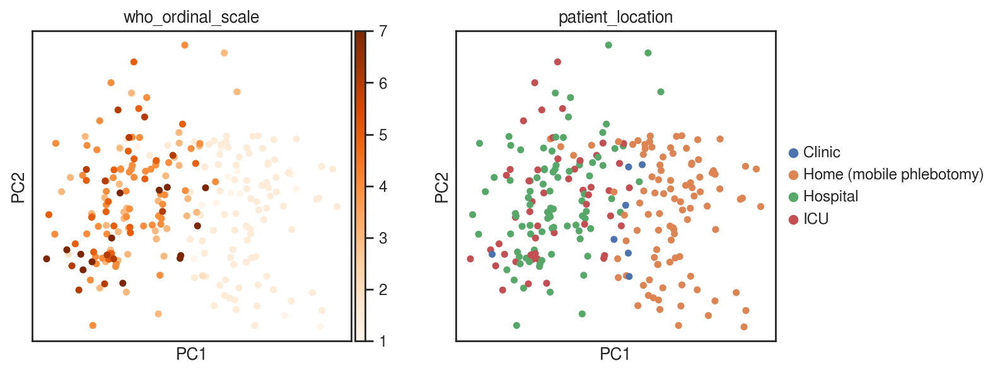

In [161]:
# New PCA as comparison
# Normalization of each metabolite concentration and pathway activity
adata_integrated.X = np.nan_to_num(adata_integrated.X)

tempX = (adata_integrated_corr_only_test.X - np.mean(adata_integrated_corr_only_test.X, axis=0)) / \
        (np.max(adata_integrated_corr_only_test.X, axis=0) - np.min(adata_integrated_corr_only_test.X, axis=0)) 
adata_integrated_corr_only_test.X = tempX
adata_integrated_corr_only_test.X = np.nan_to_num(adata_integrated_corr_only_test.X)

sc.tl.pca(adata_integrated_corr_only_test, svd_solver='arpack')

sc.pl.pca(adata_integrated_corr_only_test, size=100, color=['who_ordinal_scale', 'patient_location'], cmap='Oranges')

... storing 'kmeans2' as categorical
... storing 'kmeans3' as categorical
... storing 'kmeans4' as categorical
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if 

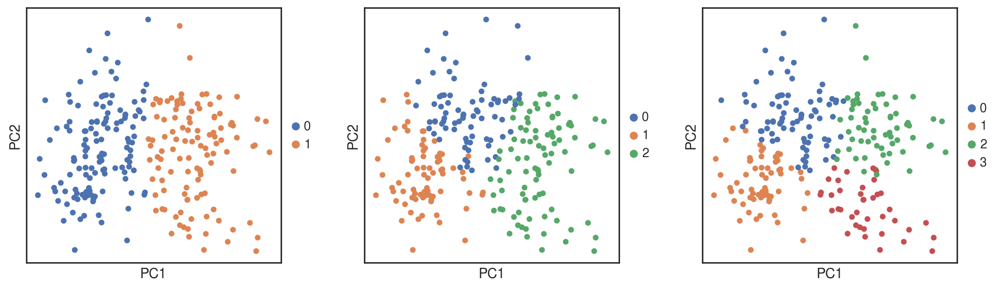

In [162]:
# extract pca coordinates
X_pca = adata_integrated_corr_only_test.obsm['X_pca'] 

# kmeans with k=2
kmeans = KMeans(n_clusters=2, random_state=0).fit(X_pca) 
adata_integrated_corr_only_test.obs['kmeans2'] = kmeans.labels_.astype(str)

# kmeans with k=3
kmeans = KMeans(n_clusters=3, random_state=0).fit(X_pca) 
adata_integrated_corr_only_test.obs['kmeans3'] = kmeans.labels_.astype(str)

# kmeans with k=4
kmeans = KMeans(n_clusters=4, random_state=0).fit(X_pca) 
adata_integrated_corr_only_test.obs['kmeans4'] = kmeans.labels_.astype(str)

sc.pl.pca(adata_integrated_corr_only_test, color=['kmeans2', 'kmeans3', 'kmeans4'], title=['', '', ''], size=100)

# 2 clusters separates between relatively well and sick patients (e.g. by degree of pulmonary infiltration)
# 3 clusters separates between well, sick, and critically ill patients 
# (e.g. by respiratory support needed/hospitalization status)

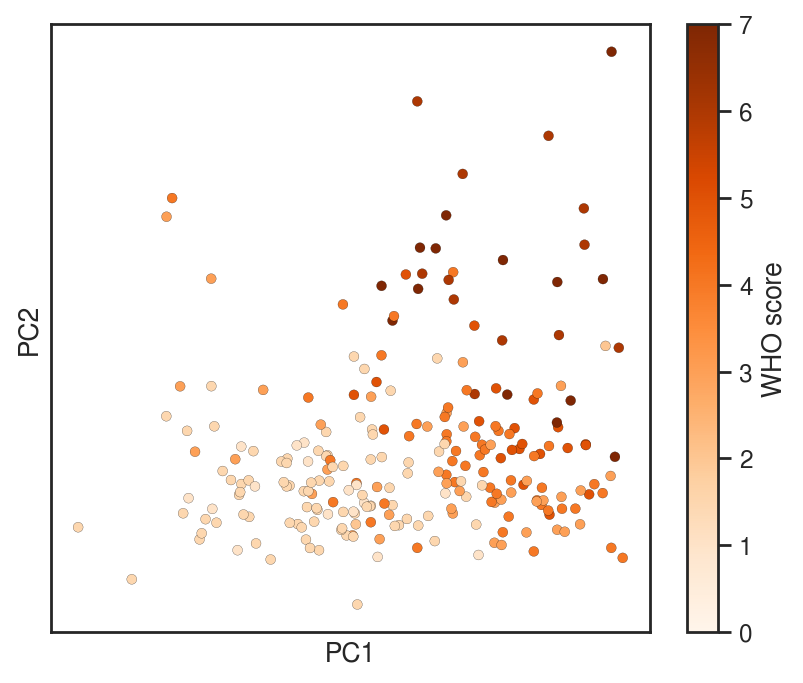

In [884]:
# Applying previously calculated PCA from the smaller integrated dataset
df_integrated_corr_only_test_nlized = pd.DataFrame(adata_integrated_corr_only_test.X, 
                                                   columns=adata_integrated_corr_only_test.var_names)
df_integrated_corr_only_test_nlized.index = adata_integrated_corr_only_test.obs.index

df_test = pd.DataFrame()
df_test['PC1'] = df_integrated_corr_only_test_nlized.apply(lambda 
                                          row: np.dot(row, adata_integrated_corr_only.varm['PCs'][:, 0]), axis=1)
df_test['PC2'] = df_integrated_corr_only_test_nlized.apply(lambda 
                                          row: np.dot(row, adata_integrated_corr_only.varm['PCs'][:, 1]), axis=1)
df_test['who_ordinal_scale'] = adata_integrated_corr_only_test.obs['who_ordinal_scale']
df_test['patient_location'] = adata_integrated_corr_only_test.obs['patient_location']
df_test.index = adata_integrated_corr_only_test.obs.index

#sns.scatterplot(x='PC1', y='PC2', data=df_test, hue='who_ordinal_scale', palette='Oranges')

ax = plt.figure(figsize=[6, 5])
ax = plt.scatter(df_test['PC1'], df_test['PC2'], c=df_test['who_ordinal_scale'], cmap='Oranges', 
                 s=20, linewidths=0.1, edgecolors='black', vmin=0)
plt.xticks([])
plt.yticks([])
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.colorbar(ax, label='WHO score')
plt.show()

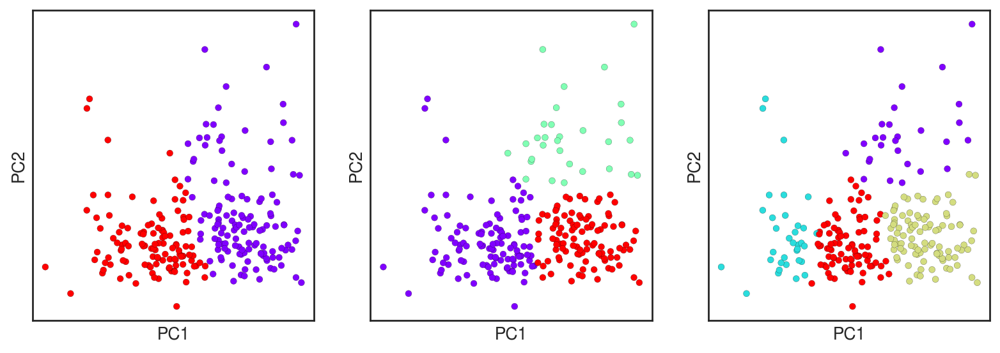

In [886]:
# extract pca coordinates
X_pca = df_test.loc[:, ['PC1', 'PC2']]

# kmeans with k=2
kmeans = KMeans(n_clusters=2, random_state=0).fit(X_pca) 
df_test['kmeans2'] = kmeans.labels_.astype(str)

# kmeans with k=3
kmeans = KMeans(n_clusters=3, random_state=0).fit(X_pca) 
df_test['kmeans3'] = kmeans.labels_.astype(str)

# kmeans with k=4
kmeans = KMeans(n_clusters=4, random_state=0).fit(X_pca) 
df_test['kmeans4'] = kmeans.labels_.astype(str)

fig, axes = plt.subplots(1,3, figsize=(12, 4))
means = ['kmeans2', 'kmeans3', 'kmeans4']
for i, e in enumerate(means):
    ax = axes[i].scatter(df_test['PC1'], df_test['PC2'], c=df_test[e].astype(int).values, cmap='rainbow',
                     s=20, linewidths=0.1, edgecolors='black')
    axes[i].set_xticks([])
    axes[i].set_yticks([])

    axes[i].set_xlabel('PC1')
    axes[i].set_ylabel('PC2')
    #plt.colorbar(sc)

adata_integrated_corr_only_test.obs[['kmeans2', 'kmeans3', 'kmeans4']] = df_test[['kmeans2', 'kmeans3', 'kmeans4']]

<Figure size 480x400 with 0 Axes>

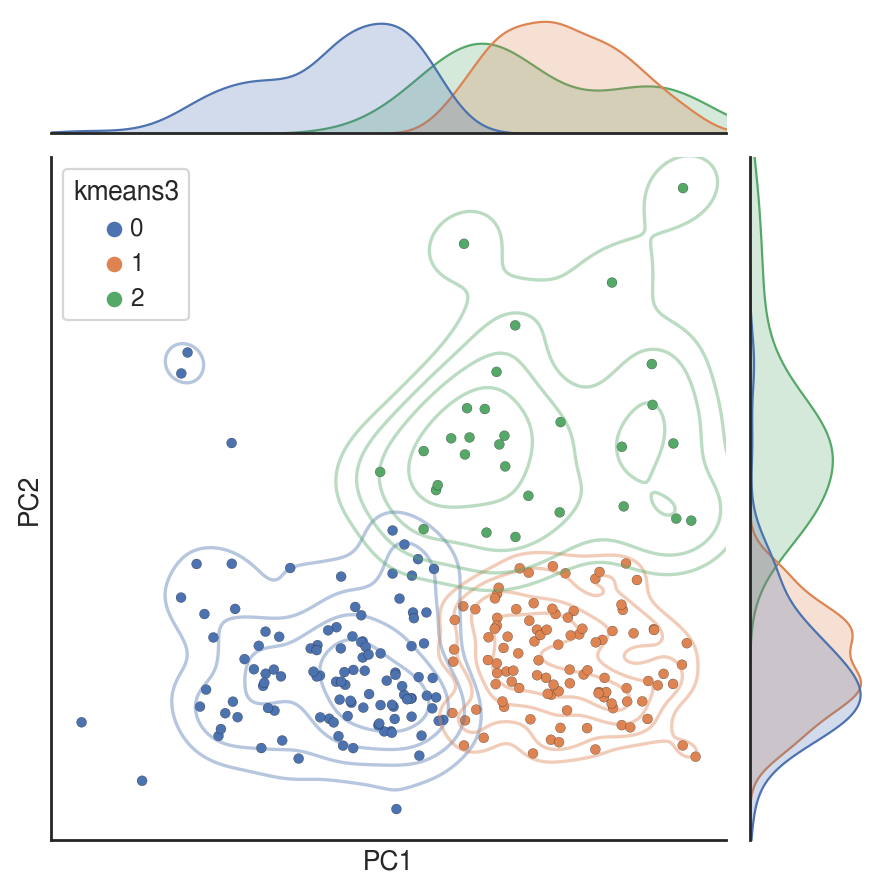

In [997]:
ax = plt.figure(figsize=[6, 5])
f = sns.JointGrid(x=df_test['PC1'], y=df_test['PC2'])
#f = sns.jointplot(df_test['PC1'], df_test['PC2'], hue=df_test['kmeans3'].map({'1': '2', '2': '1', '0': '0'}),
#                 legend=None)
#for i, cluster in enumerate(df_test['kmeans3'].unique()):
#    temp = df_test[df_test['kmeans3']==cluster]
#f.ax_joint.scatter(x=df_test['PC1'], y=df_test['PC2'], c=df_test['kmeans3'].astype(int), 
#                 s=20, linewidths=0.1, edgecolors='black')#, vmin=0, vmax=7, cmap='Oranges')
f.plot_joint(sns.scatterplot, hue=df_test['kmeans3'].map({'1': '2', '2': '1', '0': '0'}),
                 s=20, linewidth=0.1, edgecolor='black')
f.plot_joint(sns.kdeplot, hue=df_test['kmeans3'].map({'1': '2', '2': '1', '0': '0'}), 
             alpha=0.4, levels=[0.1, 0.25, 0.5, 0.75], bw_adjust=0.75, legend=None, common_norm=False)
    #f.ax_joint.contour([temp['PC1'], temp['PC2']], alpha=0.5, levels=5, bw_adjust=1)
f.ax_joint.set(xticks=[], xlabel='PC1', yticks=[], ylabel='PC2', xlim=xlim, ylim=ylim)
f.plot_marginals(sns.kdeplot, hue=df_test['kmeans3'].map({'1': '2', '2': '1', '0': '0'}), common_norm=False,
                fill=True)

plt.savefig(master_dir + 'output/metabolite_pathway_corrs_only_integrated-PCA-kmeans3-jointplot.pdf')

... storing 'kmeans2' as categorical
... storing 'kmeans3' as categorical
... storing 'kmeans4' as categorical
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if 

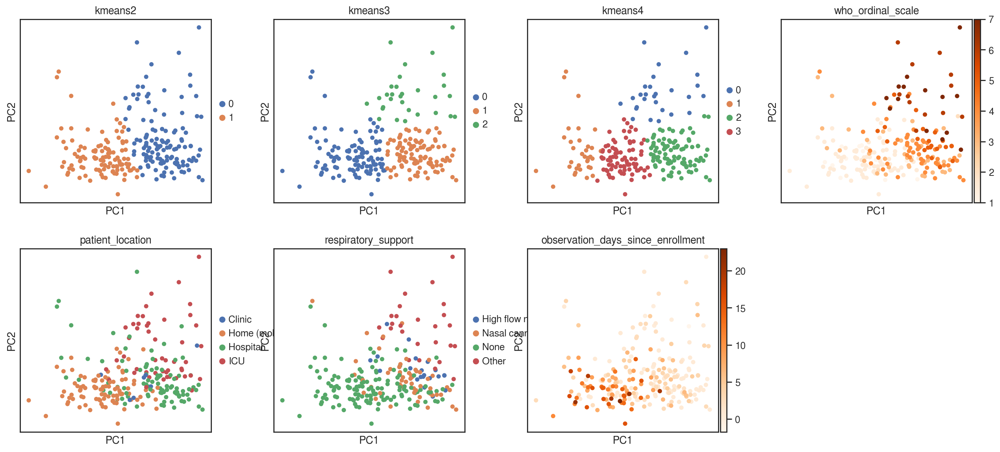

In [888]:
adata_integrated_corr_only_test.obsm['X_pca_expanded'] = adata_integrated_corr_only_test.obsm['X_pca'].copy()
adata_integrated_corr_only_test.obsm['X_pca'] = X_pca
adata_integrated_corr_only_test.obs['kmeans3'] = \
    adata_integrated_corr_only_test.obs['kmeans3'].map({'1': '2', '2': '1', '0': '0'})
f = sc.pl.pca(adata_integrated_corr_only_test, 
          color=['kmeans2', 'kmeans3', 'kmeans4', 'who_ordinal_scale', 'patient_location', 
                 'respiratory_support', 'observation_days_since_enrollment'],
         cmap='Oranges', size=100, show=False)
xlim = f[0].get_xlim()
ylim = f[0].get_ylim()
# 2 PCA clusters separates sick and well patients
# 3 PCA clusters additionally separates out critically ill

In [218]:
tx_info = pd.read_csv(master_dir + 'data/observations_2020-09-04_1027-cleaned-withTxInfo.tsv', sep=',')
tx_info.columns

Index(['source_label', 'observation_id', 'incov_redcap_event_name',
       'observation_days_since_enrollment', 'abdominal_pain', 'ambulatory',
       'blood_draw_status', 'blood_draw_status_bad', 'blood_draw_type',
       'blood_oxygenation', 'blood_oxygenation_max', 'blood_oxygenation_min',
       'chest_xray_ct', 'cough', 'diarrhea', 'diastolic_bp', 'dypsnea',
       'dysgeusia', 'ecmo', 'fatigue', 'height', 'mechanical_ventilation',
       'nausea_vomiting', 'new_dialysis_need', 'new_vaspressor_need',
       'patient_location', 'pulse', 'respiratory_rate', 'respiratory_support',
       'sputum', 'systolic_bp', 'temperature', 'temperature_max',
       'temperature_min', 'weight', 'who_ordinal_scale', 'patient_num',
       'time_wrt_Remdesivir (RDV)', 'time_wrt_Tocilizumab',
       'time_wrt_Vitamin C', 'time_wrt_Zinc',
       'time_wrt_Hydroxychloroquine (HCQ)', 'time_wrt_HCQ + Azithromycin',
       'time_wrt_Steroid', 'time_wrt_Other', 'time_wrt_Plasma Transfusions'],
      dtype='

In [233]:
#backup = adata_integrated_corr_only_test.obs.copy()
adata_integrated_corr_only_test.obs = backup.copy()

In [234]:
temp = ['BL' if x=='Baseline' else 'AC' if x=='Acute' else 'NA' for x in tx_info['blood_draw_type']]
tx_info['temp'] = tx_info['source_label'] + '-' + temp
adata_integrated_corr_only_test.obs = pd.merge(adata_integrated_corr_only_test.obs, 
         tx_info.iloc[:, -10:], left_index=True, right_on='temp', how='left')
adata_integrated_corr_only_test.obs.index = adata_integrated_corr_only_test.obs['temp']

AnnData expects .obs.index to contain strings, but your first indices are: Int64Index([1, 0], dtype='int64'), …


In [473]:
pts = adata_integrated_corr_only_test.obs.copy()
# Select moderate patients only
#pts = pts[pts['who_ordinal_scale'].isin(['3', '4'])]
pts = pts.sort_values(by=['source_label', 'observation_days_since_enrollment'])

for i in pts.index:
    if len(pts[pts['source_label']==i.split('-')[0]]) < 2:
        pts = pts.drop(index=i)
#    elif not (pts[pts['source_label']==i.split('-')[0]]['who_ordinal_scale'].iloc[1]==3.0 or \
#             pts[pts['source_label']==i.split('-')[0]]['who_ordinal_scale'].iloc[1]==4.0):
#        pts = pts.drop(index=i)
        
pts['who_change'] = [pts.loc[x + '-AC', 'who_ordinal_scale'] - \
                     pts.loc[x + '-BL', 'who_ordinal_scale'] for x in pts['source_label']]
#pts['who_change_cat'] = ['Worse' if x > 0 else 'Better' if x < 0 else 'Stable' \
#                         for x in pts['who_change']]
pts['who_change_cat'] = ['Worse/Stable' if x >= 0 else 'Better' \
                         for x in pts['who_change']]

pts['severity_T1'] = ['Mild' if pts.loc[x + '-BL', 'who_ordinal_scale'] < 3.0 \
                      else 'Moderate' if pts.loc[x + '-BL', 'who_ordinal_scale'] < 5.0 \
                      else 'Severe' for x in pts['source_label']]

pts['severity_T2'] = ['Mild' if pts.loc[x + '-AC', 'who_ordinal_scale'] < 3.0 \
                      else 'Moderate' if pts.loc[x + '-AC', 'who_ordinal_scale'] < 5.0 \
                      else 'Severe' for x in pts['source_label']]

<AxesSubplot:>

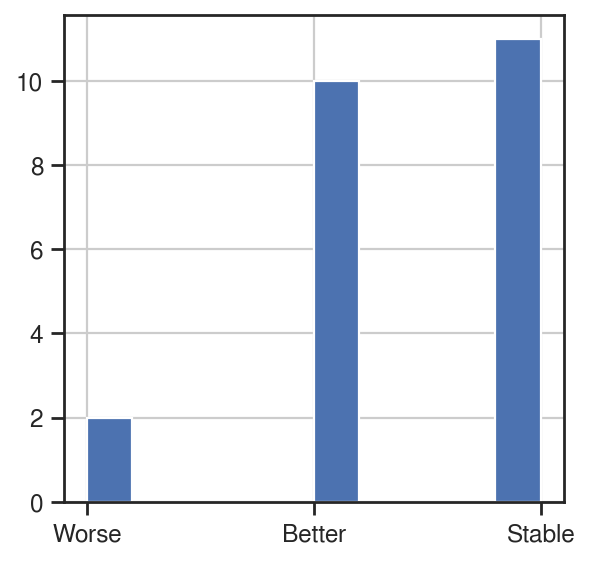

In [420]:
pts[pts['severity_T1']=='Severe'].groupby('source_label')['who_change_cat'].first().dropna().hist()

... storing 'severity' as categorical
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argu

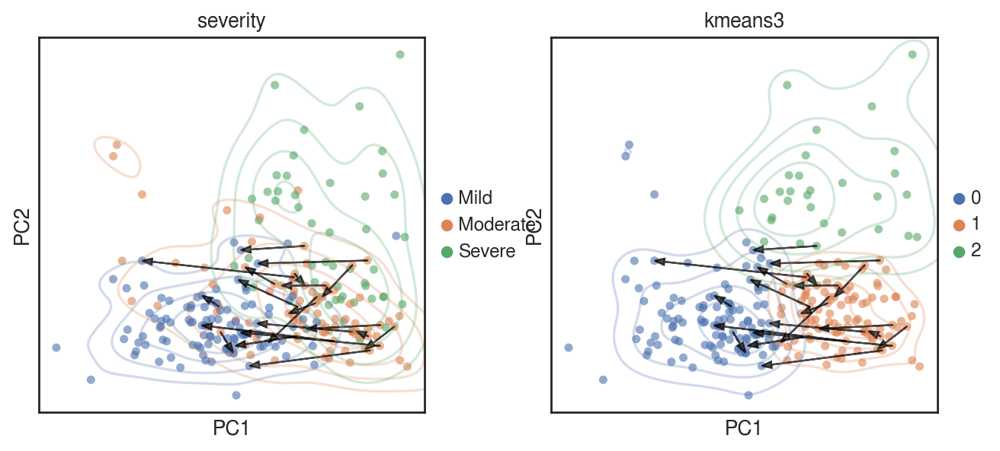

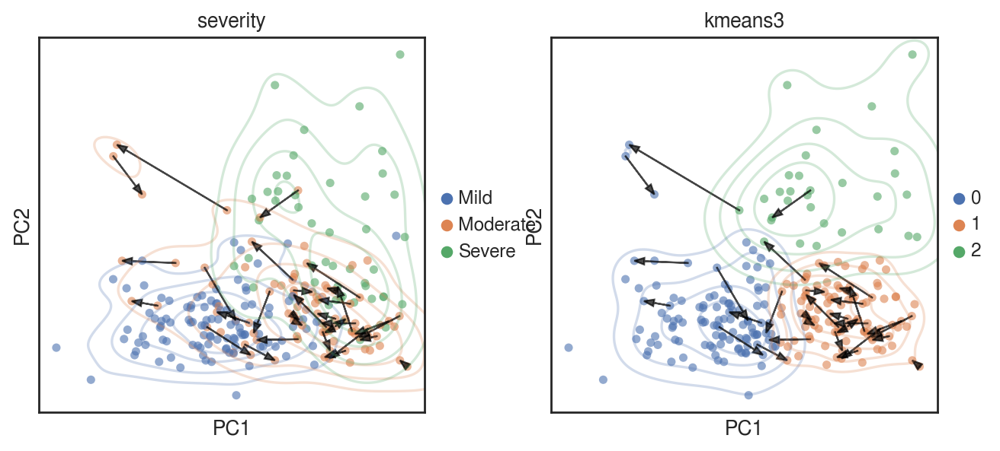

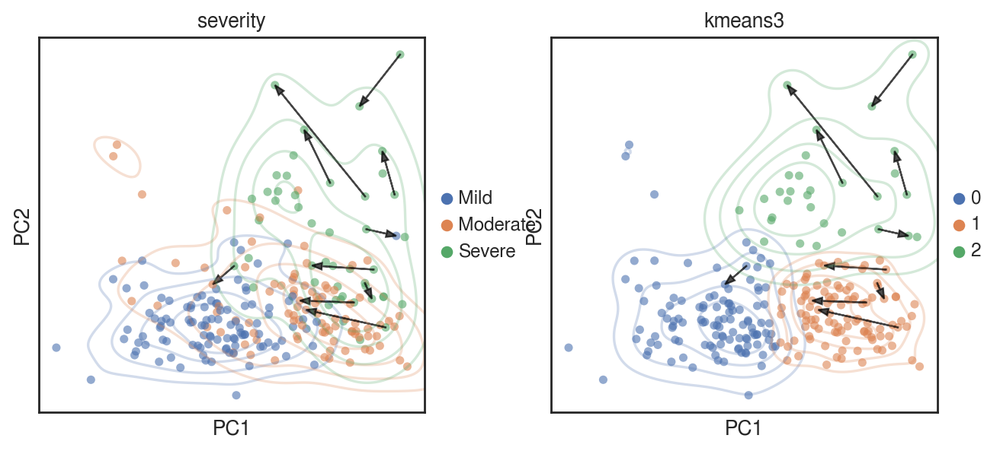

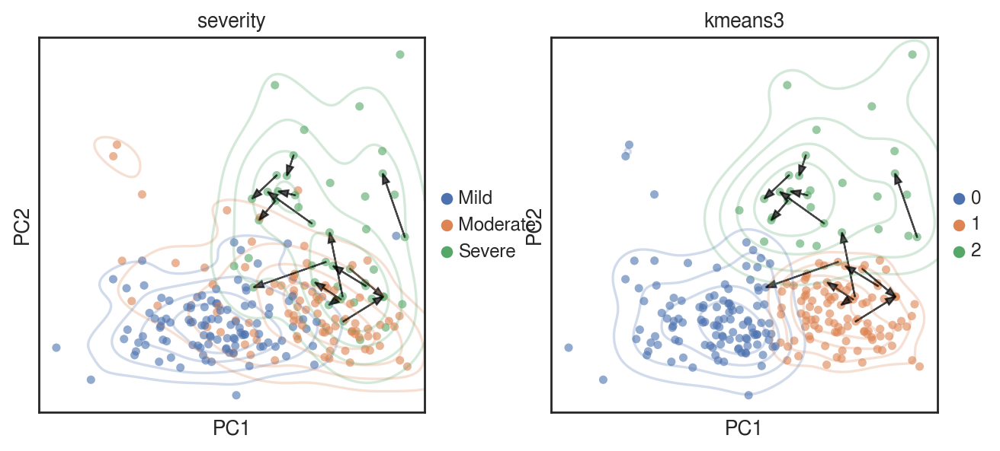

In [1004]:
# Select initially mild, moderate, and severe patients separately
pts_mild = pts[pts['severity_T1']=='Mild']
pts_mod = pts[pts['severity_T1']=='Moderate']
pts_sev = pts[pts['severity_T1']=='Severe']

def plot_trajectories(pts_df, cond):
    adata_integrated_corr_only_mod = adata_integrated_corr_only_test.copy()
    #[pts_df['who_change_cat']==cond] \
    temp = pd.merge(adata_integrated_corr_only_mod.obs, pts_df \
                    [['severity_T1', 'severity_T2', 'who_change', 'who_change_cat']], 
                                                  left_index=True, right_index=True)
    adata_integrated_corr_only_mod = adata_integrated_corr_only_mod[adata_integrated_corr_only_mod.obs['temp'].\
                                                                    isin(temp.index.tolist())]

    adata_integrated_corr_only_mod.obs = temp

    coords = pd.DataFrame(columns=['x', 'y', 'dx', 'dy', 'color']) 
    coords['source_label'] = pd.Series(adata_integrated_corr_only_mod.obsm['X_pca'].index \
                                      ).apply(lambda x: x.split('-')[0]).unique()
    coords.index = coords['source_label']

    for source in coords.index:
        coords.loc[source, 'x'] = adata_integrated_corr_only_mod.obsm['X_pca'].loc[source + '-BL', 'PC1']
        coords.loc[source, 'y'] = adata_integrated_corr_only_mod.obsm['X_pca'].loc[source + '-BL', 'PC2']
        coords.loc[source, 'dx'] = adata_integrated_corr_only_mod.obsm['X_pca'].loc[source + '-AC', 'PC1']
        coords.loc[source, 'dy'] = adata_integrated_corr_only_mod.obsm['X_pca'].loc[source + '-AC', 'PC2']
        if adata_integrated_corr_only_mod.obs.loc[source + '-AC', 'who_change_cat']==cond:
            coords.loc[source, 'color'] = 'black'
        else:
            coords = coords.drop(index=source)
    coords['dx'] -= coords['x']
    coords['dy'] -= coords['y']

    adata_integrated_corr_only_test_temp = adata_integrated_corr_only_test.copy()
    #adata_integrated_corr_only_test_temp.obs['kmeans3'] = adata_integrated_corr_only_test_temp.obs['kmeans3'] #\
        #.map({'0':'0', '1':'2', '2':'1'})
    adata_integrated_corr_only_test_temp.obs['severity'] = \
        adata_integrated_corr_only_test_temp.obs['who_ordinal_scale'].apply(lambda x: 'Mild' if x < 3.0 \
                                                                           else 'Moderate' if x < 5.0 \
                                                                           else 'Severe')
    
    f = sc.pl.pca(adata_integrated_corr_only_test_temp, 
              color=['severity', 'kmeans3'],
              cmap='Oranges', size=100, linewidths=0.1, edgecolors='black', alpha=0.6, show=False)
    
    for i in range(2):
        f[i].set_xlim(xlim)
        f[i].set_ylim(ylim)
    sns.kdeplot(df_test['PC1'], df_test['PC2'], hue=adata_integrated_corr_only_test_temp.obs['severity'], 
         alpha=0.25, levels=[0.1, 0.25, 0.5, 0.75], legend=None, ax=f[0], common_norm=False)
    sns.kdeplot(df_test['PC1'], df_test['PC2'], hue=df_test['kmeans3'], 
         alpha=0.25, levels=[0.1, 0.25, 0.5, 0.75], legend=None, ax=f[1], common_norm=False)

    for row in coords.iterrows():
        f[0].arrow(row[1]['x'], row[1]['y'], row[1]['dx'], row[1]['dy'], length_includes_head=True,
                   width=0.0025, head_width=0.1, color=row[1]['color'], alpha=0.7)
        f[1].arrow(row[1]['x'], row[1]['y'], row[1]['dx'], row[1]['dy'], length_includes_head=True,
                   width=0.0025, head_width=0.1, color=row[1]['color'], alpha=0.7)
        
plot_trajectories(pts_mod, 'Better')
plt.savefig(master_dir + 'output/metabolite_pathway_corrs_only_integrated-moderate-better-trajectories.pdf')

plot_trajectories(pts_mod, 'Worse/Stable')
plt.savefig(master_dir + 'output/metabolite_pathway_corrs_only_integrated-moderate-worse_stable-trajectories.pdf')

plot_trajectories(pts_sev, 'Better')
plt.savefig(master_dir + 'output/metabolite_pathway_corrs_only_integrated-severe-better-trajectories.pdf')

plot_trajectories(pts_sev, 'Worse/Stable')
plt.savefig(master_dir + 'output/metabolite_pathway_corrs_only_integrated-severe-worse_stable-trajectories.pdf')

In [950]:
# Save the integrated metabolites and cell type-specific metabolic pathway activities h5ad 
# Including disease severity, trajectory summary, and k-means clusters
adata_integrated_corr_only_test_temp = adata_integrated_corr_only_test.copy()
adata_integrated_corr_only_test_temp.obs['severity'] = \
        adata_integrated_corr_only_test_temp.obs['who_ordinal_scale'].apply(lambda x: 'Mild' if x < 3.0 \
                                                                           else 'Moderate' if x < 5.0 \
                                                                           else 'Severe')
adata_integrated_corr_only_test_temp.obs = pd.merge(adata_integrated_corr_only_test_temp.obs, pts \
                    [['severity_T1', 'severity_T2', 'who_change', 'who_change_cat']],
                    left_index=True, right_index=True, how='left')
adata_integrated_corr_only_test_temp.obs = adata_integrated_corr_only_test_temp.obs.drop(columns='temp')

In [951]:
adata_integrated_corr_only_test_temp.obs

,source_label,observation_id,incov_redcap_event_name,observation_days_since_enrollment,abdominal_pain,ambulatory,blood_draw_status,blood_draw_status_bad,blood_draw_type,blood_oxygenation,...,time_wrt_Hydroxychloroquine (HCQ),time_wrt_HCQ + Azithromycin,time_wrt_Steroid,time_wrt_Other,time_wrt_Plasma Transfusions,severity,severity_T1,severity_T2,who_change,who_change_cat
temp,,,,,,,,,,,,,,,,,,,,,
INCOV001-AC,INCOV001,d372353b-edf7-4d01-adc9-567603c30bc7,acute_blood_draw_arm_1,5.92,No,Limitation of activities,Complete,nan,Acute,96.0,...,No.T2,No.T2,No.T2,No.T2,No.T2,Moderate,Moderate,Moderate,0.0,Worse/Stable
INCOV001-BL,INCOV001,0136c6b6-5c01-42ca-a1ea-d1286f193041,baseline_blood_dra_arm_1,0.92,No,Limitation of activities,Complete,nan,Baseline,95.0,...,No.T1,No.T1,No.T1,No.T1,No.T1,Moderate,Moderate,Moderate,0.0,Worse/Stable
INCOV002-AC,INCOV002,b21d9bf4-07cf-4d0d-9638-0e02f739f989,acute_blood_draw_arm_1,5.75,Unknown,Limitation of activities,Complete,nan,Acute,91.0,...,After,No.T2,No.T2,No.T2,No.T2,Severe,Severe,Severe,2.0,Worse/Stable
INCOV002-BL,INCOV002,7403b5ac-6810-431e-bc21-f39a81edbf27,baseline_blood_dra_arm_1,0.71,No,Limitation of activities,Complete,nan,Baseline,96.0,...,Before,No.T1,No.T1,No.T1,No.T1,Severe,Severe,Severe,2.0,Worse/Stable
INCOV003-AC,INCOV003,d95c1823-a2e6-4bc7-ab74-695d3bd60d8a,acute_blood_draw_arm_1,7.38,Unknown,Limitation of activities,Incomplete,Reduced Blood Draw at the request of LAR - 8/1...,Acute,94.0,...,After,No.T2,No.T2,No.T2,No.T2,Severe,Severe,Severe,-1.0,Better
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
INCOV136-BL,INCOV136,ff6e5401-15d9-4f4d-b5ff-f10e70882d76,baseline_blood_dra_arm_1,0.58,Unknown,Limitation of activities,Complete,nan,Baseline,96.0,...,No.T1,No.T1,Before,No.T1,No.T1,Moderate,Moderate,Moderate,-1.0,Better
INCOV137-AC,INCOV137,ae288b23-182d-4a8b-a705-8e6862de87c8,acute_blood_draw_arm_1,6.58,Unknown,Limitation of activities,Complete,nan,Acute,95.0,...,No.T2,No.T2,After,No.T2,No.T2,Moderate,Severe,Moderate,-2.0,Better
INCOV137-BL,INCOV137,4db4f459-102a-4391-b94e-8a074d4565e7,baseline_blood_dra_arm_1,4.54,No,Limitation of activities,Complete,nan,Baseline,96.0,...,No.T1,No.T1,Before,No.T1,No.T1,Severe,Severe,Moderate,-2.0,Better


In [952]:
adata_integrated_corr_only_test_temp.write(master_dir + 'output/adata_integrated_corr_only_test_temp.h5ad')

... storing 'severity' as categorical
... storing 'severity_T1' as categorical
... storing 'severity_T2' as categorical
... storing 'who_change_cat' as categorical


... storing 'severity_T1' as categorical
... storing 'severity_T2' as categorical
... storing 'who_change_cat' as categorical


computing density on 'pca'
--> added
    'pca_density_who_change_cat', densities (adata.obs)
    'pca_density_who_change_cat_params', parameter (adata.uns)


... storing 'severity_T1' as categorical
... storing 'severity_T2' as categorical
... storing 'who_change_cat' as categorical


computing density on 'pca'
--> added
    'pca_density_who_change_cat', densities (adata.obs)
    'pca_density_who_change_cat_params', parameter (adata.uns)


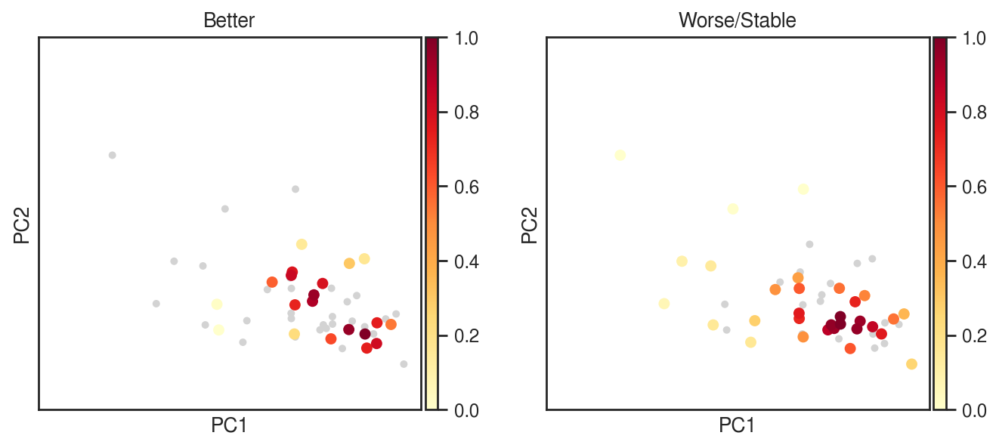

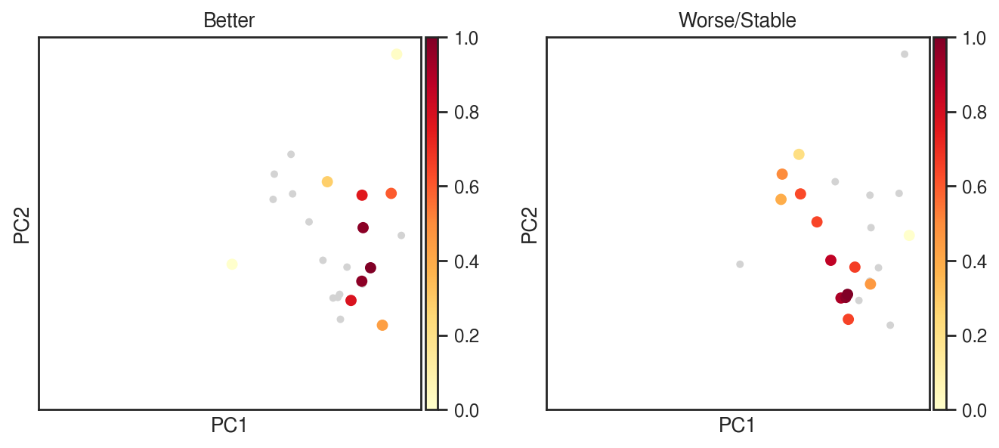

In [600]:
def plot_density(pts_df):
    adata_integrated_corr_only_mod = adata_integrated_corr_only_test.copy()
    #[pts_df['who_change_cat']==cond] \
    temp = pd.merge(adata_integrated_corr_only_mod.obs, pts_df[pts_df['blood_draw_type']=='Baseline'] \
                    [['severity_T1', 'severity_T2', 'who_change', 'who_change_cat']], 
                                                  left_index=True, right_index=True)
    adata_integrated_corr_only_mod = adata_integrated_corr_only_mod[adata_integrated_corr_only_mod.obs['temp'].\
                                                                    isin(temp.index.tolist())]

    adata_integrated_corr_only_mod.obs = temp
    adata_integrated_corr_only_mod.obsm['X_pca'] = adata_integrated_corr_only_mod.obsm['X_pca'].values

    sc.tl.embedding_density(adata_integrated_corr_only_mod, basis='pca', groupby='who_change_cat')
    f = sc.pl.embedding_density(adata_integrated_corr_only_mod, basis='pca', key='pca_density_who_change_cat',
                               show=False)
    
    for i in range(2):
        f[i].set_xlim(xlim)
        f[i].set_ylim(ylim)

plot_density(pts_mod)
plot_density(pts_sev)

computing PCA
    with n_comps=50
    finished (0:00:00)


... storing 'kmeans2' as categorical
... storing 'severity_T1' as categorical
... storing 'severity_T2' as categorical
... storing 'who_change_cat' as categorical
... storing 'kmeans2a' as categorical
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & 

computing PCA
    with n_comps=22
    finished (0:00:00)


... storing 'kmeans2' as categorical
... storing 'severity_T1' as categorical
... storing 'severity_T2' as categorical
... storing 'who_change_cat' as categorical
... storing 'kmeans2a' as categorical
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & 

computing PCA
    with n_comps=50
    finished (0:00:00)


... storing 'kmeans2' as categorical
... storing 'severity_T1' as categorical
... storing 'severity_T2' as categorical
... storing 'who_change_cat' as categorical
... storing 'kmeans2a' as categorical
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & 

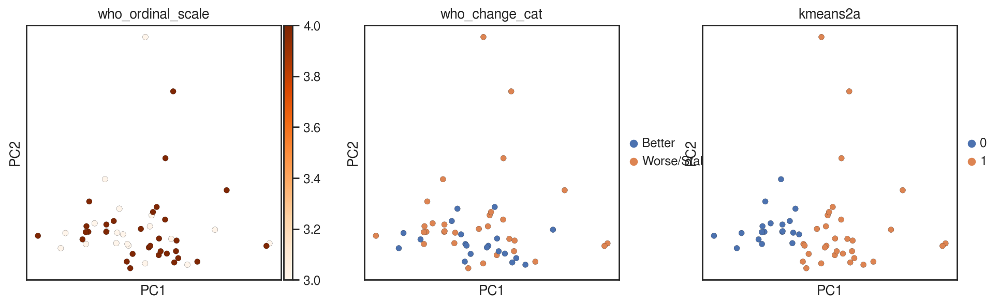

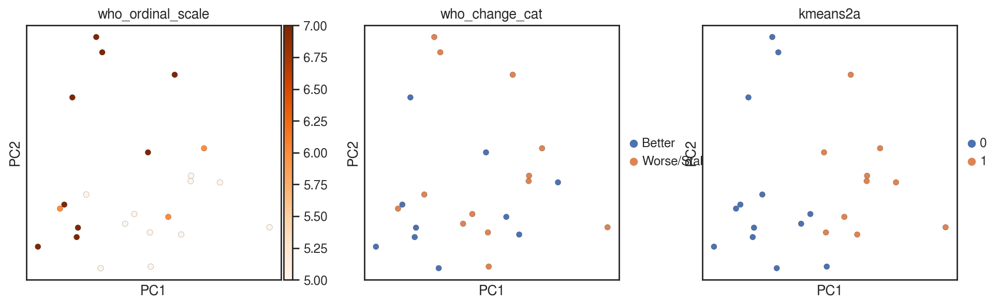

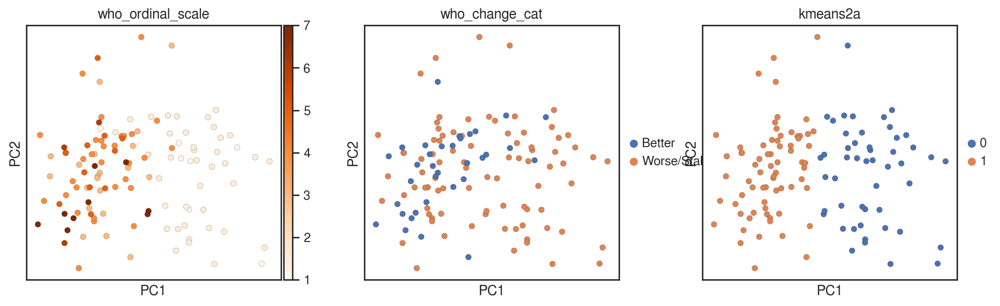

In [622]:
# Try PCA of just the moderate patients and just the severe patients by themselves
def sub_pca(pts_df):
    adata_integrated_corr_only_mod = adata_integrated_corr_only_test.copy()
    #[pts_df['who_change_cat']==cond] \
    temp = pd.merge(adata_integrated_corr_only_mod.obs, pts_df[pts_df['blood_draw_type']=='Baseline'] \
                    [['severity_T1', 'severity_T2', 'who_change', 'who_change_cat']], 
                                                  left_index=True, right_index=True)
    adata_integrated_corr_only_mod = adata_integrated_corr_only_mod[adata_integrated_corr_only_mod.obs['temp'].\
                                                                    isin(temp.index.tolist())]

    adata_integrated_corr_only_mod.obs = temp
    sc.tl.pca(adata_integrated_corr_only_mod, svd_solver='arpack')
    #adata_integrated_corr_only_mod.obsm['X_pca'] = adata_integrated_corr_only_mod.obsm['X_pca'].values
    kmeans = KMeans(n_clusters=2, random_state=0).fit(adata_integrated_corr_only_mod.obsm['X_pca']) 
    adata_integrated_corr_only_mod.obs['kmeans2'] = kmeans.labels_.astype(str)
    adata_integrated_corr_only_mod.obs['kmeans2a'] = adata_integrated_corr_only_mod.obs['kmeans2'].copy()

    f = sc.pl.pca(adata_integrated_corr_only_mod, color=['who_ordinal_scale', 
                  'who_change_cat', 'kmeans2a'], size=100, linewidths=0.1,
                               edgecolor='black', cmap='Oranges', show=False)
    
    #return adata_integrated_corr_only_mod
    #for i in range(2):
    #    f[i].set_xlim(xlim)
    #    f[i].set_ylim(ylim)
    
sub_pca(pts_mod)
sub_pca(pts_sev)
sub_pca(pts)

/home/jwlee/.local/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/jwlee/.local/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/jwlee/.local/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/jwlee/.local/

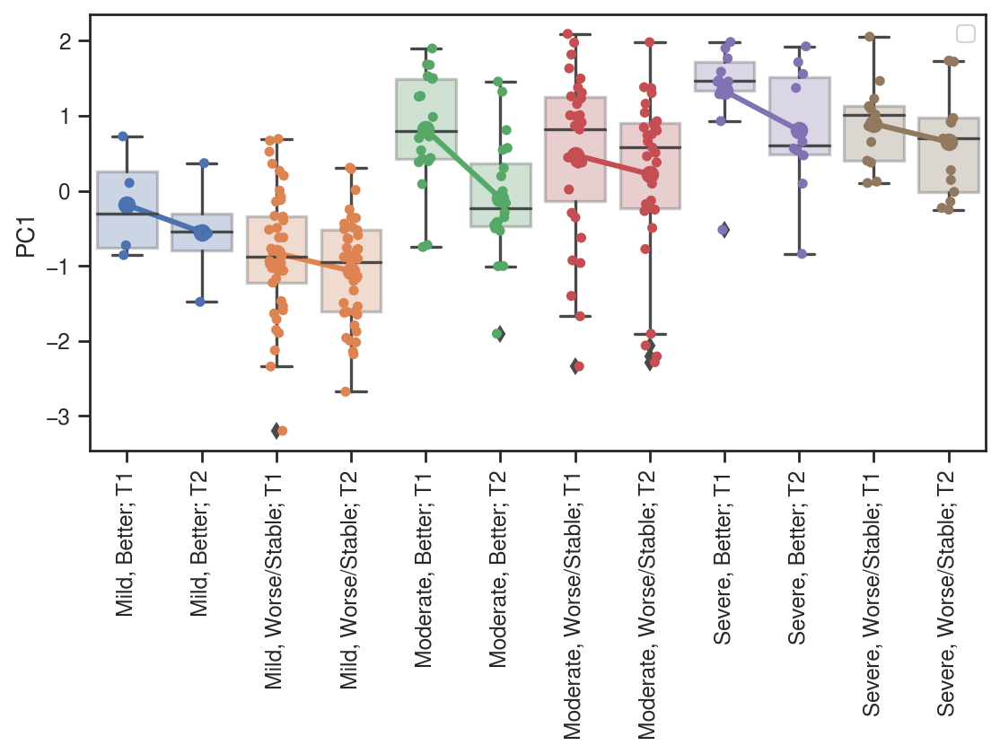

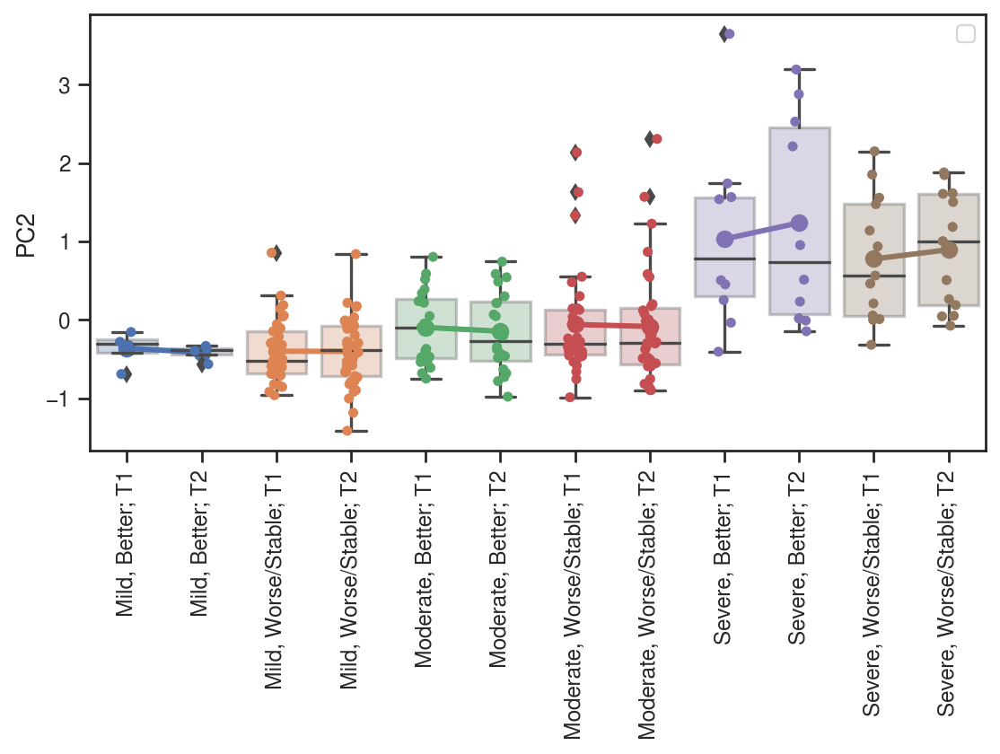

In [721]:
#####

#pts['severity_change_timepoint'] = pts['severity_T1'] + ', ' + pts['who_change_cat'] #+ '; ' + \
    #['T1' if x.split('-')[-1]=='BL' else 'T2' for x in pts['temp']]
#pts_sorted = pts.sort_values(by=['severity_T1', 'who_change_cat'])

#plt.figure(figsize=(8, 4))
#sns.stripplot('severity_change_timepoint', 
#            y=adata_integrated_corr_only_test.obsm['X_pca'].loc[pts.index, 'PC1'],
#             jitter=True, hue=pts_sorted['severity_T1'] + pts_sorted['who_change_cat'], 
#              data=pts_sorted)
#sns.violinplot('severity_change_timepoint', 
#            y=adata_integrated_corr_only_test.obsm['X_pca'].loc[pts.index, 'PC1'], split=True,
#           hue='blood_draw_type', palette='muted', inner='stick',
#            data=pts_sorted, boxprops=dict(alpha=.3))
#sns.pointplot('severity_change_timepoint', 
#            y=adata_integrated_corr_only_test.obsm['X_pca'].loc[pts.index, 'PC1'],
#             jitter=True, hue=pts_sorted['severity_T1'] + pts_sorted['who_change_cat'], 
#              data=pts.sort_values(by=['severity_T1', 'who_change_cat']), ci=None)
#plt.xticks(rotation=90)
#plt.xlabel('')
#plt.legend([])

#####

pts['severity_change_timepoint'] = pts['severity_T1'] + ', ' + pts['who_change_cat'] + '; ' + \
    ['T1' if x.split('-')[-1]=='BL' else 'T2' for x in pts['temp']]
pts_sorted = pts.sort_values(by=['severity_T1', 'who_change_cat', 'source_label'])

f = plt.figure(figsize=(8, 4))

f = sns.stripplot('severity_change_timepoint', 
            y=adata_integrated_corr_only_test.obsm['X_pca'].loc[pts.index, 'PC1'],
             jitter=True, hue=pts_sorted['severity_T1'] + pts_sorted['who_change_cat'], 
              data=pts_sorted)
f = sns.boxplot('severity_change_timepoint', 
            y=adata_integrated_corr_only_test.obsm['X_pca'].loc[pts.index, 'PC1'],
           hue=pts_sorted['severity_T1'] + pts_sorted['who_change_cat'], 
            data=pts_sorted, dodge=False, boxprops=dict(alpha=.3))
f = sns.pointplot('severity_change_timepoint', 
            y=adata_integrated_corr_only_test.obsm['X_pca'].loc[pts.index, 'PC1'],
             jitter=True, hue=pts_sorted['severity_T1'] + pts_sorted['who_change_cat'], 
              data=pts_sorted, ci=None)
#f = plt.plot(pts_sorted['severity_change_timepoint'], adata_integrated_corr_only_test.obsm['X_pca'].loc[pts.index, 'PC1'])
#add_stat_annotation(f, data=pts_sorted, x='severity_change_timepoint', 
#                   y=adata_integrated_corr_only_test.obsm['X_pca'].loc[pts.index, 'PC1'],
#                   box_pairs=np.array(pts_sorted['severity_change_timepoint'].unique())\
#                   .reshape([6, 2]), test='Wilcoxon')
plt.xticks(rotation=90)
plt.xlabel('')
plt.legend([])
#plt.savefig(master_dir + 'output/metabolite_pathway_corrs_only_integrated_PCA1-trajectory.pdf')

f = plt.figure(figsize=(8, 4))
f = sns.stripplot('severity_change_timepoint', 
            y=adata_integrated_corr_only_test.obsm['X_pca'].loc[pts.index, 'PC2'],
             jitter=True, hue=pts_sorted['severity_T1'] + pts_sorted['who_change_cat'], 
              data=pts_sorted)
f = sns.boxplot('severity_change_timepoint', 
            y=adata_integrated_corr_only_test.obsm['X_pca'].loc[pts.index, 'PC2'],
           hue=pts_sorted['severity_T1'] + pts_sorted['who_change_cat'], 
            data=pts_sorted, dodge=False, boxprops=dict(alpha=.3))
f = sns.pointplot('severity_change_timepoint', 
            y=adata_integrated_corr_only_test.obsm['X_pca'].loc[pts.index, 'PC2'],
             jitter=True, hue=pts_sorted['severity_T1'] + pts_sorted['who_change_cat'], 
              data=pts_sorted, ci=None)
#add_stat_annotation(f, data=pts_sorted, x='severity_change_timepoint', 
#                   y=adata_integrated_corr_only_test.obsm['X_pca'].loc[pts.index, 'PC2'],
#                   box_pairs=np.array(pts_sorted['severity_change_timepoint'].unique())\
#                   .reshape([6, 2]), test='Wilcoxon')
plt.xticks(rotation=90)
plt.xlabel('')
plt.legend([])
#plt.savefig(master_dir + 'output/metabolite_pathway_corrs_only_integrated_PCA2-trajectory.pdf')

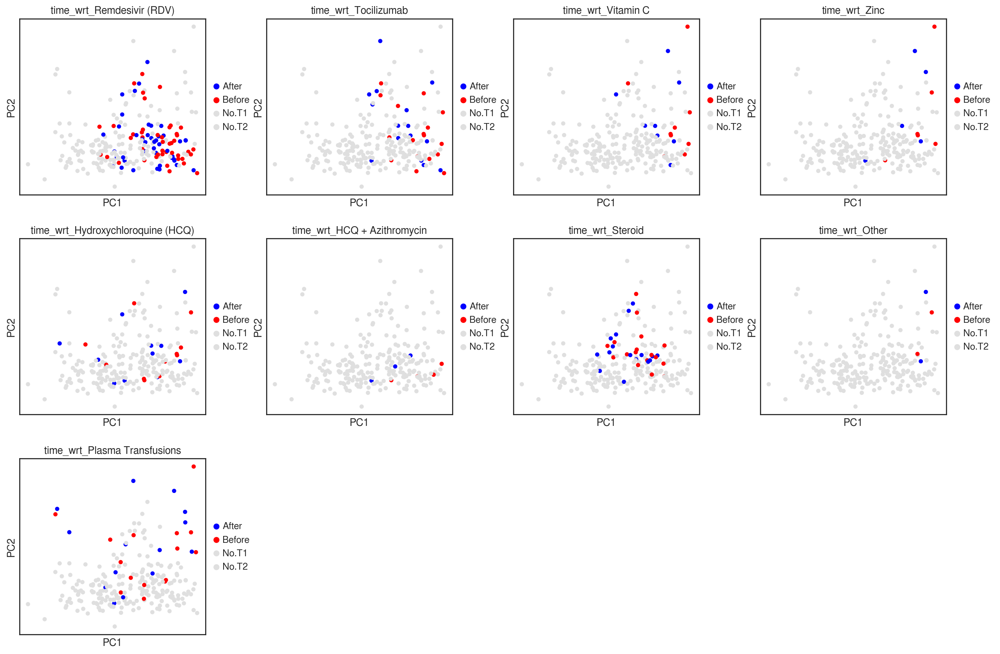

In [237]:
sc.pl.pca(adata_integrated_corr_only_test, 
          color=['time_wrt_Remdesivir (RDV)', 'time_wrt_Tocilizumab',
       'time_wrt_Vitamin C', 'time_wrt_Zinc',
       'time_wrt_Hydroxychloroquine (HCQ)', 'time_wrt_HCQ + Azithromycin',
       'time_wrt_Steroid', 'time_wrt_Other', 'time_wrt_Plasma Transfusions'],
         palette=['#0000ff', '#ff0000', '#dfdfdf', '#dfdfdf'], size=100)


In [ ]:
# Most important PCA components
# Get loading scores of the first two PCs and find the most highly scored metabolites per PC
#loading_scores = pd.DataFrame(abs(adata_integrated.varm['PCs'][:, 0:2]), columns=['PC1', 'PC2'])
#loading_scores.index = adata_integrated.var_names
#loading_scores.to_csv(master_dir + 'output/metabolite_pathway_integrated-PCA1_2-absolute_loading_scores.csv')
#loading_scores = loading_scores.sort_values(by='PC2', ascending=False).reset_index()
#np.where(loading_scores['index']=='mannose')

In [ ]:
# Export PCA coordinates
# Will be used for clinical correlations
#adata_integrated_corr_only_test.obsm['X_pca'].to_csv(master_dir + 
#                                                     'output/metabolite_pathway_corrs_only_integrated_PCA1_2-coordinates.csv')

In [167]:
# Bar plot of metabolic pathways and metabolites most highly correlated with the PC coordinates
pc1_corrs = pd.DataFrame(adata_integrated_corr_only_test.X, columns = adata_integrated_corr_only_test.var_names)
pc2_corrs = pd.DataFrame(adata_integrated_corr_only_test.X, columns = adata_integrated_corr_only_test.var_names)

temp1 = pc1_corrs.apply(lambda col: spearmanr(col, 
            #adata_integrated_corr_only.obsm['X_pca'][:, 0]), axis=0)
            adata_integrated_corr_only_test.obsm['X_pca'].loc[:, 'PC1']), axis=0)
temp2 = pc1_corrs.apply(lambda col: spearmanr(col, 
            #adata_integrated_corr_only.obsm['X_pca'][:, 1]), axis=0)
            adata_integrated_corr_only_test.obsm['X_pca'].loc[:, 'PC2']), axis=0)

pc1_corrs = temp1
pc1_corrs.index = ['Spearman r', 'p-value']
pc1_corrs = pc1_corrs.transpose()

pc2_corrs = temp2
pc2_corrs.index = ['Spearman r', 'p-value']
pc2_corrs = pc2_corrs.transpose()

pc1_corrs = pc1_corrs.sort_values(by='Spearman r', ascending=False)
pc2_corrs = pc2_corrs.sort_values(by='Spearman r', ascending=False)

#pc1_corrs = pc1_corrs[pc1_corrs['p-value'] < 0.05]
#pc2_corrs = pc2_corrs[pc2_corrs['p-value'] < 0.05]

In [169]:
pc1_corrs['category'] = 'metabolite'
for celltype in celltypes:
    pc1_corrs.loc[pc1_corrs.index.str.startswith(celltype + '_'), 'category'] = celltype

pc2_corrs['category'] = 'metabolite'
for celltype in celltypes:
    pc2_corrs.loc[pc2_corrs.index.str.startswith(celltype + '_'), 'category'] = celltype

In [170]:
pc1_corrs_tops = pc1_corrs[pc1_corrs['Spearman r'] > 0].groupby('category')['Spearman r'].nlargest(5).reset_index()
pc1_corrs_tops = pd.concat([pc1_corrs_tops, 
                 pc1_corrs[pc1_corrs['Spearman r'] < 0].groupby('category')['Spearman r'].nsmallest(5).reset_index()])
pc1_corrs_tops.index = pc1_corrs_tops['level_1']

pc2_corrs_tops = pc2_corrs[pc2_corrs['Spearman r'] > 0].groupby('category')['Spearman r'].nlargest(5).reset_index()
pc2_corrs_tops = pd.concat([pc2_corrs_tops, 
                 pc2_corrs[pc2_corrs['Spearman r'] < 0].groupby('category')['Spearman r'].nsmallest(5).reset_index()])
pc2_corrs_tops.index = pc2_corrs_tops['level_1']

#pc1_corrs_tops = pc1_corrs.groupby('category')['Spearman r'].nlargest(10).reset_index()
#pc1_corrs_tops = pd.concat([pc1_corrs_tops, 
#                 pc1_corrs.groupby('category')['Spearman r'].nsmallest(10).reset_index()])
#pc1_corrs_tops.index = pc1_corrs_tops['level_1']

#pc2_corrs_tops = pc2_corrs.groupby('category')['Spearman r'].nlargest(10).reset_index()
#pc2_corrs_tops = pd.concat([pc2_corrs_tops, 
#                 pc2_corrs.groupby('category')['Spearman r'].nsmallest(10).reset_index()])
#pc2_corrs_tops.index = pc2_corrs_tops['level_1']

pc1_corrs_tops.index.name = 'Pathway/metabolite'
pc2_corrs_tops.index.name = 'Pathway/metabolite'

pc1_corrs_tops = pd.merge(pc1_corrs_tops, pc1_corrs['p-value'], 
                    left_index=True, right_index=True, how='left').sort_values(by=['Spearman r'], ascending=False)
pc2_corrs_tops = pd.merge(pc2_corrs_tops, pc2_corrs['p-value'], 
                    left_index=True, right_index=True, how='left').sort_values(by=['Spearman r'], ascending=False)

In [172]:
# Write to Excel sheets
# Create a Pandas Excel writer using XlsxWriter as the engine.
writer = pd.ExcelWriter(master_dir + 
         'output/metabolite_pathway_corrs_only_integrated_PCA1_2-top_correlations_with_PCs-201204.xlsx', 
         engine='xlsxwriter')

# Write each dataframe to a different worksheet.
pc1_corrs_tops.to_excel(writer, sheet_name='PC1_top')
pc2_corrs_tops.to_excel(writer, sheet_name='PC2_top')

# Close the Pandas Excel writer and output the Excel file.
writer.save()

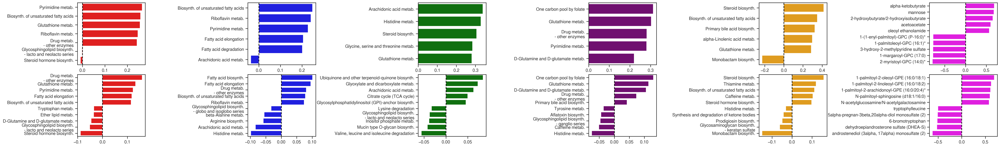

In [181]:
# Plot the top 5 most postiively and negatively correlated pathways and metabolites per cell type/metabolite 
sns.set_style('ticks', rc={'font':'FreeSans', 'font.family':'sans-serif', 'font.sans-serif':'FreeSans'})

fig, axes = plt.subplots(2, 6, figsize=(35, 5))
pc_corrs = [pc1_corrs_tops, pc2_corrs_tops]
celltypes_m = celltypes + ['metabolite']
colors = ['red', 'blue', 'green', 'purple', 'orange', 'magenta']
for i in range(2):
    #pc_corr = pc_corrs[i]
    for j in range(6):    
        pc_corr = pc_corrs[i]
        sns.barplot(y=pc_corr[pc_corr['category']==celltypes_m[j]].index, 
                    x='Spearman r', data=pc_corr[pc_corr['category']==celltypes_m[j]], 
                    color=colors[j], orient='h', ax=axes[i, j])
        #axes[0, 0].set(xlim=(-0.05, 0.5))
        axes[i, j].axvline(0, ls='--', color='black')
        
        yticklabels=pc_corr[pc_corr['category']==celltypes_m[j]]['level_1'].apply(lambda x: \
                     x.split('_')[-1].replace(' - ', '\n- ').replace('biosynthesis', 'biosynth.')\
                     .replace('Biosynthesis', 'Biosynth.').replace('metabolism', 'metab.')\
                     .replace('Metabolism', 'Metab.'))
        axes[i, j].set(xlabel='', ylabel='', 
            yticklabels=yticklabels)
plt.tight_layout(pad=0.1)
plt.savefig(master_dir + 'output/metabolite_pathway_corrs_only_integrated_PCA1_2-top_correlations_with_PCs-201204.pdf')

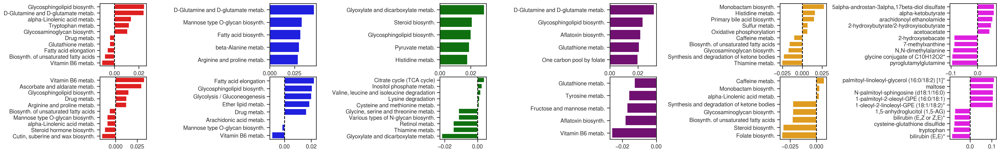

In [213]:
ls1_corrs = pd.DataFrame(loading_scores.loc[:, 0])
ls2_corrs = pd.DataFrame(loading_scores.loc[:, 1])
ls1_corrs.columns = ['s']
ls2_corrs.columns = ['s']

ls1_corrs['category'] = 'metabolite'
for celltype in celltypes:
    ls1_corrs.loc[ls1_corrs.index.str.startswith(celltype + '_'), 'category'] = celltype

ls2_corrs['category'] = 'metabolite'
for celltype in celltypes:
    ls2_corrs.loc[ls2_corrs.index.str.startswith(celltype + '_'), 'category'] = celltype

ls1_corrs['abs'] = abs(ls1_corrs.loc[:, 's'])
ls2_corrs['abs'] = abs(ls2_corrs.loc[:, 's'])
ls1_corrs_tops = ls1_corrs.sort_values(by='s', ascending=True)
ls2_corrs_tops = ls2_corrs.sort_values(by='s', ascending=True)

ls1_corrs_tops = ls1_corrs[ls1_corrs['s'] > 0].groupby('category')['s'].nlargest(5).reset_index()
ls1_corrs_tops = pd.concat([ls1_corrs_tops, 
                 ls1_corrs[ls1_corrs['s'] < 0].groupby('category')['s'].nsmallest(5).reset_index()]).sort_values(by='s', ascending=False)
ls1_corrs_tops.index = ls1_corrs_tops['level_1']

ls2_corrs_tops = ls2_corrs[ls2_corrs['s'] > 0].groupby('category')['s'].nlargest(5).reset_index()
ls2_corrs_tops = pd.concat([ls2_corrs_tops, 
                 ls2_corrs[ls2_corrs['s'] < 0].groupby('category')['s'].nsmallest(5).reset_index()]).sort_values(by='s', ascending=False)
ls2_corrs_tops.index = ls2_corrs_tops['level_1']

#pc1_corrs_tops = pc1_corrs.groupby('category')['Spearman r'].nlargest(10).reset_index()
#pc1_corrs_tops = pd.concat([pc1_corrs_tops, 
#                 pc1_corrs.groupby('category')['Spearman r'].nsmallest(10).reset_index()])
#pc1_corrs_tops.index = pc1_corrs_tops['level_1']

#pc2_corrs_tops = pc2_corrs.groupby('category')['Spearman r'].nlargest(10).reset_index()
#pc2_corrs_tops = pd.concat([pc2_corrs_tops, 
#                 pc2_corrs.groupby('category')['Spearman r'].nsmallest(10).reset_index()])
#pc2_corrs_tops.index = pc2_corrs_tops['level_1']

pc1_corrs_tops.index.name = 'Pathway/metabolite'
pc2_corrs_tops.index.name = 'Pathway/metabolite'

# Plot the top 5 most postiively and negatively correlated pathways and metabolites per cell type/metabolite 
#sns.set_style('ticks', rc={'font':'FreeSans', 'font.family':'sans-serif', 'font.sans-serif':'FreeSans'})

fig, axes = plt.subplots(2, 6, figsize=(27, 4))
pc_corrs = [ls1_corrs_tops, ls2_corrs_tops]
celltypes_m = celltypes + ['metabolite']
colors = ['red', 'blue', 'green', 'purple', 'orange', 'magenta']
for i in range(2):
    #pc_corr = pc_corrs[i]
    for j in range(6):    
        pc_corr = pc_corrs[i]
        sns.barplot(y=pc_corr[pc_corr['category']==celltypes_m[j]].index, 
                    x='s', data=pc_corr[pc_corr['category']==celltypes_m[j]], 
                    color=colors[j], orient='h', ax=axes[i, j])
        #axes[0, 0].set(xlim=(-0.05, 0.5))
        axes[i, j].axvline(0, ls='--', color='black')
        
        yticklabels=pc_corr[pc_corr['category']==celltypes_m[j]]['level_1'].apply(lambda x: \
                     x.split('_')[-1].split(' - ')[0].replace('biosynthesis', 'biosynth.')\
                     .replace('Biosynthesis', 'Biosynth.').replace('metabolism', 'metab.')\
                     .replace('Metabolism', 'Metab.'))
        axes[i, j].set(xlabel='', ylabel='', 
            yticklabels=yticklabels)
plt.tight_layout(pad=0.1)
plt.savefig(master_dir + 'output/metabolite_pathway_corrs_only_integrated_PCA1_2-top_loading_scores-201204.pdf')

In [199]:
ls1_corrs['category'].unique()

array(['metabolite', 'cd8', 'Monocyte', 'B_wo_patient4', 'cd4', 'NK'],
      dtype=object)

In [194]:
celltypes

['cd8', 'cd4', 'B_wo_patient4', 'NK', 'Monocyte']

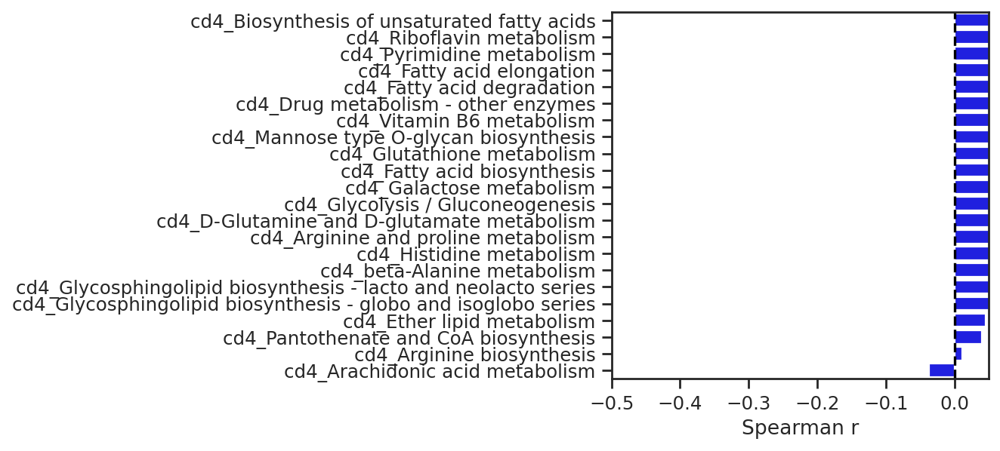

In [179]:
# Plot the top 5 most postiively and negatively correlated pathways and metabolites per cell type/metabolite 
sns.set_style('ticks', rc={'font':'FreeSans', 'font.family':'sans-serif', 'font.sans-serif':'FreeSans'})

fig, axes = plt.subplots(2, 6, figsize=(35, 5))
pc_corrs = [pc1_corrs_tops, pc2_corrs_tops]
celltypes_m = celltypes + ['metabolite']
colors = ['red', 'blue', 'green', 'purple', 'orange', 'magenta']
for i in range(2):
    #pc_corr = pc_corrs[i]
    for j in range(6):    
        pc_corr = pc_corrs[i]
        sns.barplot(y=pc_corr[pc_corr['category']==celltypes_m[j]].index, 
                    x='Spearman r', data=pc_corr[pc_corr['category']==celltypes_m[j]], 
                    color=colors[j], orient='h', ax=axes[i, j])
        #axes[0, 0].set(xlim=(-0.05, 0.5))
        axes[i, j].axvline(0, ls='--', color='black')
        
        yticklabels=pc_corr[pc_corr['category']==celltypes_m[j]]['level_1'].apply(lambda x: \
                     x.split('_')[-1].replace(' - ', '\n- ').replace('biosynthesis', 'biosynth.')\
                     .replace('Biosynthesis', 'Biosynth.').replace('metabolism', 'metab.')\
                     .replace('Metabolism', 'Metab.'))
        axes[i, j].set(xlabel='', ylabel='', 
            yticklabels=yticklabels)
plt.tight_layout(pad=0.1)
plt.savefig(master_dir + 'output/metabolite_pathway_corrs_only_integrated_PCA1_2-top_correlations_with_PCs-201204.pdf')

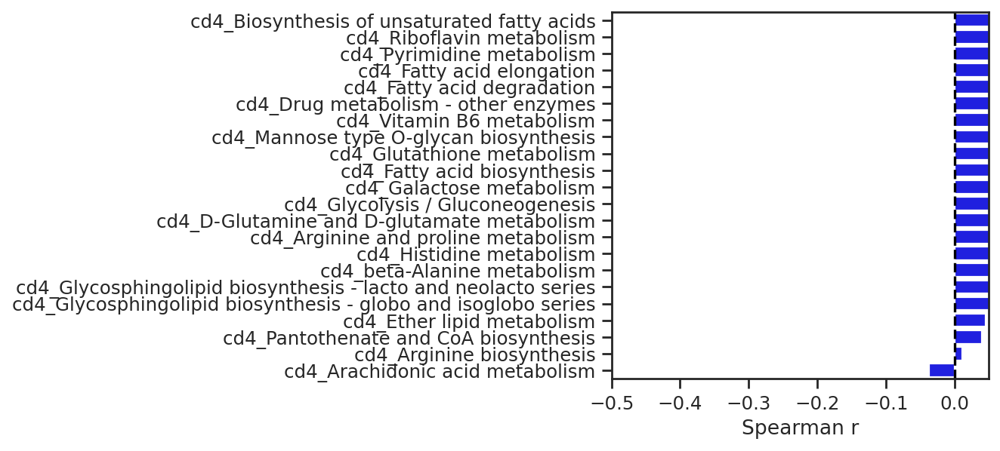

In [180]:
sns.set_style('ticks')
fig = sns.barplot(y=pc1_corrs[pc1_corrs['category']=='cd4'].index, 
            x='Spearman r', data=pc1_corrs[pc1_corrs['category']=='cd4'], color='blue', orient='h')
fig.set(xlim=(-0.5, 0.05))
fig.axvline(0, ls='--', color='black')

In [ ]:
pc2_corrs[pc2_corrs['category']=='metabolite']

In [ ]:
sns.barplot(x=pc1_corrs[pc1_corrs['category']=='cd4'].index, 
            y='Spearman r', data=pc1_corrs[pc1_corrs['category']=='cd4'], color='blue')

In [ ]:
loading_scores = pd.read_csv(master_dir + 
                'output/metabolite_pathway_corrs_only_integrated-PCA-loading_scores.csv', index_col=0)

pathway_activities_list = pd.DataFrame()

for c in celltypes:
    sig_pathways = pd.read_csv(master_dir + 'output/pathway_activity/pathway_activity_trends/' + 
                               c + '-all_cells.csv', 
                               sep=',', header=0)
    sig_pathways.index = c + '_' + sig_pathways['0']
    sig_pathways = sig_pathways.drop(columns='0')
    
    pathway_activities_list = pd.concat([pathway_activities_list, sig_pathways])

pathway_metabolites_list = pd.concat([pathway_activities_list, sig_metabolites])
    
loading_scores = pd.read_csv(master_dir + 'output/metabolite_pathway_corrs_only_integrated-PCA-loading_scores.csv', index_col=0)
pc1 = pd.DataFrame(np.empty([len(loading_scores), 6]), 
                   columns=['PC', 'loading_score', 'loading_score_abs', 'Spearman', 'p-value', 'category'])
pc1.index = loading_scores.index
pc1['PC'] = 1
pc1['loading_score'] = loading_scores['0']
pc1['loading_score_abs'] = abs(pc1['loading_score'])
pc1[['Spearman', 'p-value']] = pathway_metabolites_list.loc[pc1.index.tolist(), ['Spearman', 'p-value']]
for i in pc1.index:
    marked = False
    for c in celltypes:
        if (c + '_') in i:
            pc1.loc[i, 'category'] = c
            marked = True
    if marked == False:
        pc1.loc[i, 'category'] = 'metabolite'
    

pc2 = pc1.copy()
pc2['PC'] = 2
pc2['loading_score'] = loading_scores['1']
pc2['loading_score_abs'] = abs(pc2['loading_score'])

# Select the top 10 of each pathway per cell type and of each metabolite per PC
pc1g = pc1.groupby('category')['loading_score_abs'].nlargest(10).loc[celltypes + ['metabolite']].reset_index()
pc2g = pc2.groupby('category')['loading_score_abs'].nlargest(10).loc[celltypes + ['metabolite']].reset_index()

pc1g = pd.merge(pc1g, pc1, left_on='level_1', right_index=True, how='left')
pc2g = pd.merge(pc2g, pc2, left_on='level_1', right_index=True, how='left')

pc1g.index = pc1g['level_1']
pc2g.index = pc2g['level_1']
pc1g['short_index'] = [x.split('_')[-1] for x in pc1g['level_1']]
pc2g['short_index'] = [x.split('_')[-1] for x in pc2g['level_1']]

fig = plt.figure(figsize=(22, 0.5))
sns.set_style('white')
heatmap.heatmap(
    x=pc1g.index,#['short_index'],
    ylabel='PC1',
    y=pc1g['PC'],
    color=pc1g['Spearman'],
    size=abs(pc1g['loading_score']),
    palette=sns.color_palette('coolwarm'),
    norm=DivergingNorm(0),
    x_order=[x for x in pathway_metabolites_list.index if x in pc1g.index]
)
#plt.save_fig()
# https://towardsdatascience.com/better-heatmaps-and-correlation-matrix-plots-in-python-41445d0f2bec

In [ ]:
fig = plt.figure(figsize=(24, 0.5))
sns.set_style('white')
heatmap.heatmap(
    x=pc2g.index,#['short_index'],
    ylabel='PC2',
    y=pc2g['PC'],
    color=pc2g['Spearman'],
    size=abs(pc2g['loading_score']),
    palette=sns.color_palette('coolwarm'),
    norm=DivergingNorm(0),
    x_order=[x for x in pathway_metabolites_list.index if x in pc2g.index]
)

In [ ]:
fig = plt.figure(figsize=(30, 1))
#fig = plt.figure(figsize=(2, 25))
pcg = pd.concat([pc1g, pc2g])
#sns.set_theme()
sns.set_style('white')

heatmap.heatmap(
    x=pcg['level_1'],
    ylabel='PC',
    y=pcg['PC'],
    color=pcg['Spearman'],
    size=abs(pcg['loading_score']),
    palette=sns.color_palette('coolwarm', n_colors=256),
    norm=DivergingNorm(0),
    color_range=[-0.75, 0.75],
    size_range=[0, 0.31],
    x_order=[x for x in pathway_metabolites_list.index if x in pcg.index] # [::-1] if x in pcg.index]
)
#plt.savefig(master_dir + 'output/metabolite_pathway_corrs_only_integrated-PCA1_2-loading_scores-horizontal.pdf')

In [ ]:
sc.pl.pca(adata_integrated_corr_only_test, color=list(pcg['level_1']), size=100, cmap='coolwarm', 
          norm=DivergingNorm(0.0))

<Figure size 320x320 with 0 Axes>

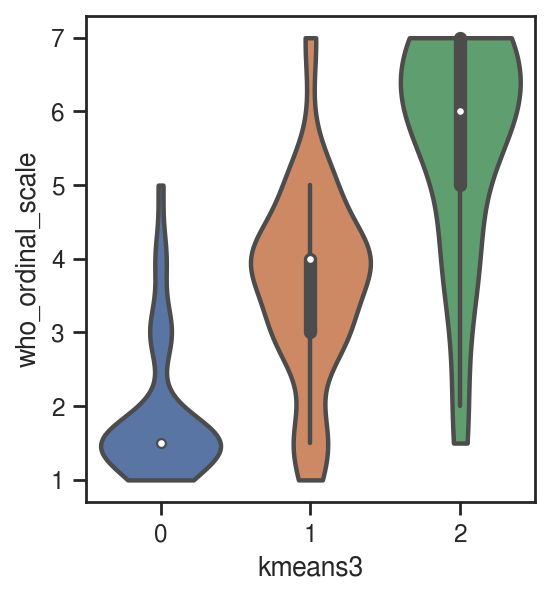

<Figure size 320x320 with 0 Axes>

In [1003]:
plt.figure()
sc.pl.violin(adata_integrated_corr_only_test, 'who_ordinal_scale', 'kmeans3', inner='box', linewidth=2, size=0)
plt.savefig(master_dir + 'output/metabolite_pathway_corrs_only_integrated-kmeans3-WHO_distribution.pdf')

In [1015]:
# Statistical significance of the difference in WHO score of the K means clusters
mannwhitneyu(adata_integrated_corr_only_test.obs[adata_integrated_corr_only_test.obs['kmeans3']=='0']['who_ordinal_scale'],
            adata_integrated_corr_only_test.obs[adata_integrated_corr_only_test.obs['kmeans3']=='1']['who_ordinal_scale'],
            alternative='two-sided')

MannwhitneyuResult(statistic=1655.5, pvalue=2.548533488837733e-20)

In [1016]:
# Statistical significance of the difference in WHO score of the K means clusters
mannwhitneyu(adata_integrated_corr_only_test.obs[adata_integrated_corr_only_test.obs['kmeans3']=='1']['who_ordinal_scale'],
            adata_integrated_corr_only_test.obs[adata_integrated_corr_only_test.obs['kmeans3']=='2']['who_ordinal_scale'],
            alternative='two-sided')

MannwhitneyuResult(statistic=516.0, pvalue=1.8787882553895558e-08)

In [1017]:
# Statistical significance of the difference in WHO score of the K means clusters
mannwhitneyu(adata_integrated_corr_only_test.obs[adata_integrated_corr_only_test.obs['kmeans3']=='0']['who_ordinal_scale'],
            adata_integrated_corr_only_test.obs[adata_integrated_corr_only_test.obs['kmeans3']=='2']['who_ordinal_scale'],
            alternative='two-sided')

MannwhitneyuResult(statistic=131.5, pvalue=7.520369600166975e-17)

In [ ]:
# Box plots of patient expressions
cd8_list = ['cd8_D-Glutamine and D-glutamate metabolism', 
            'cd8_Glycosaminoglycan biosynthesis - heparan sulfate / heparin',
            'cd8_Biosynthesis of unsaturated fatty acids', 'cd8_Pyrimidine metabolism']
cd4_list = ['cd4_Mannose type O-glycan biosynthesis', 'cd4_Fatty acid biosynthesis', 
           'cd4_Glycolysis / Gluconeogenesis']
b_list = ['B_wo_patient4_Various types of N-glycan biosynthesis', 'B_wo_patient4_Arachidonic acid metabolism',
         'B_wo_patient4_Glycosphingolipid biosynthesis - lacto and neolacto series',
         'B_wo_patient4_Glycosphingolipid biosynthesis - ganglio series', 'B_wo_patient4_Steroid biosynthesis']
nk_list = ['NK_Glutathione metabolism', 'NK_Primary bile acid biosynthesis', 'NK_One carbon pool by folate', 
           'NK_Pyrimidine metabolism']
mono_list = ['Monocyte_Folate biosynthesis', 'Monocyte_Steroid biosynthesis', 'Monocyte_Oxidative phosphorylation',
            'Monocyte_Thiamine metabolism', 'Monocyte_Steroid hormone biosynthesis']
metab_list = ['7-methylxanthine', 'N-palmitoyl-sphingosine (d18:1/16:0)', '1-palmitoyl-2-arachidonoyl-GPE (16:0/20:4)*',
             'palmitoyl-linoleoyl-glycerol (16:0/18:2) [1]*']

sc.pl.stacked_violin(adata_integrated_corr_only_test, [x for x in pcg['level_1'] if 'cd8_' in x], 'kmeans3', swap_axes=True,
                    vmin=-0.5, vmax=0.5, figsize=(1.5, 12), inner='box', linewidth=1.25)

In [ ]:
sc.pl.stacked_violin(adata_integrated_corr_only_test, [x for x in pcg['level_1'] if 'cd4_' in x], 'kmeans3', swap_axes=True,
                    vmin=-0.5, vmax=0.5, figsize=(1.5, 12), inner='box', linewidth=1.25)

In [ ]:
sc.pl.stacked_violin(adata_integrated_corr_only_test, [x for x in pcg['level_1'] if 'B_wo_patient4_' in x], 
                     'kmeans3', swap_axes=True, vmin=-0.5, vmax=0.5, figsize=(1.5, 12), inner='box', linewidth=1.25)

In [ ]:
sc.pl.stacked_violin(adata_integrated_corr_only_test, [x for x in pcg['level_1'] if 'NK_' in x], 'kmeans3', swap_axes=True,
                    vmin=-0.5, vmax=0.5, figsize=(1.5, 12), inner='box', linewidth=1.25)

In [ ]:
sc.pl.stacked_violin(adata_integrated_corr_only_test, [x for x in pcg['level_1'] if 'Monocyte_' in x], 
                     'kmeans3', swap_axes=True,
                    vmin=-0.5, vmax=0.5, figsize=(1.5, 12), inner='box', linewidth=1.25)

### Hierarchical clustering test

In [ ]:
#df_serum_and_pathways_nona = df_serum_and_pathways.fillna(value=0) / np.sum(df_serum_and_pathways.fillna(value=0), axis=0)
#df_serum_and_pathways_nona = df_serum_and_pathways_nona.fillna(value=0)
#sns.clustermap(df_serum_and_pathways_nona, figsize=(250, 20), cmap='viridis')
#plt.savefig(master_dir + 'output/integrated_clustermap.pdf')